In [2]:
import pickle
import pandas as pd
import numpy as np
import os

# 엑셀 파일에서 LLM 데이터 로드하는 함수
def load_llm_data_from_excel(excel_path="llm_summary.xlsx"):
    """
    엑셀 파일에서 LLM 성능 데이터를 로드합니다.
    
    Returns:
        dict: {taskprop: {metric: [model_values]}} 형태의 딕셔너리
    """
    
    # 엑셀 파일의 각 시트별 데이터 저장
    llm_data = {}
    
    # 시트 이름들
    sheet_names = ['MAE', 'Median_AE', 'Std_AE', 'Total_R2', 'Block_R2_Mean', 'Block_R2_Std']
    
    # 각 시트에서 데이터 읽기
    for sheet_name in sheet_names:
        try:
            df = pd.read_excel(excel_path, sheet_name=sheet_name)
            
            # taskprop을 인덱스로 설정
            df.set_index('taskprop', inplace=True)
            
            # 각 taskprop에 대해 데이터 저장
            for taskprop in df.index:
                if taskprop not in llm_data:
                    llm_data[taskprop] = {}
                
                # 해당 시트의 모든 모델 값들을 리스트로 저장
                llm_data[taskprop][sheet_name] = df.loc[taskprop].tolist()
                
        except Exception as e:
            print(f"❌ 시트 '{sheet_name}' 로드 실패: {str(e)}")
    
    return llm_data

# LLM 모델 이름들
llm_models = [
    "gpt-4o-2024-08-06", 
    "claude-3-5-sonnet-20241022", 
    "gemini-2.5-flash", 
    "grok-3", 
    "llama-3.3-70b", 
    "gpt-oss-120b", 
    "deepseek-chat"
]

# 작업 설정
tasks = ['raw', 'robust_zscore', 'lt', 'sq', 'lg', 'sn', 'ex']
props = ['mw', 'logp', 'sp3', 'tpsa', 'mr', 'chi', 'hka', 'bj']
embeddings = ['ecfp', 'rdkit', 'maccs', 'chemberta']

def create_taskprop_key(task, prop):
    """
    task와 prop을 결합하여 taskprop 키를 생성합니다.
    파일명: results_sq_mw_rdkit.pkl
    엑셀키: sqmw
    """
    # task 이름 매핑
    task_mapping = {
        'raw': 'raw',
        'robust_zscore': 'robust_zscore',
        'lt': 'lt',
        'sq': 'sq',
        'lg': 'lg', 
        'sn': 'sn',
        'ex': 'ex'
    }
    
    mapped_task = task_mapping.get(task, task)
    # 파일명에는 언더스코어가 있지만 엑셀 키에는 없음
    return f"{mapped_task}{prop}"

def add_llm_to_pickle_files(llm_data, base_path="../ml_results/"):
    """
    모든 pickle 파일에 LLM 성능 데이터를 추가합니다.
    
    Args:
        llm_data (dict): 엑셀에서 로드한 LLM 데이터
        base_path (str): pickle 파일들이 있는 기본 경로
    """
    
    updated_count = 0
    error_count = 0
    
    for task in tasks:
        for prop in props:
            # taskprop 키 생성
            taskprop_key = create_taskprop_key(task, prop)
            
            if taskprop_key not in llm_data:
                print(f"❌ LLM 데이터에서 키를 찾을 수 없음: {taskprop_key}")
                error_count += 1
                continue
            
            for embedding in embeddings:
                filename = f"results_{task}_{prop}_{embedding}.pkl"
                filepath = os.path.join(base_path, filename)
                
                # 파일이 존재하는지 확인
                if not os.path.exists(filepath):
                    print(f"⚠️  파일이 존재하지 않음: {filename}")
                    continue
                
                try:
                    # pickle 파일 로드
                    with open(filepath, 'rb') as f:
                        df = pickle.load(f)
                    
                    # DataFrame인지 확인
                    if not isinstance(df, pd.DataFrame):
                        print(f"❌ DataFrame이 아님: {filename}")
                        error_count += 1
                        continue
                    
                    # 기존에 LLM 모델들이 있는지 확인 (중복 방지)
                    existing_llm_models = [model for model in llm_models if model in df.index]
                    if existing_llm_models:
                        print(f"⚠️  이미 LLM 데이터가 있음: {filename} - {existing_llm_models}")
                        continue
                    
                    # LLM 데이터를 위한 새로운 행들 생성
                    new_rows = []
                    
                    for i, model_name in enumerate(llm_models):
                        new_row = {
                            'MAE': llm_data[taskprop_key]['MAE'][i] if 'MAE' in llm_data[taskprop_key] else np.nan,
                            'Median_AE': llm_data[taskprop_key]['Median_AE'][i] if 'Median_AE' in llm_data[taskprop_key] else np.nan,
                            'Std_AE': llm_data[taskprop_key]['Std_AE'][i] if 'Std_AE' in llm_data[taskprop_key] else np.nan,
                            'Total_R2': llm_data[taskprop_key]['Total_R2'][i] if 'Total_R2' in llm_data[taskprop_key] else np.nan,
                            'Block_R2_Mean': llm_data[taskprop_key]['Block_R2_Mean'][i] if 'Block_R2_Mean' in llm_data[taskprop_key] else np.nan,
                            'Block_R2_Std': llm_data[taskprop_key]['Block_R2_Std'][i] if 'Block_R2_Std' in llm_data[taskprop_key] else np.nan
                        }
                        new_rows.append(new_row)
                    
                    # 새로운 행들을 DataFrame으로 변환
                    new_df = pd.DataFrame(new_rows, index=llm_models)
                    
                    # 기존 DataFrame과 결합
                    updated_df = pd.concat([df, new_df])
                    
                    # 파일 저장
                    with open(filepath, 'wb') as f:
                        pickle.dump(updated_df, f)
                    
                    print(f"✅ LLM 데이터 추가 완료: {filename}")
                    print(f"   - taskprop: {taskprop_key}")
                    print(f"   - 추가된 모델 수: {len(llm_models)}")
                    print(f"   - 최종 DataFrame 크기: {updated_df.shape}")
                    updated_count += 1
                    
                except Exception as e:
                    print(f"❌ 오류 발생: {filename} - {str(e)}")
                    error_count += 1
    
    print(f"\n📊 LLM 데이터 추가 완료!")
    print(f"✅ 성공: {updated_count}개 파일")
    print(f"❌ 실패: {error_count}개 파일")

def test_single_file_with_llm(task='sq', prop='mw', embedding='rdkit', base_path="./"):
    """
    단일 파일에 LLM 데이터 추가를 테스트해보는 함수
    """
    # LLM 데이터 로드
    llm_data = load_llm_data_from_excel()
    
    filename = f"results_{task}_{prop}_{embedding}.pkl"
    filepath = os.path.join(base_path, filename)
    taskprop_key = create_taskprop_key(task, prop)
    
    print(f"🧪 테스트 파일: {filename}")
    print(f"📍 파일명 형태: results_{task}_{prop}_{embedding}.pkl")
    print(f"📍 엑셀 TaskProp 키: {taskprop_key}")
    
    if not os.path.exists(filepath):
        print(f"❌ 파일이 존재하지 않음: {filename}")
        return
    
    if taskprop_key not in llm_data:
        print(f"❌ LLM 데이터에서 키를 찾을 수 없음: {taskprop_key}")
        print(f"🔍 사용 가능한 키들: {list(llm_data.keys())[:10]}...")
        return
    
    try:
        # 기존 파일 로드
        with open(filepath, 'rb') as f:
            df = pickle.load(f)
        
        print(f"📋 기존 DataFrame:")
        print(f"   - 크기: {df.shape}")
        print(f"   - 인덱스: {list(df.index)}")
        print(f"   - 컬럼: {list(df.columns)}")
        
        print(f"\n🆕 추가할 LLM 데이터 (Total_R2):")
        for i, model in enumerate(llm_models):
            r2_value = llm_data[taskprop_key]['Total_R2'][i]
            print(f"   - {model}: {r2_value:.6f}")
        
        print(f"\n📊 TaskProp '{taskprop_key}'의 모든 지표:")
        for metric in ['MAE', 'Median_AE', 'Std_AE', 'Total_R2', 'Block_R2_Mean', 'Block_R2_Std']:
            if metric in llm_data[taskprop_key]:
                print(f"   - {metric}: {llm_data[taskprop_key][metric]}")
        
    except Exception as e:
        print(f"❌ 오류: {str(e)}")

def preview_llm_data():
    """
    엑셀에서 로드한 LLM 데이터를 미리보기
    """
    llm_data = load_llm_data_from_excel()
    
    print("📊 LLM 데이터 미리보기:")
    print(f"총 taskprop 수: {len(llm_data)}")
    
    # 처음 몇 개 taskprop 보기
    for i, (taskprop, data) in enumerate(llm_data.items()):
        if i >= 5:  # 처음 5개만
            break
        print(f"\n{i+1}. {taskprop}:")
        if 'Total_R2' in data:
            for j, model in enumerate(llm_models):
                print(f"   {model}: Total_R2 = {data['Total_R2'][j]:.6f}")

if __name__ == "__main__":
    print("=== LLM 데이터 미리보기 ===")
    #preview_llm_data()
    
    print("\n=== 단일 파일 테스트 ===")
    #test_single_file_with_llm()
    
    print("\n" + "="*50)
    print("실제 모든 파일에 LLM 데이터를 추가하려면:")
    print("llm_data = load_llm_data_from_excel()")
    print("add_llm_to_pickle_files(llm_data)")
    print("="*50)
    
    # 실제 실행 (주석 해제하여 사용)
    llm_data = load_llm_data_from_excel()
    add_llm_to_pickle_files(llm_data)

=== LLM 데이터 미리보기 ===

=== 단일 파일 테스트 ===

실제 모든 파일에 LLM 데이터를 추가하려면:
llm_data = load_llm_data_from_excel()
add_llm_to_pickle_files(llm_data)
⚠️  이미 LLM 데이터가 있음: results_raw_mw_ecfp.pkl - ['gpt-4o-2024-08-06', 'claude-3-5-sonnet-20241022', 'gemini-2.5-flash', 'grok-3', 'llama-3.3-70b', 'gpt-oss-120b', 'deepseek-chat']
⚠️  이미 LLM 데이터가 있음: results_raw_mw_rdkit.pkl - ['gpt-4o-2024-08-06', 'claude-3-5-sonnet-20241022', 'gemini-2.5-flash', 'grok-3', 'llama-3.3-70b', 'gpt-oss-120b', 'deepseek-chat']
⚠️  이미 LLM 데이터가 있음: results_raw_mw_maccs.pkl - ['gpt-4o-2024-08-06', 'claude-3-5-sonnet-20241022', 'gemini-2.5-flash', 'grok-3', 'llama-3.3-70b', 'gpt-oss-120b', 'deepseek-chat']
⚠️  이미 LLM 데이터가 있음: results_raw_mw_chemberta.pkl - ['gpt-4o-2024-08-06', 'claude-3-5-sonnet-20241022', 'gemini-2.5-flash', 'grok-3', 'llama-3.3-70b', 'gpt-oss-120b', 'deepseek-chat']
⚠️  이미 LLM 데이터가 있음: results_raw_logp_ecfp.pkl - ['gpt-4o-2024-08-06', 'claude-3-5-sonnet-20241022', 'gemini-2.5-flash', 'grok-3', 'llama-3.3-7

In [68]:
import pickle
import pandas as pd
import numpy as np
import os
from pathlib import Path

class PickleDataConsolidator:
    """
    모든 pickle 파일을 하나의 통합된 데이터 구조로 관리하는 클래스
    """
    
    def __init__(self):
        self.tasks = ['raw', 'robust_zscore', 'lt', 'sq', 'lg', 'sn', 'ex']
        self.props = ['mw', 'logp', 'sp3', 'tpsa', 'mr', 'chi', 'hka', 'bj']
        self.embeddings = ['ecfp', 'rdkit', 'maccs', 'chemberta']
        
        # 데이터 저장용 딕셔너리들
        self.data = {}  # {(task, prop, embedding): DataFrame}
        self.consolidated_df = None  # 통합된 DataFrame
        self.summary_stats = {}
        
    def load_all_pickle_files(self, base_path="./"):
        """
        모든 pickle 파일을 로드하여 딕셔너리에 저장
        """
        loaded_count = 0
        error_count = 0
        
        print("📁 모든 pickle 파일 로딩 중...")
        
        for task in self.tasks:
            for prop in self.props:
                for embedding in self.embeddings:
                    filename = f"../ml_results/results_{task}_{prop}_{embedding}.pkl"
                    filepath = os.path.join(base_path, filename)
                    
                    try:
                        if os.path.exists(filepath):
                            with open(filepath, 'rb') as f:
                                df = pickle.load(f)
                            
                            # 키로 저장
                            key = (task, prop, embedding)
                            self.data[key] = df.copy()
                            loaded_count += 1
                            
                        else:
                            print(f"⚠️  파일 없음: {filename}")
                            
                    except Exception as e:
                        print(f"❌ 로드 실패: {filename} - {str(e)}")
                        error_count += 1
        
        print(f"✅ 로딩 완료: {loaded_count}개 파일 성공, {error_count}개 파일 실패")
        return self.data
    
    def create_consolidated_dataframe(self):
        """
        모든 데이터를 하나의 큰 DataFrame으로 통합
        """
        if not self.data:
            print("❌ 먼저 load_all_pickle_files()를 실행하세요")
            return None
        
        print("🔄 통합 DataFrame 생성 중...")
        
        all_rows = []
        
        for (task, prop, embedding), df in self.data.items():
            # 각 행에 메타데이터 추가
            for model_name, row in df.iterrows():
                new_row = row.copy()
                new_row['task'] = task
                new_row['property'] = prop
                new_row['embedding'] = embedding
                new_row['model'] = model_name
                new_row['model_type'] = 'LLM' if model_name in [
                    'gpt-4o-2024-08-06', 'claude-3-5-sonnet-20241022', 
                    'gemini-2.5-flash', 'grok-3', 'llama-3.3-70b', 
                    'gpt-oss-120b', 'deepseek-chat'
                ] else 'ML'
                
                all_rows.append(new_row)
        
        self.consolidated_df = pd.DataFrame(all_rows)
        
        # 인덱스 재설정
        self.consolidated_df.reset_index(drop=True, inplace=True)
        
        print(f"✅ 통합 완료: {self.consolidated_df.shape[0]}행 × {self.consolidated_df.shape[1]}열")
        return self.consolidated_df
    
    def get_summary_statistics(self):
        """
        데이터 요약 통계 생성
        """
        if self.consolidated_df is None:
            print("❌ 먼저 create_consolidated_dataframe()를 실행하세요")
            return None
        
        print("📊 요약 통계 생성 중...")
        
        summary = {
            'total_rows': len(self.consolidated_df),
            'total_files': len(self.data),
            'tasks': self.consolidated_df['task'].unique().tolist(),
            'properties': self.consolidated_df['property'].unique().tolist(),
            'embeddings': self.consolidated_df['embedding'].unique().tolist(),
            'models': self.consolidated_df['model'].unique().tolist(),
            'model_types': self.consolidated_df['model_type'].value_counts().to_dict(),
        }
        
        # 성능 지표별 통계
        metrics = ['MAE', 'Median_AE', 'Std_AE', 'Total_R2', 'Block_R2_Mean', 'Block_R2_Std']
        summary['metric_stats'] = {}
        
        for metric in metrics:
            if metric in self.consolidated_df.columns:
                summary['metric_stats'][metric] = {
                    'mean': self.consolidated_df[metric].mean(),
                    'std': self.consolidated_df[metric].std(),
                    'min': self.consolidated_df[metric].min(),
                    'max': self.consolidated_df[metric].max(),
                    'nan_count': self.consolidated_df[metric].isna().sum()
                }
        
        self.summary_stats = summary
        return summary
    
    def get_subset(self, tasks=None, props=None, embeddings=None, models=None, model_types=None):
        """
        조건에 맞는 데이터 부분집합 반환
        """
        if self.consolidated_df is None:
            print("❌ 먼저 create_consolidated_dataframe()를 실행하세요")
            return None
        
        df = self.consolidated_df.copy()
        
        if tasks:
            df = df[df['task'].isin(tasks)]
        if props:
            df = df[df['property'].isin(props)]
        if embeddings:
            df = df[df['embedding'].isin(embeddings)]
        if models:
            df = df[df['model'].isin(models)]
        if model_types:
            df = df[df['model_type'].isin(model_types)]
        
        return df
    
    def get_pivot_table(self, values='Total_R2', index=['task', 'property'], 
                       columns='model', aggfunc='mean'):
        """
        피벗 테이블 생성 (embedding별 평균 계산)
        """
        if self.consolidated_df is None:
            print("❌ 먼저 create_consolidated_dataframe()를 실행하세요")
            return None
        
        return pd.pivot_table(
            self.consolidated_df, 
            values=values, 
            index=index, 
            columns=columns, 
            aggfunc=aggfunc
        )
    
    def print_summary(self):
        """
        요약 정보 출력
        """
        if not self.summary_stats:
            self.get_summary_statistics()
        
        print("="*60)
        print("📊 데이터 요약 정보")
        print("="*60)
        print(f"📁 총 파일 수: {self.summary_stats['total_files']}")
        print(f"📋 총 행 수: {self.summary_stats['total_rows']}")
        print(f"🔬 Task 수: {len(self.summary_stats['tasks'])} - {self.summary_stats['tasks']}")
        print(f"🧪 Property 수: {len(self.summary_stats['properties'])} - {self.summary_stats['properties']}")
        print(f"🔧 Embedding 수: {len(self.summary_stats['embeddings'])} - {self.summary_stats['embeddings']}")
        print(f"🤖 모델 수: {len(self.summary_stats['models'])}")
        print(f"📈 모델 타입별 개수: {self.summary_stats['model_types']}")
        
        print("\n📊 성능 지표 통계:")
        for metric, stats in self.summary_stats['metric_stats'].items():
            print(f"  {metric}:")
            print(f"    평균: {stats['mean']:.4f}, 표준편차: {stats['std']:.4f}")
            print(f"    범위: [{stats['min']:.4f}, {stats['max']:.4f}]")
            print(f"    결측값: {stats['nan_count']}개")
    
    def save_consolidated_data(self, filepath="consolidated_data.pkl"):
        """
        통합된 데이터를 파일로 저장
        """
        save_data = {
            'raw_data': self.data,
            'consolidated_df': self.consolidated_df,
            'summary_stats': self.summary_stats
        }
        
        with open(filepath, 'wb') as f:
            pickle.dump(save_data, f)
        
        print(f"💾 통합 데이터 저장 완료: {filepath}")
    
    def load_consolidated_data(self, filepath="consolidated_data.pkl"):
        """
        저장된 통합 데이터 로드
        """
        try:
            with open(filepath, 'rb') as f:
                save_data = pickle.load(f)
            
            self.data = save_data['raw_data']
            self.consolidated_df = save_data['consolidated_df']
            self.summary_stats = save_data['summary_stats']
            
            print(f"📂 통합 데이터 로드 완료: {filepath}")
            return True
            
        except Exception as e:
            print(f"❌ 로드 실패: {str(e)}")
            return False

# 사용 예시 함수들
def quick_load_all_data(base_path="./"):
    """
    한 번에 모든 데이터를 로드하고 통합하는 편의 함수
    """
    consolidator = PickleDataConsolidator()
    
    # 모든 pickle 파일 로드
    consolidator.load_all_pickle_files(base_path)
    
    # 통합 DataFrame 생성
    consolidated_df = consolidator.create_consolidated_dataframe()
    
    # 요약 통계
    consolidator.get_summary_statistics()
    consolidator.print_summary()
    
    return consolidator

def example_usage():
    """
    사용 예시
    """
    print("🚀 사용 예시:")
    print()
    
    # 1. 기본 사용법
    print("# 1. 모든 데이터 로드 및 통합")
    print("consolidator = quick_load_all_data()")
    print()
    
    # 2. 특정 조건 필터링
    print("# 2. LLM 모델만 필터링")
    print("llm_data = consolidator.get_subset(model_types=['LLM'])")
    print()
    
    # 3. 피벗 테이블
    print("# 3. Task×Property별 R² 피벗 테이블")
    print("pivot = consolidator.get_pivot_table(values='Total_R2')")
    print()
    
    # 4. 특정 조건 분석
    print("# 4. Robust 변환의 MW property만")
    print("subset = consolidator.get_subset(tasks=['robust_zscore'], props=['mw'])")
    print()
    
    # 5. 저장/로드
    print("# 5. 통합 데이터 저장/로드")
    print("consolidator.save_consolidated_data('my_data.pkl')")
    print("consolidator.load_consolidated_data('my_data.pkl')")

if __name__ == "__main__":
    # 예시 실행
    example_usage()
    print("\n" + "="*60)
    print("실제 실행하려면:")
    print("consolidator = quick_load_all_data()")
    print("="*60)

🚀 사용 예시:

# 1. 모든 데이터 로드 및 통합
consolidator = quick_load_all_data()

# 2. LLM 모델만 필터링
llm_data = consolidator.get_subset(model_types=['LLM'])

# 3. Task×Property별 R² 피벗 테이블
pivot = consolidator.get_pivot_table(values='Total_R2')

# 4. Robust 변환의 MW property만
subset = consolidator.get_subset(tasks=['robust_zscore'], props=['mw'])

# 5. 통합 데이터 저장/로드
consolidator.save_consolidated_data('my_data.pkl')
consolidator.load_consolidated_data('my_data.pkl')

실제 실행하려면:
consolidator = quick_load_all_data()


In [69]:
consolidator = quick_load_all_data()

📁 모든 pickle 파일 로딩 중...
✅ 로딩 완료: 224개 파일 성공, 0개 파일 실패
🔄 통합 DataFrame 생성 중...
✅ 통합 완료: 6496행 × 11열
📊 요약 통계 생성 중...
📊 데이터 요약 정보
📁 총 파일 수: 224
📋 총 행 수: 6496
🔬 Task 수: 7 - ['raw', 'robust_zscore', 'lt', 'sq', 'lg', 'sn', 'ex']
🧪 Property 수: 8 - ['mw', 'logp', 'sp3', 'tpsa', 'mr', 'chi', 'hka', 'bj']
🔧 Embedding 수: 4 - ['ecfp', 'rdkit', 'maccs', 'chemberta']
🤖 모델 수: 29
📈 모델 타입별 개수: {'ML': 4928, 'LLM': 1568}

📊 성능 지표 통계:
  MAE:
    평균: 90.7130, 표준편차: 231.8719
    범위: [0.0192, 1568.6026]
    결측값: 0개
  Median_AE:
    평균: 65.2371, 표준편차: 173.6156
    범위: [0.0000, 1227.5007]
    결측값: 0개
  Std_AE:
    평균: 91.4109, 표준편차: 224.0566
    범위: [0.0594, 1429.5212]
    결측값: 0개
  Total_R2:
    평균: -0.3489, 표준편차: 4.2868
    범위: [-124.4497, 0.9851]
    결측값: 0개
  Block_R2_Mean:
    평균: -1.3630, 표준편차: 17.6058
    범위: [-751.8237, 0.9865]
    결측값: 0개
  Block_R2_Std:
    평균: 1.8814, 표준편차: 24.6067
    범위: [0.0017, 1062.3987]
    결측값: 0개


In [190]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Rectangle
import warnings
warnings.filterwarnings('ignore')

def create_r2_performance_heatmap(consolidator, figsize=(20, 12), save_path=None):
    """
    R² 성능을 기반으로 한 히트맵 생성
    
    Parameters:
    - consolidator: PickleDataConsolidator 인스턴스
    - figsize: 그래프 크기 (width, height)
    - save_path: 저장 경로 (None이면 저장하지 않음)
    """
    
    if consolidator.consolidated_df is None:
        print("❌ consolidated_df가 없습니다. create_consolidated_dataframe()를 먼저 실행하세요.")
        return None
    
    df = consolidator.consolidated_df.copy()
    
    # 1. 특성 이름 생성 (task_property 형태)
    # robust_zscore를 zn으로 변경
    df['task_renamed'] = df['task'].replace('robust_zscore', 'zn')
    df['feature'] = df['task_renamed'] + '_' + df['property']
    
    # 2. LLM, Baseline, ML 모델 분리 및 데이터 준비
    # LLM과 Baseline의 경우 embedding에 관계없이 같은 값이므로 하나만 선택
    llm_models = df[df['model_type'] == 'LLM']['model'].unique()
    baseline_models = df[df['model'].str.contains('Baseline', case=False, na=False)]['model'].unique()
    ml_models = df[(df['model_type'] == 'ML') & (~df['model'].str.contains('Baseline', case=False, na=False))]['model'].unique()
    
    print(f"📊 LLM 모델 수: {len(llm_models)}")
    print(f"📊 Baseline 모델 수: {len(baseline_models)}")
    print(f"📊 ML 모델 수: {len(ml_models)}")
    print(f"📊 총 특성 수: {len(df['feature'].unique())}")
    
    # 3. 히트맵용 데이터 준비
    heatmap_data = []
    
    # LLM 데이터 (embedding 무관하므로 첫 번째 embedding만 사용)
    for model in llm_models:
        llm_subset = df[(df['model'] == model) & (df['embedding'] == 'ecfp')]  # 임의의 embedding 선택
        model_data = {'model': model, 'model_type': 'LLM'}
        
        for _, row in llm_subset.iterrows():
            feature = row['feature']
            model_data[feature] = row['Total_R2']
        
        heatmap_data.append(model_data)
    
    # Baseline 데이터 (embedding 무관하므로 첫 번째 embedding만 사용)
    for model in baseline_models:
        baseline_subset = df[(df['model'] == model) & (df['embedding'] == 'ecfp')]  # 임의의 embedding 선택
        model_data = {'model': model, 'model_type': 'Baseline'}
        
        for _, row in baseline_subset.iterrows():
            feature = row['feature']
            model_data[feature] = row['Total_R2']
        
        heatmap_data.append(model_data)
    
    # ML 데이터 (embedding별로 따로)
    embeddings = ['ecfp', 'rdkit', 'maccs', 'chemberta']
    
    for model in ml_models:
        for embedding in embeddings:
            ml_subset = df[(df['model'] == model) & (df['embedding'] == embedding)]
            model_data = {'model': f"{model}_{embedding}", 'model_type': 'ML'}
            
            # 각 feature별 R² 값
            for feature in df['feature'].unique():
                feature_data = ml_subset[ml_subset['feature'] == feature]['Total_R2']
                if len(feature_data) > 0:
                    model_data[feature] = feature_data.iloc[0]  # 각 조합당 하나의 값
                else:
                    model_data[feature] = np.nan
            
            heatmap_data.append(model_data)
    
    # 4. DataFrame으로 변환
    heatmap_df = pd.DataFrame(heatmap_data)
    
    # 5. 모델 이름을 인덱스로 설정하고 정렬
    heatmap_df.set_index('model', inplace=True)
    
    # 특성 컬럼만 선택 (model_type 제외)
    feature_columns = [col for col in heatmap_df.columns if col != 'model_type']
    performance_matrix = heatmap_df[feature_columns]
    
    # 6. 특성 이름 정렬 (task별, property별 정렬)
    tasks = ['raw', 'zn', 'lt', 'sq', 'lg', 'sn', 'ex']
    props = ['mw', 'logp', 'sp3', 'tpsa', 'mr', 'chi', 'hka', 'bj']
    
    ordered_features = []
    for task in tasks:
        for prop in props:
            feature = f"{task}_{prop}"
            if feature in feature_columns:
                ordered_features.append(feature)
    
    performance_matrix = performance_matrix[ordered_features]
    
    # 7. 모델 타입별로 정렬 (LLM, Baseline, 그 다음 ML)
    model_types = heatmap_df['model_type']
    llm_models_sorted = model_types[model_types == 'LLM'].index.tolist()
    baseline_models_sorted = model_types[model_types == 'Baseline'].index.tolist()
    ml_models_sorted = model_types[model_types == 'ML'].index.tolist()
    
    all_models_sorted = llm_models_sorted + baseline_models_sorted + ml_models_sorted
    performance_matrix = performance_matrix.loc[all_models_sorted]
    
    # 8. 히트맵 그리기
    plt.figure(figsize=figsize)
    
    # 컬러맵 설정 (낮은 값은 빨강, 높은 값은 파랑)
    # cmap = 'RdYlBu_r'  # 빨강-노랑-파랑 역순
    cmap = 'RdYlGn'
    # 히트맵 생성
    mask = performance_matrix.isna()  # NaN 값 마스킹
    
    ax = sns.heatmap(performance_matrix, 
                     annot=False,           # 값 표시
                     fmt='.3f',           # 소수점 3자리
                     cmap=cmap,
                     center=0,          # 중간값 설정
                     vmin=-1,              # 최소값
                     vmax=1,              # 최대값 (R²는 보통 0-1 범위)
                     cbar_kws={'label': '$R^2$ Score'},
                     mask=mask,           # NaN 마스킹
                     linewidths=0.5,      # 격자선
                     square=False)        # 정사각형 셀이 아님
    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=20)  # 컬러바 눈금 글씨 크기
    cbar.set_label('$R^2$ Score', fontsize=24, fontweight='bold')  # 컬러바 라벨 글씨 크기
    # 9. 축 및 제목 설정
    plt.title('$R^2$ Performance Heatmap: LLM vs ML Models\n(56 Features: 7 Tasks × 8 Properties)', 
              fontsize=24, fontweight='bold', pad=20, y = 1.02)
    
    # X축 라벨 설정 (feature 이름을 더 읽기 쉽게)
    feature_labels = [f.replace('_', '') for f in ordered_features]
    plt.xticks(range(len(feature_labels)), feature_labels, rotation=45, ha='left')
    
    # Y축 라벨 설정
    plt.ylabel('Models', fontsize=24, fontweight='bold')
    plt.xlabel('Features (Task_Property)', fontsize=24, fontweight='bold')
    
    # 10. LLM, Baseline, ML 구분선 추가
    llm_count = len(llm_models_sorted)
    baseline_count = len(baseline_models_sorted)
    ml_count = len(ml_models_sorted)
    
    # LLM 영역
    if llm_count > 0:
        ax.text(-6, llm_count/2, 'LLM\nModels', 
                rotation=90, va='center', ha='center', 
                fontsize=14, fontweight='bold',
                bbox=dict(boxstyle="round,pad=0.3", facecolor="lightblue", alpha=0.7))
    
    # Baseline 영역
    if baseline_count > 0:
        baseline_start = llm_count
        baseline_end = llm_count + baseline_count
        
        # LLM과 Baseline 구분선
        if llm_count > 0:
            ax.axhline(y=llm_count, color='black', linewidth=2)
        
        ax.text(-6, baseline_start + baseline_count/2, 'Baseline\nModels', 
                rotation=90, va='center', ha='center', 
                fontsize=14, fontweight='bold',
                bbox=dict(boxstyle="round,pad=0.3", facecolor="lightyellow", alpha=0.7))
    
    # ML 영역
    if ml_count > 0:
        ml_start = llm_count + baseline_count
        ml_end = len(all_models_sorted)
        
        # Baseline과 ML 구분선
        ax.axhline(y=ml_start, color='black', linewidth=3)
        
        ax.text(-6, ml_start + (ml_end - ml_start)/2, 'ML\nModels', 
                rotation=90, va='center', ha='center', 
                fontsize=14, fontweight='bold',
                bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgreen", alpha=0.7))
    
    # 11. Task별 구분선 추가 (세로선)
    for i, task in enumerate(tasks[1:], 1):  # 첫 번째 제외
        ax.axvline(x=i*8, color='gray', linewidth=2, alpha=0.7)
    
    # 12. Task 라벨 추가 (상단)
    for i, task in enumerate(tasks):
        ax.text(i*8 + 4, -1, task.upper(), ha='center', va='top', 
                fontsize=20, fontweight='bold', rotation=0)
    
    # 13. 레이아웃 조정
    plt.tight_layout()
    
    # 14. 통계 정보 출력
    print("📊 히트맵 생성 완료!")
    print(f"   - 총 모델 수: {len(performance_matrix)}")
    print(f"   - LLM 모델 수: {len(llm_models_sorted)}")
    print(f"   - Baseline 모델 수: {len(baseline_models_sorted)}")
    print(f"   - ML 모델 수: {len(ml_models_sorted)}")
    print(f"   - 특성 수: {len(ordered_features)}")
    print(f"   - 평균 R²: {performance_matrix.mean().mean():.3f}")
    print(f"   - 최고 R²: {performance_matrix.max().max():.3f}")
    print(f"   - 최저 R²: {performance_matrix.min().min():.3f}")
    
    # 15. 저장
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', 
                   facecolor='white', edgecolor='none')
        print(f"💾 히트맵 저장: {save_path}")
    
    plt.show()
    
    return performance_matrix

def analyze_best_performers(performance_matrix, top_n=10):
    """
    최고 성능 모델-특성 조합 분석
    """
    print("\n" + "="*60)
    print("🏆 최고 성능 모델-특성 조합 TOP 10")
    print("="*60)
    
    # 모든 값을 1차원으로 펼치고 정렬
    melted = performance_matrix.stack().reset_index()
    melted.columns = ['model', 'feature', 'r2_score']
    melted = melted.dropna().sort_values('r2_score', ascending=False)
    
    for i, (_, row) in enumerate(melted.head(top_n).iterrows()):
        print(f"{i+1:2d}. {row['model']:<25} | {row['feature']:<15} | R² = {row['r2_score']:.4f}")
    
    return melted

def compare_model_types(performance_matrix):
    """
    LLM vs Baseline vs ML 모델 타입별 성능 비교
    """
    print("\n" + "="*60)
    print("🤖 모델 타입별 성능 비교")
    print("="*60)
    
    # LLM, Baseline, ML 모델 구분
    llm_models = []
    baseline_models = []
    ml_models = []
    
    for idx in performance_matrix.index:
        if 'baseline' in idx.lower():
            baseline_models.append(idx)
        elif not any(emb in idx for emb in ['_ecfp', '_rdkit', '_maccs', '_chemberta']):
            llm_models.append(idx)
        else:
            ml_models.append(idx)
    
    if llm_models:
        llm_performance = performance_matrix.loc[llm_models]
        llm_mean = llm_performance.mean().mean()
        llm_std = llm_performance.stack().std()
        print(f"LLM 모델 평균 R²:      {llm_mean:.4f} ± {llm_std:.4f}")
    
    if baseline_models:
        baseline_performance = performance_matrix.loc[baseline_models]
        baseline_mean = baseline_performance.mean().mean()
        baseline_std = baseline_performance.stack().std()
        print(f"Baseline 모델 평균 R²: {baseline_mean:.4f} ± {baseline_std:.4f}")
    
    if ml_models:
        ml_performance = performance_matrix.loc[ml_models]
        ml_mean = ml_performance.mean().mean()
        ml_std = ml_performance.stack().std()
        print(f"ML 모델 평균 R²:       {ml_mean:.4f} ± {ml_std:.4f}")
    
    # 특성별 최고 성능 모델 타입
    print(f"\n특성별 최고 성능:")
    best_by_feature = performance_matrix.idxmax()
    llm_wins = sum(1 for model in best_by_feature if model in llm_models)
    baseline_wins = sum(1 for model in best_by_feature if model in baseline_models)
    ml_wins = sum(1 for model in best_by_feature if model in ml_models)
    
    print(f"  LLM이 최고인 특성:      {llm_wins}개")
    print(f"  Baseline이 최고인 특성: {baseline_wins}개")
    print(f"  ML이 최고인 특성:       {ml_wins}개")

# 사용 예시
def example_usage():
    """
    사용 예시 및 전체 분석 파이프라인
    """
    print("🚀 R² 히트맵 생성 및 분석 예시:")
    print()
    print("# 1. 데이터 로드")
    print("consolidator = quick_load_all_data()")
    print()
    print("# 2. 히트맵 생성")
    print("performance_matrix = create_r2_performance_heatmap(")
    print("    consolidator, ")
    print("    figsize=(24, 14),")
    print("    save_path='r2_heatmap.png'")
    print(")")
    print()
    print("# 3. 상세 분석")
    print("best_performers = analyze_best_performers(performance_matrix)")
    print("compare_model_types(performance_matrix)")
    print()
    print("# 4. 특정 조건 필터링 후 히트맵")
    print("# 예: 특정 task만")
    print("subset_consolidator = consolidator.get_subset(tasks=['robust_zscore', 'raw'])")
    print("# 이후 동일한 방식으로 히트맵 생성 가능")

if __name__ == "__main__":
    example_usage()

🚀 R² 히트맵 생성 및 분석 예시:

# 1. 데이터 로드
consolidator = quick_load_all_data()

# 2. 히트맵 생성
performance_matrix = create_r2_performance_heatmap(
    consolidator, 
    figsize=(24, 14),
    save_path='r2_heatmap.png'
)

# 3. 상세 분석
best_performers = analyze_best_performers(performance_matrix)
compare_model_types(performance_matrix)

# 4. 특정 조건 필터링 후 히트맵
# 예: 특정 task만
subset_consolidator = consolidator.get_subset(tasks=['robust_zscore', 'raw'])
# 이후 동일한 방식으로 히트맵 생성 가능


📊 LLM 모델 수: 7
📊 Baseline 모델 수: 3
📊 ML 모델 수: 19
📊 총 특성 수: 56
📊 히트맵 생성 완료!
   - 총 모델 수: 86
   - LLM 모델 수: 7
   - Baseline 모델 수: 3
   - ML 모델 수: 76
   - 특성 수: 56
   - 평균 R²: -0.257
   - 최고 R²: 0.985
   - 최저 R²: -124.450
💾 히트맵 저장: r2_heatmap.png


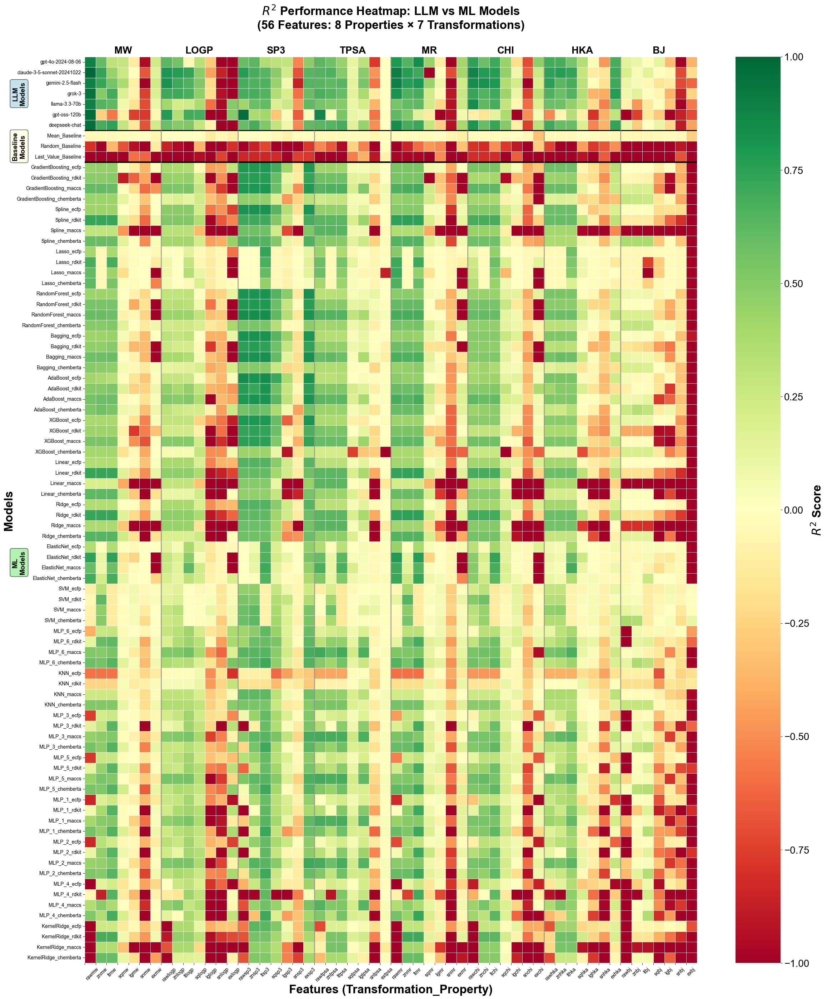


🏆 최고 성능 모델-특성 조합 TOP 10
 1. claude-3-5-sonnet-20241022 | raw_mw          | R² = 0.9851
 2. gpt-oss-120b              | raw_mw          | R² = 0.9801
 3. gpt-oss-120b              | raw_sp3         | R² = 0.9736
 4. deepseek-chat             | raw_mw          | R² = 0.9680
 5. grok-3                    | raw_mw          | R² = 0.9503
 6. claude-3-5-sonnet-20241022 | raw_mr          | R² = 0.9015
 7. gemini-2.5-flash          | raw_mr          | R² = 0.8956
 8. gpt-4o-2024-08-06         | raw_mw          | R² = 0.8920
 9. llama-3.3-70b             | raw_mw          | R² = 0.8898
10. gemini-2.5-flash          | raw_mw          | R² = 0.8883

🤖 모델 타입별 성능 비교
LLM 모델 평균 R²:      0.0891 ± 0.8008
Baseline 모델 평균 R²: -1.9550 ± 10.0867
ML 모델 평균 R²:       -0.2219 ± 2.7434

특성별 최고 성능:
  LLM이 최고인 특성:      28개
  Baseline이 최고인 특성: 3개
  ML이 최고인 특성:       25개


In [193]:
# 1. 데이터 로드
# consolidator = quick_load_all_data()

# 2. 히트맵 생성
performance_matrix = create_r2_performance_heatmap(
    consolidator, 
    figsize=(24, 28),
    save_path='r2_heatmap.png'
)

# 3. 상세 분석
best_performers = analyze_best_performers(performance_matrix)
compare_model_types(performance_matrix)

In [192]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Rectangle
import warnings
warnings.filterwarnings('ignore')

def create_r2_performance_heatmap(consolidator, figsize=(20, 12), save_path=None):
    """
    R² 성능을 기반으로 한 히트맵 생성
    
    Parameters:
    - consolidator: PickleDataConsolidator 인스턴스
    - figsize: 그래프 크기 (width, height)
    - save_path: 저장 경로 (None이면 저장하지 않음)
    """
    
    if consolidator.consolidated_df is None:
        print("❌ consolidated_df가 없습니다. create_consolidated_dataframe()를 먼저 실행하세요.")
        return None
    
    df = consolidator.consolidated_df.copy()
    
    # 1. 특성 이름 생성 (task_property 형태)
    # robust_zscore를 zn으로 변경
    df['task_renamed'] = df['task'].replace('robust_zscore', 'zn')
    df['feature'] = df['task_renamed'] + '_' + df['property']
    
    # 2. LLM, Baseline, ML 모델 분리 및 데이터 준비
    # LLM과 Baseline의 경우 embedding에 관계없이 같은 값이므로 하나만 선택
    llm_models = df[df['model_type'] == 'LLM']['model'].unique()
    baseline_models = df[df['model'].str.contains('Baseline', case=False, na=False)]['model'].unique()
    ml_models = df[(df['model_type'] == 'ML') & (~df['model'].str.contains('Baseline', case=False, na=False))]['model'].unique()
    
    print(f"📊 LLM 모델 수: {len(llm_models)}")
    print(f"📊 Baseline 모델 수: {len(baseline_models)}")
    print(f"📊 ML 모델 수: {len(ml_models)}")
    print(f"📊 총 특성 수: {len(df['feature'].unique())}")
    
    # 3. 히트맵용 데이터 준비
    heatmap_data = []
    
    # LLM 데이터 (embedding 무관하므로 첫 번째 embedding만 사용)
    for model in llm_models:
        llm_subset = df[(df['model'] == model) & (df['embedding'] == 'ecfp')]  # 임의의 embedding 선택
        model_data = {'model': model, 'model_type': 'LLM'}
        
        for _, row in llm_subset.iterrows():
            feature = row['feature']
            model_data[feature] = row['Total_R2']
        
        heatmap_data.append(model_data)
    
    # Baseline 데이터 (embedding 무관하므로 첫 번째 embedding만 사용)
    for model in baseline_models:
        baseline_subset = df[(df['model'] == model) & (df['embedding'] == 'ecfp')]  # 임의의 embedding 선택
        model_data = {'model': model, 'model_type': 'Baseline'}
        
        for _, row in baseline_subset.iterrows():
            feature = row['feature']
            model_data[feature] = row['Total_R2']
        
        heatmap_data.append(model_data)
    
    # ML 데이터 (embedding별로 따로)
    embeddings = ['ecfp', 'rdkit', 'maccs', 'chemberta']
    
    for model in ml_models:
        for embedding in embeddings:
            ml_subset = df[(df['model'] == model) & (df['embedding'] == embedding)]
            model_data = {'model': f"{model}_{embedding}", 'model_type': 'ML'}
            
            # 각 feature별 R² 값
            for feature in df['feature'].unique():
                feature_data = ml_subset[ml_subset['feature'] == feature]['Total_R2']
                if len(feature_data) > 0:
                    model_data[feature] = feature_data.iloc[0]  # 각 조합당 하나의 값
                else:
                    model_data[feature] = np.nan
            
            heatmap_data.append(model_data)
    
    # 4. DataFrame으로 변환
    heatmap_df = pd.DataFrame(heatmap_data)
    
    # 5. 모델 이름을 인덱스로 설정하고 정렬
    heatmap_df.set_index('model', inplace=True)
    
    # 특성 컬럼만 선택 (model_type 제외)
    feature_columns = [col for col in heatmap_df.columns if col != 'model_type']
    performance_matrix = heatmap_df[feature_columns]
    
    # 6. 특성 이름 정렬 (property별, task별 정렬)
    props = ['mw', 'logp', 'sp3', 'tpsa', 'mr', 'chi', 'hka', 'bj']
    tasks = ['raw', 'zn', 'lt', 'sq', 'lg', 'sn', 'ex']
    
    ordered_features = []
    for prop in props:  # property 먼저
        for task in tasks:  # 그 다음 task
            feature = f"{task}_{prop}"
            if feature in feature_columns:
                ordered_features.append(feature)
    
    performance_matrix = performance_matrix[ordered_features]
    
    # 7. 모델 타입별로 정렬 (LLM, Baseline, 그 다음 ML)
    model_types = heatmap_df['model_type']
    llm_models_sorted = model_types[model_types == 'LLM'].index.tolist()
    baseline_models_sorted = model_types[model_types == 'Baseline'].index.tolist()
    ml_models_sorted = model_types[model_types == 'ML'].index.tolist()
    
    all_models_sorted = llm_models_sorted + baseline_models_sorted + ml_models_sorted
    performance_matrix = performance_matrix.loc[all_models_sorted]
    
    # 8. 히트맵 그리기
    plt.figure(figsize=figsize)
    
    # 컬러맵 설정 (낮은 값은 빨강, 높은 값은 파랑)
    cmap = 'RdYlGn'
    
    # 히트맵 생성
    mask = performance_matrix.isna()  # NaN 값 마스킹
    
    ax = sns.heatmap(performance_matrix, 
                     annot=False,           # 값 표시
                     fmt='.3f',           # 소수점 3자리
                     cmap=cmap,
                     center=0,          # 중간값 설정
                     vmin=-1,              # 최소값
                     vmax=1,              # 최대값 (R²는 보통 0-1 범위)
                     cbar_kws={'label': '$R^2$ Score'},
                     mask=mask,           # NaN 마스킹
                     linewidths=0.5,      # 격자선
                     square=False)        # 정사각형 셀이 아님
    
    # 컬러바 글씨 크기 조정
    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=20)  # 컬러바 눈금 글씨 크기
    cbar.set_label('$R^2$ Score', fontsize=24, fontweight='bold')  # 컬러바 라벨 글씨 크기
    
    # 9. 축 및 제목 설정
    plt.title('$R^2$ Performance Heatmap: LLM vs ML Models\n(56 Features: 8 Properties × 7 Transformations)', 
              fontsize=24, fontweight='bold', pad=20, y=1.02)
    
    # X축 라벨 설정 (feature 이름을 더 읽기 쉽게)
    feature_labels = [f.replace('_', '') for f in ordered_features]
    plt.xticks(range(len(feature_labels)), feature_labels, rotation=45, ha='left')
    
    # Y축 라벨 설정
    plt.ylabel('Models', fontsize=24, fontweight='bold')
    plt.xlabel('Features (Transformation_Property)', fontsize=24, fontweight='bold')
    
    # 10. LLM, Baseline, ML 구분선 추가
    llm_count = len(llm_models_sorted)
    baseline_count = len(baseline_models_sorted)
    ml_count = len(ml_models_sorted)
    
    # LLM 영역
    if llm_count > 0:
        ax.text(-6, llm_count/2, 'LLM\nModels', 
                rotation=90, va='center', ha='center', 
                fontsize=14, fontweight='bold',
                bbox=dict(boxstyle="round,pad=0.3", facecolor="lightblue", alpha=0.7))
    
    # Baseline 영역
    if baseline_count > 0:
        baseline_start = llm_count
        baseline_end = llm_count + baseline_count
        
        # LLM과 Baseline 구분선
        if llm_count > 0:
            ax.axhline(y=llm_count, color='black', linewidth=2)
        
        ax.text(-6, baseline_start + baseline_count/2, 'Baseline\nModels', 
                rotation=90, va='center', ha='center', 
                fontsize=14, fontweight='bold',
                bbox=dict(boxstyle="round,pad=0.3", facecolor="lightyellow", alpha=0.7))
    
    # ML 영역
    if ml_count > 0:
        ml_start = llm_count + baseline_count
        ml_end = len(all_models_sorted)
        
        # Baseline과 ML 구분선
        ax.axhline(y=ml_start, color='black', linewidth=3)
        
        ax.text(-6, ml_start + (ml_end - ml_start)/2, 'ML\nModels', 
                rotation=90, va='center', ha='center', 
                fontsize=14, fontweight='bold',
                bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgreen", alpha=0.7))
    
    # 11. Property별 구분선 추가 (세로선)
    for i, prop in enumerate(props[1:], 1):  # 첫 번째 제외
        ax.axvline(x=i*7, color='gray', linewidth=2, alpha=0.7)  # 7개 transformation per property
    
    # 12. Property 라벨 추가 (상단)
    for i, prop in enumerate(props):
        ax.text(i*7 + 3.5, -1, prop.upper(), ha='center', va='top', 
                fontsize=20, fontweight='bold', rotation=0)
    
    # 13. 레이아웃 조정
    plt.tight_layout()
    
    # 14. 통계 정보 출력
    print("📊 히트맵 생성 완료!")
    print(f"   - 총 모델 수: {len(performance_matrix)}")
    print(f"   - LLM 모델 수: {len(llm_models_sorted)}")
    print(f"   - Baseline 모델 수: {len(baseline_models_sorted)}")
    print(f"   - ML 모델 수: {len(ml_models_sorted)}")
    print(f"   - 특성 수: {len(ordered_features)}")
    print(f"   - 평균 R²: {performance_matrix.mean().mean():.3f}")
    print(f"   - 최고 R²: {performance_matrix.max().max():.3f}")
    print(f"   - 최저 R²: {performance_matrix.min().min():.3f}")
    
    # 15. 저장
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', 
                   facecolor='white', edgecolor='none')
        print(f"💾 히트맵 저장: {save_path}")
    
    plt.show()
    
    return performance_matrix

def analyze_best_performers(performance_matrix, top_n=10):
    """
    최고 성능 모델-특성 조합 분석
    """
    print("\n" + "="*60)
    print("🏆 최고 성능 모델-특성 조합 TOP 10")
    print("="*60)
    
    # 모든 값을 1차원으로 펼치고 정렬
    melted = performance_matrix.stack().reset_index()
    melted.columns = ['model', 'feature', 'r2_score']
    melted = melted.dropna().sort_values('r2_score', ascending=False)
    
    for i, (_, row) in enumerate(melted.head(top_n).iterrows()):
        print(f"{i+1:2d}. {row['model']:<25} | {row['feature']:<15} | R² = {row['r2_score']:.4f}")
    
    return melted

def compare_model_types(performance_matrix):
    """
    LLM vs Baseline vs ML 모델 타입별 성능 비교
    """
    print("\n" + "="*60)
    print("🤖 모델 타입별 성능 비교")
    print("="*60)
    
    # LLM, Baseline, ML 모델 구분
    llm_models = []
    baseline_models = []
    ml_models = []
    
    for idx in performance_matrix.index:
        if 'baseline' in idx.lower():
            baseline_models.append(idx)
        elif not any(emb in idx for emb in ['_ecfp', '_rdkit', '_maccs', '_chemberta']):
            llm_models.append(idx)
        else:
            ml_models.append(idx)
    
    if llm_models:
        llm_performance = performance_matrix.loc[llm_models]
        llm_mean = llm_performance.mean().mean()
        llm_std = llm_performance.stack().std()
        print(f"LLM 모델 평균 R²:      {llm_mean:.4f} ± {llm_std:.4f}")
    
    if baseline_models:
        baseline_performance = performance_matrix.loc[baseline_models]
        baseline_mean = baseline_performance.mean().mean()
        baseline_std = baseline_performance.stack().std()
        print(f"Baseline 모델 평균 R²: {baseline_mean:.4f} ± {baseline_std:.4f}")
    
    if ml_models:
        ml_performance = performance_matrix.loc[ml_models]
        ml_mean = ml_performance.mean().mean()
        ml_std = ml_performance.stack().std()
        print(f"ML 모델 평균 R²:       {ml_mean:.4f} ± {ml_std:.4f}")
    
    # 특성별 최고 성능 모델 타입
    print(f"\n특성별 최고 성능:")
    best_by_feature = performance_matrix.idxmax()
    llm_wins = sum(1 for model in best_by_feature if model in llm_models)
    baseline_wins = sum(1 for model in best_by_feature if model in baseline_models)
    ml_wins = sum(1 for model in best_by_feature if model in ml_models)
    
    print(f"  LLM이 최고인 특성:      {llm_wins}개")
    print(f"  Baseline이 최고인 특성: {baseline_wins}개")
    print(f"  ML이 최고인 특성:       {ml_wins}개")

# 사용 예시
def example_usage():
    """
    사용 예시 및 전체 분석 파이프라인
    """
    print("🚀 R² 히트맵 생성 및 분석 예시 (Property별 그룹화):")
    print()
    print("# 1. 데이터 로드")
    print("consolidator = quick_load_all_data()")
    print()
    print("# 2. Property별 히트맵 생성")
    print("performance_matrix = create_r2_performance_heatmap(")
    print("    consolidator, ")
    print("    figsize=(24, 14),")
    print("    save_path='r2_heatmap_by_property.png'")
    print(")")
    print()
    print("# 3. 상세 분석")
    print("best_performers = analyze_best_performers(performance_matrix)")
    print("compare_model_types(performance_matrix)")
    print()
    print("# 이제 컬럼이 Property별로 그룹화됩니다:")
    print("# MW: [raw_mw, zn_mw, lt_mw, sq_mw, lg_mw, sn_mw, ex_mw]")
    print("# LOGP: [raw_logp, zn_logp, lt_logp, sq_logp, lg_logp, sn_logp, ex_logp]")
    print("# ... (8개 property 그룹)")

if __name__ == "__main__":
    example_usage()

🚀 R² 히트맵 생성 및 분석 예시 (Property별 그룹화):

# 1. 데이터 로드
consolidator = quick_load_all_data()

# 2. Property별 히트맵 생성
performance_matrix = create_r2_performance_heatmap(
    consolidator, 
    figsize=(24, 14),
    save_path='r2_heatmap_by_property.png'
)

# 3. 상세 분석
best_performers = analyze_best_performers(performance_matrix)
compare_model_types(performance_matrix)

# 이제 컬럼이 Property별로 그룹화됩니다:
# MW: [raw_mw, zn_mw, lt_mw, sq_mw, lg_mw, sn_mw, ex_mw]
# LOGP: [raw_logp, zn_logp, lt_logp, sq_logp, lg_logp, sn_logp, ex_logp]
# ... (8개 property 그룹)


In [175]:
consolidator.get_subset(embeddings=['ecfp'])

,MAE,Median_AE,Std_AE,Total_R2,Block_R2_Mean,Block_R2_Std,task,property,embedding,model,model_type
0,60.114974,41.768739,62.657014,0.451336,0.458660,0.110273,raw,mw,ecfp,GradientBoosting,ML
1,60.888410,39.515688,64.607846,0.426459,0.441618,0.132394,raw,mw,ecfp,Spline,ML
2,61.984724,44.834169,66.238180,0.401133,0.409153,0.118876,raw,mw,ecfp,Lasso,ML
3,62.643919,45.646025,62.092730,0.433867,0.441373,0.122538,raw,mw,ecfp,RandomForest,ML
4,63.222102,50.958700,62.190979,0.427683,0.424867,0.101621,raw,mw,ecfp,Bagging,ML
...,...,...,...,...,...,...,...,...,...,...,...
6404,1.041768,0.472792,1.893417,-0.631197,-1.130318,0.975789,ex,bj,ecfp,gemini-2.5-flash,LLM
6405,0.901944,0.458494,1.662175,-0.249041,-0.387378,0.700949,ex,bj,ecfp,grok-3,LLM
6406,1.150579,0.583994,1.769090,-0.556494,-0.903027,0.655979,ex,bj,ecfp,llama-3.3-70b,LLM
6407,1.256915,0.763593,1.824117,-0.715497,-1.096828,0.679481,ex,bj,ecfp,gpt-oss-120b,LLM


In [71]:
consolidator.get_subset(props=['mw', 'logp', 'sp3', 'tpsa', 'mr', 'chi', 'hka', 'bj'])

,MAE,Median_AE,Std_AE,Total_R2,Block_R2_Mean,Block_R2_Std,task,property,embedding,model,model_type
0,60.114974,41.768739,62.657014,0.451336,0.458660,0.110273,raw,mw,ecfp,GradientBoosting,ML
1,60.888410,39.515688,64.607846,0.426459,0.441618,0.132394,raw,mw,ecfp,Spline,ML
2,61.984724,44.834169,66.238180,0.401133,0.409153,0.118876,raw,mw,ecfp,Lasso,ML
3,62.643919,45.646025,62.092730,0.433867,0.441373,0.122538,raw,mw,ecfp,RandomForest,ML
4,63.222102,50.958700,62.190979,0.427683,0.424867,0.101621,raw,mw,ecfp,Bagging,ML
...,...,...,...,...,...,...,...,...,...,...,...
6491,1.041768,0.472792,1.893417,-0.631197,-1.130318,0.975789,ex,bj,chemberta,gemini-2.5-flash,LLM
6492,0.901944,0.458494,1.662175,-0.249041,-0.387378,0.700949,ex,bj,chemberta,grok-3,LLM
6493,1.150579,0.583994,1.769090,-0.556494,-0.903027,0.655979,ex,bj,chemberta,llama-3.3-70b,LLM
6494,1.256915,0.763593,1.824117,-0.715497,-1.096828,0.679481,ex,bj,chemberta,gpt-oss-120b,LLM


In [72]:
pivot = consolidator.get_pivot_table(values='Total_R2', 
                                   index=['task', 'property'], 
                                   columns='model')

In [73]:
import pandas as pd
import numpy as np

def analyze_llm_vs_ml_performance(consolidator):
    """
    각 task-property 조합에서 LLM vs ML의 MAE 비교 분석
    
    Args:
        consolidator: PickleDataConsolidator 객체
    
    Returns:
        DataFrame: LLM이 ML보다 성능이 좋은 task-property 조합들
    """
    
    if consolidator.consolidated_df is None:
        print("❌ 먼저 create_consolidated_dataframe()를 실행하세요")
        return None
    
    df = consolidator.consolidated_df.copy()
    
    # MAE가 NaN이 아닌 데이터만 사용
    df = df[df['MAE'].notna()]
    
    results = []
    
    # 각 task-property 조합별로 분석
    for task in consolidator.tasks:
        for prop in consolidator.props:
            task_prop_data = df[(df['task'] == task) & (df['property'] == prop)]
            
            if task_prop_data.empty:
                continue
            
            # LLM과 ML 데이터 분리
            llm_data = task_prop_data[task_prop_data['model_type'] == 'LLM']['MAE']
            ml_data = task_prop_data[task_prop_data['model_type'] == 'ML']['MAE']
            
            if llm_data.empty or ml_data.empty:
                continue
            
            # 같은 개수로 맞추기 (MAE가 작은 순으로)
            min_count = min(len(llm_data), len(ml_data))
            
            # MAE 기준 오름차순 정렬 후 상위 min_count개 선택
            llm_top = llm_data.nsmallest(min_count)
            ml_top = ml_data.nsmallest(min_count)
            
            # 평균 계산
            llm_avg_mae = llm_top.mean()
            ml_avg_mae = ml_top.mean()
            
            # 비율 계산
            ratio = llm_avg_mae / ml_avg_mae if ml_avg_mae != 0 else np.inf
            
            # 결과 저장
            result = {
                'task': task,
                'property': prop,
                'taskprop': f"{task}_{prop}",
                'llm_avg_mae': llm_avg_mae,
                'ml_avg_mae': ml_avg_mae,
                'llm_ml_ratio': ratio,
                'llm_count': len(llm_top),
                'ml_count': len(ml_top),
                'llm_models': llm_data.index.tolist(),
                'ml_models': ml_data.index.tolist(),
                'improvement_pct': (1 - ratio) * 100  # LLM이 얼마나 더 좋은지 (%)
            }
            
            results.append(result)
    
    # DataFrame으로 변환
    results_df = pd.DataFrame(results)
    
    # 비율이 1보다 작은 것만 필터링 (LLM이 더 좋은 경우)
    better_llm = results_df[results_df['llm_ml_ratio'] < 1.0].copy()
    
    # 비율 기준 오름차순 정렬 (LLM이 더 좋을수록 위에)
    better_llm = better_llm.sort_values('llm_ml_ratio')
    
    return better_llm, results_df

def print_llm_better_results(better_llm_df):
    """
    LLM이 더 좋은 성능을 보이는 결과들을 깔끔하게 출력
    """
    if better_llm_df.empty:
        print("😞 LLM이 ML보다 MAE가 낮은 task-property 조합이 없습니다.")
        return
    
    print("🎯 LLM이 ML보다 MAE가 낮은 Task-Property 조합들")
    print("="*80)
    print(f"{'순위':<4} {'Task':<15} {'Property':<8} {'LLM MAE':<10} {'ML MAE':<10} {'비율':<8} {'개선율':<8}")
    print("-"*80)
    
    for idx, (_, row) in enumerate(better_llm_df.iterrows(), 1):
        task = row['task']
        prop = row['property']
        llm_mae = row['llm_avg_mae']
        ml_mae = row['ml_avg_mae']
        ratio = row['llm_ml_ratio']
        improvement = row['improvement_pct']
        
        print(f"{idx:<4} {task:<15} {prop:<8} {llm_mae:<10.4f} {ml_mae:<10.4f} {ratio:<8.4f} {improvement:<7.1f}%")
    
    print("-"*80)
    print(f"총 {len(better_llm_df)}개 조합에서 LLM이 ML보다 우수")

def detailed_analysis_for_taskprop(consolidator, task, prop):
    """
    특정 task-property 조합에 대한 상세 분석
    """
    df = consolidator.consolidated_df.copy()
    task_prop_data = df[(df['task'] == task) & (df['property'] == prop) & (df['MAE'].notna())]
    
    if task_prop_data.empty:
        print(f"❌ {task}_{prop}에 대한 데이터가 없습니다.")
        return
    
    print(f"\n🔍 {task}_{prop} 상세 분석")
    print("="*50)
    
    # LLM vs ML 분리
    llm_data = task_prop_data[task_prop_data['model_type'] == 'LLM']
    ml_data = task_prop_data[task_prop_data['model_type'] == 'ML']
    
    print("📊 LLM 모델들:")
    llm_sorted = llm_data.sort_values('MAE')
    for _, row in llm_sorted.iterrows():
        print(f"  {row['model']:<25}: MAE = {row['MAE']:.4f}")
    
    print(f"\n📊 ML 모델들:")
    ml_sorted = ml_data.sort_values('MAE')
    for _, row in ml_sorted.iterrows():
        print(f"  {row['model']:<25}: MAE = {row['MAE']:.4f}")
    
    # 통계
    print(f"\n📈 통계:")
    print(f"  LLM 평균 MAE: {llm_data['MAE'].mean():.4f}")
    print(f"  ML 평균 MAE:  {ml_data['MAE'].mean():.4f}")
    print(f"  LLM 최고:     {llm_data['MAE'].min():.4f}")
    print(f"  ML 최고:      {ml_data['MAE'].min():.4f}")

def create_comparison_summary(better_llm_df, all_results_df):
    """
    전체 비교 요약 생성
    """
    total_combinations = len(all_results_df)
    llm_better_count = len(better_llm_df)
    ml_better_count = total_combinations - llm_better_count
    
    print(f"\n📊 전체 요약")
    print("="*40)
    print(f"총 Task-Property 조합: {total_combinations}개")
    print(f"LLM이 더 좋은 경우:   {llm_better_count}개 ({llm_better_count/total_combinations*100:.1f}%)")
    print(f"ML이 더 좋은 경우:    {ml_better_count}개 ({ml_better_count/total_combinations*100:.1f}%)")
    
    if not better_llm_df.empty:
        avg_improvement = better_llm_df['improvement_pct'].mean()
        max_improvement = better_llm_df['improvement_pct'].max()
        print(f"\nLLM 우수 케이스에서:")
        print(f"  평균 개선율: {avg_improvement:.1f}%")
        print(f"  최대 개선율: {max_improvement:.1f}%")

# 사용 예시 함수
def run_complete_analysis(consolidator):
    """
    완전한 분석 실행
    """
    print("🚀 LLM vs ML MAE 비교 분석 시작")
    print("="*60)
    
    # 분석 실행
    better_llm_df, all_results_df = analyze_llm_vs_ml_performance(consolidator)
    
    # 결과 출력
    print_llm_better_results(better_llm_df)
    
    # 전체 요약
    create_comparison_summary(better_llm_df, all_results_df)
    
    # 가장 좋은 케이스 상세 분석
    if not better_llm_df.empty:
        best_case = better_llm_df.iloc[0]
        print(f"\n🏆 가장 우수한 케이스 상세 분석:")
        detailed_analysis_for_taskprop(consolidator, best_case['task'], best_case['property'])
    
    return better_llm_df, all_results_df

if __name__ == "__main__":
    print("사용 방법:")
    print("1. consolidator = quick_load_all_data()")
    print("2. better_llm, all_results = run_complete_analysis(consolidator)")
    print("3. detailed_analysis_for_taskprop(consolidator, 'task_name', 'property_name')")

사용 방법:
1. consolidator = quick_load_all_data()
2. better_llm, all_results = run_complete_analysis(consolidator)
3. detailed_analysis_for_taskprop(consolidator, 'task_name', 'property_name')


In [74]:
better_llm, all_results = run_complete_analysis(consolidator)

🚀 LLM vs ML MAE 비교 분석 시작
🎯 LLM이 ML보다 MAE가 낮은 Task-Property 조합들
순위   Task            Property LLM MAE    ML MAE     비율       개선율     
--------------------------------------------------------------------------------
1    raw             mw       12.4395    51.3084    0.2424   75.8   %
2    raw             logp     0.7360     1.0713     0.6870   31.3   %
3    raw             mr       8.6678     11.6206    0.7459   25.4   %
4    raw             chi      1.0383     1.3813     0.7517   24.8   %
5    raw             tpsa     11.8915    14.8888    0.7987   20.1   %
6    ex              hka      0.6842     0.8309     0.8234   17.7   %
7    raw             sp3      0.1192     0.1424     0.8373   16.3   %
8    ex              bj       1.0264     1.2018     0.8540   14.6   %
9    ex              chi      3.4595     4.0396     0.8564   14.4   %
10   raw             hka      0.4409     0.5089     0.8664   13.4   %
11   lg              tpsa     1.0883     1.2464     0.8731   12.7   %
12   sq         

In [75]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random
from rdkit import Chem
from rdkit.Chem import Crippen
from rdkit.Chem import Descriptors

# 랜덤한 a와 b 생성
# a = random.uniform(0, 10)
# b = random.uniform(-200, 200)
a = 6.462356980390821
b = -162.75140504630065

# 데이터 불러오기
esol = pd.read_csv('../delaney-processed.csv')

# 'aM_w+b' 열 추가 (분자량은 4번째 열에 있다고 가정)
esol['smiles_len'] = esol['smiles'].apply(len)
esol['aM_w+b'] = a * esol.loc[:, 'Molecular Weight'] + b

# RDKit를 사용하여 물성 값들 계산
esol['LogP'] = esol['smiles'].apply(lambda x: Descriptors.MolLogP(Chem.MolFromSmiles(x)))
esol['TPSA'] = esol['smiles'].apply(lambda x: Descriptors.TPSA(Chem.MolFromSmiles(x)))
esol['sp3'] = esol['smiles'].apply(lambda x: Descriptors.FractionCSP3(Chem.MolFromSmiles(x)))
esol['MolMR'] = esol['smiles'].apply(lambda x: Descriptors.MolMR(Chem.MolFromSmiles(x)))
esol['BJ'] = esol['smiles'].apply(lambda x: Descriptors.BalabanJ(Chem.MolFromSmiles(x)))
esol['Chi'] = esol['smiles'].apply(lambda x: Descriptors.Chi1v(Chem.MolFromSmiles(x)))
esol['HKA'] = esol['smiles'].apply(lambda x: Descriptors.HallKierAlpha(Chem.MolFromSmiles(x)))

print(f"a = {a}, b = {b}")

# Robust Z-score 정규화 함수
def robust_zscore(values, mode):
   """
   Robust Z-score 정규화 함수
   median과 MAD(Median Absolute Deviation)를 사용
   """
   values = np.array(values)
   
   # NaN 값 처리
   valid_mask = ~np.isnan(values)
   if not np.any(valid_mask):
       return values  # 모든 값이 NaN인 경우
   
   valid_values = values[valid_mask]
   
   # Median 계산
   median = np.median(valid_values)
   
   # MAD (Median Absolute Deviation) 계산
   mad = np.median(np.abs(valid_values - median))
   
   # MAD가 0인 경우 (모든 값이 같은 경우) 처리
   if mad == 0:
       return np.zeros_like(values)
   
   # 정규분포 가정 하의 보정계수 1.4826
   # (MAD * 1.4826 ≈ standard deviation for normal distribution)
   robust_std = 1.4826 * mad
   
   # Robust Z-score 계산 ##################################################
   robust_z = (values - median) / robust_std
   if mode == 0:
      return robust_z
   elif mode == 1:
      return robust_z * 1000
   elif mode == 2:
      return robust_z ** 2
   elif mode == 3:
      return np.log(np.abs(robust_z + 1e-3)) + 500 # log 변환 (0으로 나누는 오류 방지)
   elif mode == 4:
      return np.sin(10 * robust_z)
   elif mode == 5:
      return np.exp(robust_z - 10)
      
# 정규화할 물성들 리스트return 500 * np.sin(5 * robust_z)elif mode == 4:

properties_to_normalize = ['Molecular Weight', 'LogP', 'TPSA', 'sp3', 'MolMR', 'BJ', 'Chi', 'HKA']

# 원본 통계량 저장을 위한 딕셔너리
original_stats = {}
normalized_stats = {}

print("\n=== 원본 데이터 통계량 ===")
for prop in properties_to_normalize:
   values = esol[prop].values
   
   # 원본 통계량 계산
   original_stats[prop] = {
       'mean': np.mean(values),
       'median': np.median(values),
       'std': np.std(values),
       'mad': np.median(np.abs(values - np.median(values))),
       'min': np.min(values),
       'max': np.max(values),
       'outlier_ratio': np.sum(np.abs(values - np.mean(values)) > 3 * np.std(values)) / len(values)
   }
   
   print(f"\n{prop}:")
   print(f"  Mean: {original_stats[prop]['mean']:.3f}")
   print(f"  Median: {original_stats[prop]['median']:.3f}")
   print(f"  Std: {original_stats[prop]['std']:.3f}")
   print(f"  MAD: {original_stats[prop]['mad']:.3f}")
   print(f"  Range: [{original_stats[prop]['min']:.3f}, {original_stats[prop]['max']:.3f}]")
   print(f"  Outlier ratio (>3σ): {original_stats[prop]['outlier_ratio']:.3f}")

print("\n=== Robust Z-score 정규화 수행 ===")

# 각 물성에 대해 Robust Z-score 정규화 수행
for prop in properties_to_normalize:
   # 새로운 컬럼명 생성
   normalized_col = f"{prop}_robust_zscore"
   lt_col = f"{prop}_lt"
   sq_col = f"{prop}_sq"
   lg_col = f"{prop}_lg"
   sn_col = f"{prop}_sn"
   ex_col = f"{prop}_ex"

   # Robust Z-score 정규화 적용
   esol[normalized_col] = robust_zscore(esol[prop], 0)
   esol[lt_col] = robust_zscore(esol[prop], 1)
   esol[sq_col] = robust_zscore(robust_zscore(esol[prop], 2), 0)
   esol[lg_col] = robust_zscore(robust_zscore(esol[prop], 3), 0)
   esol[sn_col] = robust_zscore(robust_zscore(esol[prop], 4), 0)
   esol[ex_col] = robust_zscore(robust_zscore(esol[prop], 5), 0)

   # 정규화 후 통계량 계산
   normalized_values = esol[normalized_col].values
   normalized_stats[prop] = {
       'mean': np.mean(normalized_values),
       'median': np.median(normalized_values),
       'std': np.std(normalized_values),
       'mad': np.median(np.abs(normalized_values - np.median(normalized_values))),
       'min': np.min(normalized_values),
       'max': np.max(normalized_values)
   }
   
   print(f"\n{prop} -> {normalized_col}:")
   print(f"  정규화 후 Mean: {normalized_stats[prop]['mean']:.6f}")
   print(f"  정규화 후 Median: {normalized_stats[prop]['median']:.6f}")
   print(f"  정규화 후 Std: {normalized_stats[prop]['std']:.3f}")
   print(f"  정규화 후 MAD: {normalized_stats[prop]['mad']:.6f}")
   print(f"  정규화 후 Range: [{normalized_stats[prop]['min']:.3f}, {normalized_stats[prop]['max']:.3f}]")

# 정규화 검증
print("\n=== 정규화 검증 ===")
print("Robust Z-score의 특성:")
print("- Median = 0 (정확히 0)")
print("- MAD = 1/1.4826 ≈ 0.6745 (이론값)")
print("\n실제 값들:")
for prop in properties_to_normalize:
   normalized_col = f"{prop}_robust_zscore"
   median_val = normalized_stats[prop]['median']
   mad_val = normalized_stats[prop]['mad']
   theoretical_mad = 1/1.4826
   
   print(f"{prop}:")
   print(f"  Median: {median_val:.6f} (이론값: 0)")
   print(f"  MAD: {mad_val:.6f} (이론값: {theoretical_mad:.6f})")

# 데이터프레임의 새로운 컬럼들 확인
print(f"\n=== 최종 데이터프레임 정보 ===")
print(f"전체 컬럼 수: {len(esol.columns)}")
print("정규화된 컬럼들:")
for prop in properties_to_normalize:
   normalized_col = f"{prop}_robust_zscore"
   print(f"  {normalized_col}")

# 샘플 데이터 확인
print(f"\n=== 샘플 데이터 (첫 5행) ===")
cols_to_show = properties_to_normalize + [f"{prop}_robust_zscore" for prop in properties_to_normalize]
print(esol[cols_to_show].head())

# 선택적: 히스토그램으로 정규화 전후 비교
def plot_before_after_histograms(prop_name, save_plots=False):
   """정규화 전후 히스토그램 비교"""
   fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
   
   # 원본 데이터 히스토그램
   ax1.hist(esol[prop_name], bins=50, alpha=0.7, color='blue', edgecolor='black')
   ax1.set_title(f'Original {prop_name}')
   ax1.set_xlabel(prop_name)
   ax1.set_ylabel('Frequency')
   ax1.grid(True, alpha=0.3)
   
   # 정규화된 데이터 히스토그램
   normalized_col = f"{prop_name}_robust_zscore"
   ax2.hist(esol[normalized_col], bins=50, alpha=0.7, color='red', edgecolor='black')
   ax2.set_title(f'Robust Z-score Normalized {prop_name}')
   ax2.set_xlabel(f'{prop_name} (Robust Z-score)')
   ax2.set_ylabel('Frequency')
   ax2.grid(True, alpha=0.3)
   
   plt.tight_layout()
   
   if save_plots:
       plt.savefig(f'robust_zscore_{prop_name.replace(" ", "_")}.png', dpi=300, bbox_inches='tight')
   
   plt.show()

# 예시: 몇 개 물성의 히스토그램 확인 (선택적으로 실행)
print("\n히스토그램을 확인하려면 다음 함수들을 실행하세요:")
print("plot_before_after_histograms('Molecular Weight')")
print("plot_before_after_histograms('LogP')")
print("plot_before_after_histograms('sp3')")

a = 6.462356980390821, b = -162.75140504630065

=== 원본 데이터 통계량 ===

Molecular Weight:
  Mean: 203.937
  Median: 182.179
  Std: 102.693
  MAD: 70.137
  Range: [16.043, 780.949]
  Outlier ratio (>3σ): 0.004

LogP:
  Mean: 2.448
  Median: 2.339
  Std: 1.852
  MAD: 0.986
  Range: [-7.571, 10.389]
  Outlier ratio (>3σ): 0.012

TPSA:
  Mean: 34.873
  Median: 26.300
  Std: 35.368
  MAD: 26.300
  Range: [0.000, 268.680]
  Outlier ratio (>3σ): 0.011

sp3:
  Mean: 0.444
  Median: 0.357
  Std: 0.375
  MAD: 0.357
  Range: [0.000, 1.000]
  Outlier ratio (>3σ): 0.000

MolMR:
  Mean: 54.016
  Median: 48.523
  Std: 25.268
  MAD: 17.355
  Range: [6.731, 192.611]
  Outlier ratio (>3σ): 0.004

BJ:
  Mean: 2.676
  Median: 2.723
  Std: 0.573
  MAD: 0.355
  Range: [0.000, 4.808]
  Outlier ratio (>3σ): 0.011

Chi:
  Mean: 4.899
  Median: 4.264
  Std: 2.613
  MAD: 1.602
  Range: [0.000, 20.941]
  Outlier ratio (>3σ): 0.009

HKA:
  Mean: -0.920
  Median: -0.920
  Std: 1.010
  MAD: 0.720
  Range: [-4.680, 3.480

In [76]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import seaborn as sns

def robust_zscore_transform(values, mode):
    """
    Robust Z-score 변환 함수 (원본 코드와 동일)
    """
    values = np.array(values)
    
    # NaN 값 처리
    valid_mask = ~np.isnan(values)
    if not np.any(valid_mask):
        return values
    
    valid_values = values[valid_mask]
    
    # Median 계산
    median = np.median(valid_values)
    
    # MAD (Median Absolute Deviation) 계산
    mad = np.median(np.abs(valid_values - median))
    
    # MAD가 0인 경우 처리
    if mad == 0:
        return np.zeros_like(values)
    
    # 정규분포 가정 하의 보정계수 1.4826
    robust_std = 1.4826 * mad
    
    # Robust Z-score 계산
    robust_z = (values - median) / robust_std
    
    if mode == 0:  # robust_zscore
        return robust_z
    elif mode == 1:  # lt (linear transform)
        return robust_z * 1000
    elif mode == 2:  # sq (square)
        return robust_z ** 2
    elif mode == 3:  # lg (log)
        return np.log(np.abs(robust_z + 1e-3)) + 500
    elif mode == 4:  # sn (sine)
        return np.sin(10 * robust_z)
    elif mode == 5:  # ex (exponential)
        return np.exp(robust_z - 10)

def calculate_taskprop_features(esol_data):
    """
    각 task-property 조합의 분포 특성을 계산
    
    Args:
        esol_data: ESOL 데이터셋
    
    Returns:
        DataFrame: 각 taskprop별 분포 특성 벡터
    """
    
    # 물성과 변환 정의
    properties = ['Molecular Weight', 'LogP', 'TPSA', 'sp3', 'MolMR', 'BJ', 'Chi', 'HKA']
    tasks = ['raw', 'robust_zscore', 'lt', 'sq', 'lg', 'sn', 'ex']
    task_modes = {'raw': -1, 'robust_zscore': 0, 'lt': 1, 'sq': 2, 'lg': 3, 'sn': 4, 'ex': 5}
    
    features = []
    
    print(f"🔬 {len(properties)} 물성 × {len(tasks)} 변환 = {len(properties) * len(tasks)}개 taskprop 특성 계산 중...")
    
    for prop in properties:
        original_values = esol_data[prop].dropna().values
        
        for task in tasks:
            # 변환 적용
            if task == 'raw':
                transformed_values = original_values
            else:
                mode = task_modes[task]
                if task in ['sq', 'lg', 'sn', 'ex']:
                    # 이중 변환: 먼저 robust_zscore 후 해당 변환
                    robust_z = robust_zscore_transform(original_values, 0)
                    transformed_values = robust_zscore_transform(robust_z, mode)
                else:
                    transformed_values = robust_zscore_transform(original_values, mode)
            
            # 변환된 값들의 분포 특성 계산
            feature_vector = calculate_distribution_stats(transformed_values, prop, task)
            features.append(feature_vector)
    
    return pd.DataFrame(features)

def calculate_distribution_stats(values, property_name, task_name):
    """
    분포 통계 특성 계산
    """
    values = values[~np.isnan(values)]  # NaN 제거
    
    if len(values) == 0:
        return create_empty_feature_vector(property_name, task_name)
    
    # 기본 통계량
    mean_val = np.mean(values)
    median_val = np.median(values)
    std_val = np.std(values)
    
    # 견고한 통계량
    mad_val = np.median(np.abs(values - median_val))
    
    # 분포 형태
    skewness = calculate_skewness(values)
    kurtosis = calculate_kurtosis(values)
    
    # 범위 및 변동성
    range_val = np.max(values) - np.min(values)
    iqr = np.percentile(values, 75) - np.percentile(values, 25)
    cv = std_val / abs(mean_val) if mean_val != 0 else 0
    
    # 이상값 비율
    if std_val > 0:
        outlier_ratio_3sigma = np.sum(np.abs(values - mean_val) > 3 * std_val) / len(values)
    else:
        outlier_ratio_3sigma = 0
        
    # IQR 기반 이상값
    q1, q3 = np.percentile(values, 25), np.percentile(values, 75)
    outlier_ratio_iqr = np.sum((values < (q1 - 1.5 * iqr)) | (values > (q3 + 1.5 * iqr))) / len(values)
    
    # 정규성 관련
    robust_std_ratio = (1.4826 * mad_val) / std_val if std_val != 0 else 1
    mean_median_diff = abs(mean_val - median_val) / std_val if std_val != 0 else 0
    
    # 분포의 복잡성
    entropy = calculate_entropy(values)
    
    # 극값의 영향
    percentile_5 = np.percentile(values, 5)
    percentile_95 = np.percentile(values, 95)
    tail_ratio = (percentile_95 - percentile_5) / range_val if range_val != 0 else 0
    
    # 변환 안정성 (원래 값 대비)
    zero_crossings = count_zero_crossings(values - mean_val)
    
    return {
        'property': property_name,
        'task': task_name,
        'taskprop': f"{task_name}_{property_name.lower().replace(' ', '_')}",
        'mean': mean_val,
        'median': median_val,
        'std': std_val,
        'mad': mad_val,
        'skewness': skewness,
        'kurtosis': kurtosis,
        'range': range_val,
        'iqr': iqr,
        'cv': cv,
        'outlier_ratio_3sigma': outlier_ratio_3sigma,
        'outlier_ratio_iqr': outlier_ratio_iqr,
        'robust_std_ratio': robust_std_ratio,
        'mean_median_diff': mean_median_diff,
        'entropy': entropy,
        'tail_ratio': tail_ratio,
        'zero_crossings': zero_crossings
    }

def create_empty_feature_vector(property_name, task_name):
    """빈 특성 벡터 생성"""
    return {
        'property': property_name,
        'task': task_name,
        'taskprop': f"{task_name}_{property_name.lower().replace(' ', '_')}",
        'mean': 0, 'median': 0, 'std': 0, 'mad': 0, 'skewness': 0, 'kurtosis': 0,
        'range': 0, 'iqr': 0, 'cv': 0, 'outlier_ratio_3sigma': 0, 'outlier_ratio_iqr': 0,
        'robust_std_ratio': 0, 'mean_median_diff': 0, 'entropy': 0, 'tail_ratio': 0, 'zero_crossings': 0
    }

def calculate_skewness(values):
    """왜도 계산"""
    mean_val = np.mean(values)
    std_val = np.std(values)
    if std_val == 0:
        return 0
    return np.mean(((values - mean_val) / std_val) ** 3)

def calculate_kurtosis(values):
    """첨도 계산"""
    mean_val = np.mean(values)
    std_val = np.std(values)
    if std_val == 0:
        return 0
    return np.mean(((values - mean_val) / std_val) ** 4) - 3

def calculate_entropy(values, bins=30):
    """분포의 엔트로피 계산"""
    try:
        hist, _ = np.histogram(values, bins=bins)
        hist = hist / np.sum(hist)
        hist = hist[hist > 0]
        return -np.sum(hist * np.log2(hist))
    except:
        return 0

def count_zero_crossings(values):
    """평균선 교차 횟수"""
    return np.sum(np.diff(np.sign(values)) != 0)

def map_performance_to_taskprop(feature_df, performance_results):
    """
    성능 결과를 taskprop에 매핑
    """
    # property 이름 매핑
    property_mapping = {
        'Molecular Weight': 'mw',
        'LogP': 'logp',
        'TPSA': 'tpsa',
        'sp3': 'sp3',
        'MolMR': 'mr',
        'BJ': 'bj',
        'Chi': 'chi',
        'HKA': 'hka'
    }
    
    # task 이름 매핑
    task_mapping = {
        'raw': 'raw',  # raw는 성능 데이터에 없을 수 있음
        'robust_zscore': 'robust_zscore',
        'lt': 'lt',
        'sq': 'sq',
        'lg': 'lg',  # 성능 데이터에 없을 수 있음
        'sn': 'sn',
        'ex': 'ex'
    }
    
    # 각 taskprop에 대해 성능 점수 매핑
    feature_df['llm_better'] = False
    feature_df['performance_ratio'] = 1.0  # 기본값
    
    if performance_results is not None and not performance_results.empty:
        for idx, row in feature_df.iterrows():
            prop_mapped = property_mapping.get(row['property'])
            task_mapped = task_mapping.get(row['task'])
            
            if prop_mapped and task_mapped:
                # 해당하는 성능 결과 찾기
                perf_match = performance_results[
                    (performance_results['property'] == prop_mapped) & 
                    (performance_results['task'] == task_mapped)
                ]
                
                if not perf_match.empty:
                    ratio = perf_match.iloc[0]['llm_ml_ratio']
                    feature_df.loc[idx, 'llm_better'] = ratio < 1.0
                    feature_df.loc[idx, 'performance_ratio'] = ratio
    
    return feature_df

def perform_taskprop_clustering(esol_data, performance_results):
    """
    TaskProp 기반 클러스터링 수행
    """
    print("🔄 TaskProp 분포 특성 계산 중...")
    
    # TaskProp 특성 계산
    feature_df = calculate_taskprop_features(esol_data)
    
    print(f"✅ {len(feature_df)}개 TaskProp 조합의 특성 계산 완료")
    
    # 성능 결과 매핑
    feature_df = map_performance_to_taskprop(feature_df, performance_results)
    
    # 클러스터링을 위한 특성 준비
    feature_columns = ['mean', 'median', 'std', 'mad', 'skewness', 'kurtosis', 
                      'range', 'iqr', 'cv', 'outlier_ratio_3sigma', 'outlier_ratio_iqr',
                      'robust_std_ratio', 'mean_median_diff', 'entropy', 'tail_ratio', 'zero_crossings']
    
    X = feature_df[feature_columns].values
    
    # NaN 처리
    X = np.nan_to_num(X)
    
    # 표준화
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # K-means 클러스터링 (k=2)
    kmeans = KMeans(n_clusters=2, random_state=42, n_init=10)
    clusters = kmeans.fit_predict(X_scaled)
    
    feature_df['cluster'] = clusters
    
    print("🎯 K-means 클러스터링 완료")
    print(f"클러스터 0: {np.sum(clusters == 0)}개 TaskProp")
    print(f"클러스터 1: {np.sum(clusters == 1)}개 TaskProp")
    
    # PCA로 2차원 시각화
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)
    
    feature_df['pca1'] = X_pca[:, 0]
    feature_df['pca2'] = X_pca[:, 1]
    
    print(f"📊 PCA 설명 분산비: PC1={pca.explained_variance_ratio_[0]:.3f}, PC2={pca.explained_variance_ratio_[1]:.3f}")
    
    return feature_df, X_scaled, pca, scaler, kmeans

def create_taskprop_visualization(feature_df):
    """
    TaskProp 클러스터링 결과 시각화 (4가지 조합)
    """
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    # 색상과 마커 정의
    cluster_colors = {0: 'red', 1: 'blue'}
    performance_markers = {True: 'o', False: 'x'}  # o: LLM better, x: ML better
    
    # 1. 클러스터만
    ax1 = axes[0, 0]
    for cluster in [0, 1]:
        mask = feature_df['cluster'] == cluster
        ax1.scatter(feature_df[mask]['pca1'], feature_df[mask]['pca2'], 
                   c=cluster_colors[cluster], label=f'Cluster {cluster}', 
                   alpha=0.7, s=80)
    
    ax1.set_xlabel(f'PC1')
    ax1.set_ylabel(f'PC2')
    ax1.set_title('K-means Clustering (k=2)')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # 2. 성능만
    ax2 = axes[0, 1]
    for better in [True, False]:
        mask = feature_df['llm_better'] == better
        color = 'green' if better else 'orange'
        marker = performance_markers[better]
        label = 'LLM Better' if better else 'ML Better'
        ax2.scatter(feature_df[mask]['pca1'], feature_df[mask]['pca2'], 
                   c=color, marker=marker, label=label, alpha=0.7, s=80)
    
    ax2.set_xlabel(f'PC1')
    ax2.set_ylabel(f'PC2')
    ax2.set_title('LLM vs ML Performance')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    # 3. 통합 결과 (4가지 조합) - 메인 그래프
    ax3 = axes[1, 0]
    
    # 4가지 조합으로 플롯
    combinations = [
        (0, True, 'red', 'o', 'Cluster 0, LLM Better'),
        (0, False, 'red', 'x', 'Cluster 0, ML Better'),
        (1, True, 'blue', 'o', 'Cluster 1, LLM Better'),
        (1, False, 'blue', 'x', 'Cluster 1, ML Better')
    ]
    
    for cluster, llm_better, color, marker, label in combinations:
        mask = (feature_df['cluster'] == cluster) & (feature_df['llm_better'] == llm_better)
        if mask.any():
            ax3.scatter(feature_df[mask]['pca1'], feature_df[mask]['pca2'], 
                       c=color, marker=marker, s=120, alpha=0.8, label=label,
                       edgecolors='black', linewidth=0.5)
    
    ax3.set_xlabel(f'PC1')
    ax3.set_ylabel(f'PC2')
    ax3.set_title('Combined: Clustering + Performance (56 TaskProps)')
    ax3.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax3.grid(True, alpha=0.3)
    
    # 4. Task별 분포
    ax4 = axes[1, 1]
    tasks = feature_df['task'].unique()
    task_colors = plt.cm.Set3(np.linspace(0, 1, len(tasks)))
    
    for i, task in enumerate(tasks):
        mask = feature_df['task'] == task
        ax4.scatter(feature_df[mask]['pca1'], feature_df[mask]['pca2'], 
                   c=[task_colors[i]], label=task, alpha=0.7, s=60)
    
    ax4.set_xlabel(f'PC1')
    ax4.set_ylabel(f'PC2')
    ax4.set_title('TaskProp by Task Type')
    ax4.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax4.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    return fig

def print_taskprop_analysis(feature_df):
    """
    TaskProp 분석 결과 상세 출력
    """
    print("\n" + "="*80)
    print("🎯 TaskProp 클러스터링 분석 결과")
    print("="*80)
    
    # 전체 요약
    total_taskprops = len(feature_df)
    llm_better_count = feature_df['llm_better'].sum()
    
    print(f"📊 전체 요약:")
    print(f"  총 TaskProp 조합: {total_taskprops}개")
    print(f"  LLM이 더 좋은 경우: {llm_better_count}개 ({llm_better_count/total_taskprops*100:.1f}%)")
    print(f"  ML이 더 좋은 경우: {total_taskprops-llm_better_count}개 ({(total_taskprops-llm_better_count)/total_taskprops*100:.1f}%)")
    
    # 클러스터별 분석
    for cluster in [0, 1]:
        cluster_data = feature_df[feature_df['cluster'] == cluster]
        cluster_llm_better = cluster_data['llm_better'].sum()
        
        print(f"\n📊 Cluster {cluster} ({len(cluster_data)}개 TaskProp):")
        print(f"  LLM Better: {cluster_llm_better}개 ({cluster_llm_better/len(cluster_data)*100:.1f}%)")
        print(f"  ML Better: {len(cluster_data)-cluster_llm_better}개")
        
        # Task별 분포
        task_dist = cluster_data['task'].value_counts()
        print(f"  Task 분포: {dict(task_dist)}")
        
        # Property별 분포
        prop_dist = cluster_data['property'].value_counts()
        print(f"  Property 분포: {dict(prop_dist)}")
    
    # 4가지 조합별 분석
    print(f"\n📊 4가지 조합별 분석:")
    for cluster in [0, 1]:
        for llm_better in [True, False]:
            mask = (feature_df['cluster'] == cluster) & (feature_df['llm_better'] == llm_better)
            count = mask.sum()
            perf_label = "LLM Better" if llm_better else "ML Better"
            color = "Red" if cluster == 0 else "Blue"
            marker = "o" if llm_better else "x"
            
            if count > 0:
                examples = feature_df[mask]['taskprop'].head(3).tolist()
                print(f"  {color} {marker} (Cluster {cluster}, {perf_label}): {count}개")
                print(f"    예시: {', '.join(examples)}")

# 사용 예시 함수
def run_taskprop_analysis(esol_data, performance_results=None):
    """
    전체 TaskProp 분석 실행
    """
    print("🚀 TaskProp 분포 특성 기반 클러스터링 분석 시작")
    print("="*60)
    
    # 클러스터링 수행
    feature_df, X_scaled, pca, scaler, kmeans = perform_taskprop_clustering(esol_data, performance_results)
    
    # 시각화
    fig = create_taskprop_visualization(feature_df)
    
    # 분석 결과 출력
    print_taskprop_analysis(feature_df)
    
    return feature_df, pca, scaler, kmeans

if __name__ == "__main__":
    print("사용 방법:")
    print("1. esol 데이터 준비 (원본 코드로 생성)")
    print("2. performance_results 준비 (LLM vs ML 비교 결과)")
    print("3. feature_df, pca, scaler, kmeans = run_taskprop_analysis(esol, performance_results)")

사용 방법:
1. esol 데이터 준비 (원본 코드로 생성)
2. performance_results 준비 (LLM vs ML 비교 결과)
3. feature_df, pca, scaler, kmeans = run_taskprop_analysis(esol, performance_results)


🚀 LLM vs ML MAE 비교 분석 시작
🎯 LLM이 ML보다 MAE가 낮은 Task-Property 조합들
순위   Task            Property LLM MAE    ML MAE     비율       개선율     
--------------------------------------------------------------------------------
1    raw             mw       12.4395    51.3084    0.2424   75.8   %
2    raw             logp     0.7360     1.0713     0.6870   31.3   %
3    raw             mr       8.6678     11.6206    0.7459   25.4   %
4    raw             chi      1.0383     1.3813     0.7517   24.8   %
5    raw             tpsa     11.8915    14.8888    0.7987   20.1   %
6    ex              hka      0.6842     0.8309     0.8234   17.7   %
7    raw             sp3      0.1192     0.1424     0.8373   16.3   %
8    ex              bj       1.0264     1.2018     0.8540   14.6   %
9    ex              chi      3.4595     4.0396     0.8564   14.4   %
10   raw             hka      0.4409     0.5089     0.8664   13.4   %
11   lg              tpsa     1.0883     1.2464     0.8731   12.7   %
12   sq         

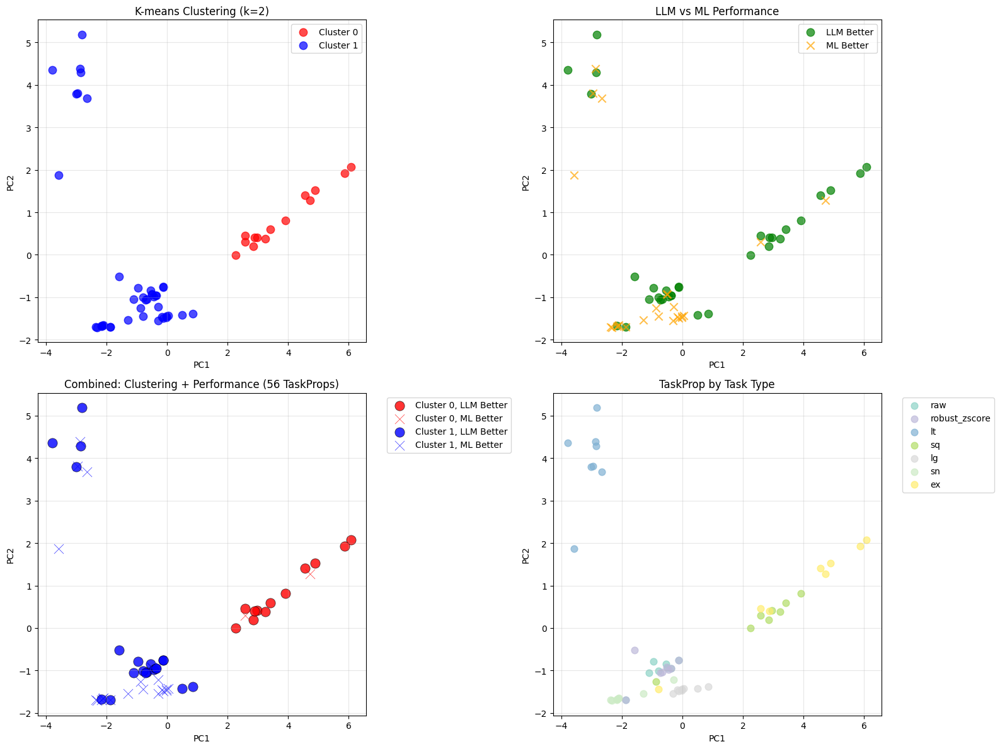


🎯 TaskProp 클러스터링 분석 결과
📊 전체 요약:
  총 TaskProp 조합: 56개
  LLM이 더 좋은 경우: 32개 (57.1%)
  ML이 더 좋은 경우: 24개 (42.9%)

📊 Cluster 0 (14개 TaskProp):
  LLM Better: 12개 (85.7%)
  ML Better: 2개
  Task 분포: {'sq': 7, 'ex': 7}
  Property 분포: {'Molecular Weight': 2, 'LogP': 2, 'TPSA': 2, 'MolMR': 2, 'BJ': 2, 'Chi': 2, 'HKA': 2}

📊 Cluster 1 (42개 TaskProp):
  LLM Better: 20개 (47.6%)
  ML Better: 22개
  Task 분포: {'raw': 8, 'robust_zscore': 8, 'lt': 8, 'lg': 8, 'sn': 8, 'sq': 1, 'ex': 1}
  Property 분포: {'sp3': 7, 'Molecular Weight': 5, 'LogP': 5, 'TPSA': 5, 'MolMR': 5, 'BJ': 5, 'Chi': 5, 'HKA': 5}

📊 4가지 조합별 분석:
  Red o (Cluster 0, LLM Better): 12개
    예시: sq_molecular_weight, ex_molecular_weight, sq_logp
  Red x (Cluster 0, ML Better): 2개
    예시: ex_logp, sq_molmr
  Blue o (Cluster 1, LLM Better): 20개
    예시: raw_molecular_weight, robust_zscore_molecular_weight, raw_logp
  Blue x (Cluster 1, ML Better): 22개
    예시: lt_molecular_weight, lg_molecular_weight, sn_molecular_weight


In [77]:
# 2. LLM vs ML 성능 비교 수행
better_llm_df, all_results_df = run_complete_analysis(consolidator)

# 3. 이제 TaskProp 분석 실행
feature_df, pca, scaler, kmeans = run_taskprop_analysis(esol, better_llm_df)

In [78]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns

def perform_logistic_regression_analysis(feature_df):
    """
    분포 특성을 이용한 LLM 성능 예측 로지스틱 회귀 분석
    
    Args:
        feature_df: TaskProp 특성 DataFrame
    
    Returns:
        분석 결과들
    """
    
    print("🎯 로지스틱 회귀 분석 시작")
    print("="*50)
    
    # 특성 컬럼 정의
    feature_columns = ['mean', 'median', 'std', 'mad', 'skewness', 'kurtosis', 
                      'range', 'iqr', 'cv', 'outlier_ratio_3sigma', 'outlier_ratio_iqr',
                      'robust_std_ratio', 'mean_median_diff', 'entropy', 'tail_ratio', 'zero_crossings']
    
    # 데이터 준비
    X = feature_df[feature_columns].values
    y = feature_df['llm_better'].values.astype(int)  # True/False -> 1/0
    
    # NaN 처리
    X = np.nan_to_num(X)
    
    print(f"📊 데이터 요약:")
    print(f"  샘플 수: {len(X)}")
    print(f"  특성 수: {X.shape[1]}")
    print(f"  LLM Better: {np.sum(y)}개 ({np.sum(y)/len(y)*100:.1f}%)")
    print(f"  ML Better: {len(y)-np.sum(y)}개 ({(len(y)-np.sum(y))/len(y)*100:.1f}%)")
    
    # 표준화
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # 로지스틱 회귀 (오버피팅 허용)
    # C=1e6으로 정규화를 거의 없애서 오버피팅 유도
    logistic_model = LogisticRegression(C=1e6, random_state=42, max_iter=1000)
    logistic_model.fit(X_scaled, y)
    
    # 예측
    y_pred = logistic_model.predict(X_scaled)
    y_pred_proba = logistic_model.predict_proba(X_scaled)[:, 1]
    
    # 성능 평가
    accuracy = accuracy_score(y, y_pred)
    
    print(f"\n📈 모델 성능:")
    print(f"  정확도: {accuracy:.4f}")
    print(f"  오버피팅 정도: {'높음' if accuracy > 0.9 else '보통' if accuracy > 0.7 else '낮음'}")
    
    # 계수 분석
    coefficients = logistic_model.coef_[0]
    
    # 계수 DataFrame 생성
    coef_df = pd.DataFrame({
        'feature': feature_columns,
        'coefficient': coefficients,
        'abs_coefficient': np.abs(coefficients)
    })
    
    # 절댓값 기준 정렬
    coef_df = coef_df.sort_values('abs_coefficient', ascending=False)
    
    print(f"\n🔍 특성별 계수 분석:")
    print("-" * 60)
    print(f"{'순위':<4} {'특성':<20} {'계수':<12} {'절댓값':<10} {'영향':<8}")
    print("-" * 60)
    
    for idx, (_, row) in enumerate(coef_df.iterrows(), 1):
        feature = row['feature']
        coef = row['coefficient']
        abs_coef = row['abs_coefficient']
        impact = "LLM+" if coef > 0 else "ML+"
        
        print(f"{idx:<4} {feature:<20} {coef:<12.4f} {abs_coef:<10.4f} {impact:<8}")
    
    return logistic_model, scaler, coef_df, y_pred, y_pred_proba

def analyze_top_features(coef_df, feature_df, top_n=5):
    """
    상위 중요 특성들에 대한 상세 분석
    """
    print(f"\n🏆 상위 {top_n}개 중요 특성 상세 분석")
    print("="*70)
    
    top_features = coef_df.head(top_n)
    
    for idx, (_, row) in enumerate(top_features.iterrows(), 1):
        feature = row['feature']
        coef = row['coefficient']
        
        print(f"\n{idx}. {feature} (계수: {coef:.4f})")
        print("-" * 50)
        
        # LLM Better vs ML Better 그룹별 특성값 비교
        llm_better_values = feature_df[feature_df['llm_better'] == True][feature]
        ml_better_values = feature_df[feature_df['llm_better'] == False][feature]
        
        print(f"  LLM Better 그룹:")
        print(f"    평균: {llm_better_values.mean():.4f}")
        print(f"    표준편차: {llm_better_values.std():.4f}")
        print(f"    범위: [{llm_better_values.min():.4f}, {llm_better_values.max():.4f}]")
        
        print(f"  ML Better 그룹:")
        print(f"    평균: {ml_better_values.mean():.4f}")
        print(f"    표준편차: {ml_better_values.std():.4f}")
        print(f"    범위: [{ml_better_values.min():.4f}, {ml_better_values.max():.4f}]")
        
        # 차이 분석
        mean_diff = llm_better_values.mean() - ml_better_values.mean()
        direction = "높을수록" if coef > 0 else "낮을수록"
        print(f"  해석: {feature}가 {direction} LLM이 유리")
        print(f"  평균 차이: {mean_diff:.4f}")

def create_coefficient_visualization(coef_df, top_n=10):
    """
    계수 시각화
    """
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    # 1. 상위 계수 바 차트
    ax1 = axes[0, 0]
    top_coef = coef_df.head(top_n)
    colors = ['red' if x < 0 else 'blue' for x in top_coef['coefficient']]
    
    bars = ax1.barh(range(len(top_coef)), top_coef['coefficient'], color=colors, alpha=0.7)
    ax1.set_yticks(range(len(top_coef)))
    ax1.set_yticklabels(top_coef['feature'], fontsize=10)
    ax1.set_xlabel('Coefficient')
    ax1.set_title(f'Top {top_n} Features by Coefficient Magnitude')
    ax1.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    ax1.grid(True, alpha=0.3)
    
    # 범례 추가
    ax1.text(0.02, 0.98, 'Blue: LLM 유리\nRed: ML 유리', 
             transform=ax1.transAxes, verticalalignment='top',
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    # 2. 절댓값 기준 상위 계수
    ax2 = axes[0, 1]
    bars2 = ax2.barh(range(len(top_coef)), top_coef['abs_coefficient'], 
                     color='green', alpha=0.7)
    ax2.set_yticks(range(len(top_coef)))
    ax2.set_yticklabels(top_coef['feature'], fontsize=10)
    ax2.set_xlabel('|Coefficient|')
    ax2.set_title(f'Top {top_n} Features by Absolute Coefficient')
    ax2.grid(True, alpha=0.3)
    
    # 3. 모든 계수 분포
    ax3 = axes[1, 0]
    ax3.hist(coef_df['coefficient'], bins=20, alpha=0.7, color='skyblue', edgecolor='black')
    ax3.axvline(x=0, color='red', linestyle='--', linewidth=2)
    ax3.set_xlabel('Coefficient')
    ax3.set_ylabel('Frequency')
    ax3.set_title('Distribution of All Coefficients')
    ax3.grid(True, alpha=0.3)
    
    # 4. 계수 vs 절댓값 산점도
    ax4 = axes[1, 1]
    scatter = ax4.scatter(coef_df['coefficient'], coef_df['abs_coefficient'], 
                         alpha=0.7, c=coef_df['abs_coefficient'], cmap='viridis')
    
    # 상위 특성들에 라벨 추가
    for idx, (_, row) in enumerate(coef_df.head(5).iterrows()):
        ax4.annotate(row['feature'], (row['coefficient'], row['abs_coefficient']),
                    xytext=(5, 5), textcoords='offset points', fontsize=8)
    
    ax4.set_xlabel('Coefficient')
    ax4.set_ylabel('|Coefficient|')
    ax4.set_title('Coefficient vs Absolute Value')
    ax4.grid(True, alpha=0.3)
    plt.colorbar(scatter, ax=ax4)
    
    plt.tight_layout()
    plt.show()
    
    return fig

def analyze_feature_groups(coef_df):
    """
    특성 그룹별 분석
    """
    print(f"\n📋 특성 그룹별 중요도 분석")
    print("="*50)
    
    # 특성 그룹 정의
    feature_groups = {
        '기본 통계량': ['mean', 'median', 'std', 'mad'],
        '분포 형태': ['skewness', 'kurtosis'],
        '변동성': ['range', 'iqr', 'cv'],
        '이상값': ['outlier_ratio_3sigma', 'outlier_ratio_iqr'],
        '정규성': ['robust_std_ratio', 'mean_median_diff'],
        '복잡성': ['entropy', 'tail_ratio', 'zero_crossings']
    }
    
    group_importance = {}
    
    for group_name, features in feature_groups.items():
        group_coefs = coef_df[coef_df['feature'].isin(features)]
        if not group_coefs.empty:
            avg_abs_coef = group_coefs['abs_coefficient'].mean()
            max_abs_coef = group_coefs['abs_coefficient'].max()
            group_importance[group_name] = {
                'avg_importance': avg_abs_coef,
                'max_importance': max_abs_coef,
                'features': list(group_coefs['feature'])
            }
    
    # 중요도 순으로 정렬
    sorted_groups = sorted(group_importance.items(), 
                          key=lambda x: x[1]['avg_importance'], reverse=True)
    
    for group_name, stats in sorted_groups:
        print(f"\n{group_name}:")
        print(f"  평균 중요도: {stats['avg_importance']:.4f}")
        print(f"  최대 중요도: {stats['max_importance']:.4f}")
        print(f"  포함 특성: {', '.join(stats['features'])}")

def create_prediction_analysis(feature_df, y_pred, y_pred_proba):
    """
    예측 결과 상세 분석
    """
    print(f"\n🎯 예측 결과 상세 분석")
    print("="*50)
    
    # 예측 확률별 분석
    feature_df_copy = feature_df.copy()
    feature_df_copy['pred_proba'] = y_pred_proba
    feature_df_copy['predicted'] = y_pred
    feature_df_copy['correct'] = (feature_df_copy['llm_better'].astype(int) == y_pred)
    
    # 확신도별 그룹 분석
    high_conf_llm = feature_df_copy[y_pred_proba > 0.8]
    high_conf_ml = feature_df_copy[y_pred_proba < 0.2]
    uncertain = feature_df_copy[(y_pred_proba >= 0.2) & (y_pred_proba <= 0.8)]
    
    print(f"높은 확신 LLM 예측: {len(high_conf_llm)}개")
    print(f"높은 확신 ML 예측: {len(high_conf_ml)}개")
    print(f"불확실한 예측: {len(uncertain)}개")
    
    if len(high_conf_llm) > 0:
        print(f"\n🔵 높은 확신 LLM 예측 케이스들:")
        for _, row in high_conf_llm.iterrows():
            status = "✓" if row['correct'] else "✗"
            print(f"  {status} {row['taskprop']} (확률: {row['pred_proba']:.3f})")
    
    if len(high_conf_ml) > 0:
        print(f"\n🔴 높은 확신 ML 예측 케이스들:")
        for _, row in high_conf_ml.iterrows():
            status = "✓" if row['correct'] else "✗"
            print(f"  {status} {row['taskprop']} (확률: {row['pred_proba']:.3f})")

def run_complete_logistic_analysis(feature_df):
    """
    전체 로지스틱 회귀 분석 실행
    """
    print("🚀 LLM 성능 예측을 위한 로지스틱 회귀 분석")
    print("="*60)
    
    # 1. 로지스틱 회귀 수행
    model, scaler, coef_df, y_pred, y_pred_proba = perform_logistic_regression_analysis(feature_df)
    
    # 2. 상위 특성 분석
    analyze_top_features(coef_df, feature_df, top_n=5)
    
    # 3. 특성 그룹별 분석
    analyze_feature_groups(coef_df)
    
    # 4. 시각화
    fig = create_coefficient_visualization(coef_df, top_n=10)
    
    # 5. 예측 결과 분석
    create_prediction_analysis(feature_df, y_pred, y_pred_proba)
    
    return model, scaler, coef_df

if __name__ == "__main__":
    print("사용 방법:")
    print("model, scaler, coef_df = run_complete_logistic_analysis(feature_df)")

사용 방법:
model, scaler, coef_df = run_complete_logistic_analysis(feature_df)


🚀 LLM 성능 예측을 위한 로지스틱 회귀 분석
🎯 로지스틱 회귀 분석 시작
📊 데이터 요약:
  샘플 수: 56
  특성 수: 16
  LLM Better: 32개 (57.1%)
  ML Better: 24개 (42.9%)

📈 모델 성능:
  정확도: 0.8750
  오버피팅 정도: 보통

🔍 특성별 계수 분석:
------------------------------------------------------------
순위   특성                   계수           절댓값        영향      
------------------------------------------------------------
1    mad                  -147.6505    147.6505   ML+     
2    iqr                  113.1381     113.1381   LLM+    
3    std                  28.6994      28.6994    LLM+    
4    robust_std_ratio     14.3837      14.3837    LLM+    
5    tail_ratio           -7.5172      7.5172     ML+     
6    kurtosis             6.6532       6.6532     LLM+    
7    cv                   4.2388       4.2388     LLM+    
8    entropy              -4.0141      4.0141     ML+     
9    skewness             -3.8479      3.8479     ML+     
10   range                3.1892       3.1892     LLM+    
11   outlier_ratio_3sigma 3.1114       3.1114     L

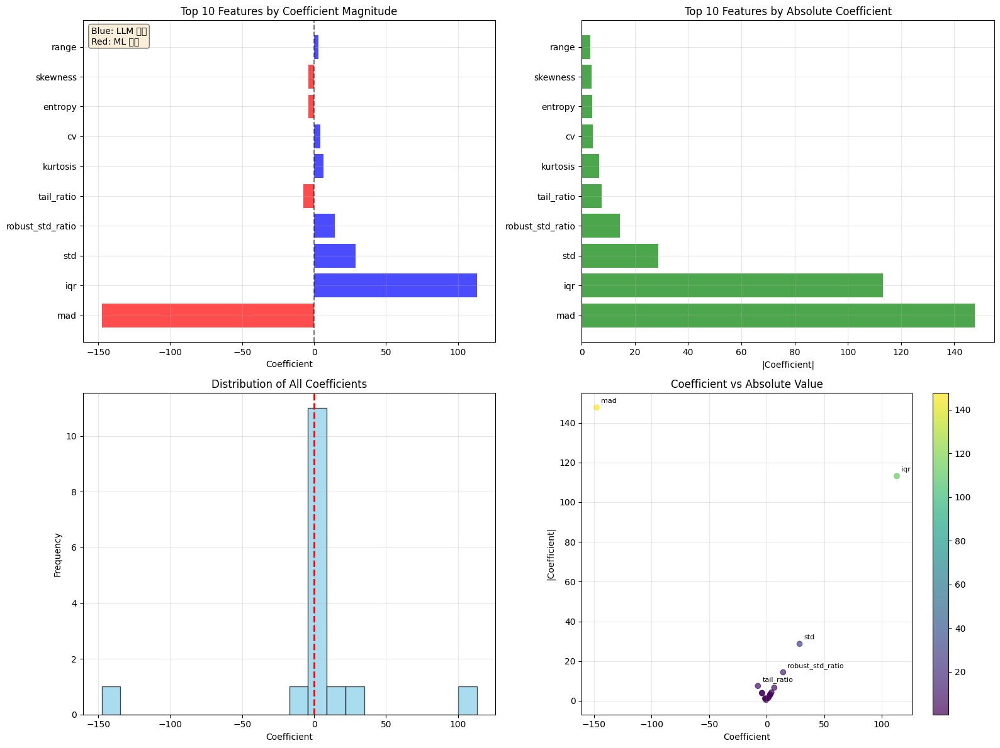


🎯 예측 결과 상세 분석
높은 확신 LLM 예측: 26개
높은 확신 ML 예측: 18개
불확실한 예측: 12개

🔵 높은 확신 LLM 예측 케이스들:
  ✓ robust_zscore_molecular_weight (확률: 0.947)
  ✓ sq_molecular_weight (확률: 0.918)
  ✓ ex_molecular_weight (확률: 0.840)
  ✓ lt_logp (확률: 0.998)
  ✓ sq_logp (확률: 0.824)
  ✓ raw_tpsa (확률: 1.000)
  ✓ robust_zscore_tpsa (확률: 1.000)
  ✓ sq_tpsa (확률: 0.903)
  ✓ ex_tpsa (확률: 1.000)
  ✓ lg_sp3 (확률: 0.991)
  ✓ raw_molmr (확률: 0.929)
  ✓ robust_zscore_molmr (확률: 0.960)
  ✓ lt_molmr (확률: 0.994)
  ✗ sq_molmr (확률: 0.805)
  ✗ raw_bj (확률: 0.822)
  ✗ robust_zscore_bj (확률: 0.836)
  ✓ sq_bj (확률: 0.993)
  ✓ raw_chi (확률: 0.958)
  ✓ robust_zscore_chi (확률: 0.960)
  ✓ lt_chi (확률: 1.000)
  ✓ sq_chi (확률: 0.826)
  ✓ ex_chi (확률: 0.870)
  ✓ robust_zscore_hka (확률: 1.000)
  ✓ lt_hka (확률: 0.984)
  ✓ sq_hka (확률: 0.979)
  ✓ ex_hka (확률: 0.997)

🔴 높은 확신 ML 예측 케이스들:
  ✓ lt_molecular_weight (확률: 0.054)
  ✓ lg_molecular_weight (확률: 0.004)
  ✓ sn_molecular_weight (확률: 0.105)
  ✓ lg_logp (확률: 0.121)
  ✓ sn_logp (확률: 0.018)
  ✓ lt_tpsa (확률: 0.0

In [79]:
model, scaler, coef_df = run_complete_logistic_analysis(feature_df)

# 상위 계수들 확인
print(coef_df.head(10))

In [34]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import seaborn as sns

def perform_refined_clustering(feature_df, coef_df, top_n_features=None, min_coef_threshold=None):
    """
    로지스틱 회귀 계수를 바탕으로 중요한 특성들만 사용한 개선된 클러스터링
    
    Args:
        feature_df: 원본 특성 DataFrame
        coef_df: 로지스틱 회귀 계수 DataFrame
        top_n_features: 상위 N개 특성만 사용 (None이면 threshold 사용)
        min_coef_threshold: 최소 계수 절댓값 임계치
    
    Returns:
        refined_feature_df, selected_features, clustering_results
    """
    
    print("🔄 로지스틱 회귀 계수 기반 개선된 클러스터링")
    print("="*60)
    
    # 중요한 특성 선택
    if top_n_features is not None:
        selected_features = coef_df.head(top_n_features)['feature'].tolist()
        selection_method = f"상위 {top_n_features}개 특성"
    elif min_coef_threshold is not None:
        selected_features = coef_df[coef_df['abs_coefficient'] >= min_coef_threshold]['feature'].tolist()
        selection_method = f"계수 절댓값 >= {min_coef_threshold}"
    else:
        # 기본값: 상위 8개 특성 (전체의 절반)
        selected_features = coef_df.head(8)['feature'].tolist()
        selection_method = "상위 8개 특성 (기본값)"
    
    print(f"📊 특성 선택 방법: {selection_method}")
    print(f"🎯 선택된 특성 ({len(selected_features)}개):")
    
    # 선택된 특성들과 계수 정보 출력
    for i, feature in enumerate(selected_features, 1):
        coef_info = coef_df[coef_df['feature'] == feature].iloc[0]
        coef_val = coef_info['coefficient']
        abs_coef = coef_info['abs_coefficient']
        direction = "LLM 유리" if coef_val > 0 else "ML 유리"
        print(f"  {i:2d}. {feature:<20} (계수: {coef_val:8.4f}, {direction})")
    
    # 선택된 특성들로 데이터 준비
    X_selected = feature_df[selected_features].values
    X_selected = np.nan_to_num(X_selected)
    
    # 표준화
    scaler_refined = StandardScaler()
    X_scaled_refined = scaler_refined.fit_transform(X_selected)
    
    # K-means 클러스터링 (k=2)
    kmeans_refined = KMeans(n_clusters=2, random_state=42, n_init=10)
    clusters_refined = kmeans_refined.fit_predict(X_scaled_refined)
    
    # 결과를 DataFrame에 추가
    refined_df = feature_df.copy()
    refined_df['cluster_refined'] = clusters_refined
    
    print(f"\n🎯 개선된 클러스터링 결과:")
    print(f"클러스터 0: {np.sum(clusters_refined == 0)}개 TaskProp")
    print(f"클러스터 1: {np.sum(clusters_refined == 1)}개 TaskProp")
    
    # PCA로 2차원 시각화 (선택된 특성들로)
    pca_refined = PCA(n_components=2)
    X_pca_refined = pca_refined.fit_transform(X_scaled_refined)
    
    refined_df['pca1_refined'] = X_pca_refined[:, 0]
    refined_df['pca2_refined'] = X_pca_refined[:, 1]
    
    print(f"📊 개선된 PCA 설명 분산비: PC1={pca_refined.explained_variance_ratio_[0]:.3f}, PC2={pca_refined.explained_variance_ratio_[1]:.3f}")
    
    # 클러스터링 품질 비교
    compare_clustering_quality(refined_df)
    
    clustering_results = {
        'selected_features': selected_features,
        'scaler': scaler_refined,
        'kmeans': kmeans_refined,
        'pca': pca_refined,
        'X_scaled': X_scaled_refined
    }
    
    return refined_df, clustering_results

def compare_clustering_quality(refined_df):
    """
    원본 클러스터링 vs 개선된 클러스터링 품질 비교
    """
    print(f"\n📈 클러스터링 품질 비교:")
    print("-" * 50)
    
    # 원본 클러스터링에서 LLM 성능 예측 정확도
    if 'cluster' in refined_df.columns:
        original_accuracy = calculate_cluster_prediction_accuracy(refined_df, 'cluster')
        print(f"원본 클러스터링 예측 정확도: {original_accuracy:.3f}")
    
    # 개선된 클러스터링에서 LLM 성능 예측 정확도
    refined_accuracy = calculate_cluster_prediction_accuracy(refined_df, 'cluster_refined')
    print(f"개선된 클러스터링 예측 정확도: {refined_accuracy:.3f}")
    
    # 클러스터 내 LLM 성능 비율 분석
    analyze_cluster_performance_distribution(refined_df)

def calculate_cluster_prediction_accuracy(df, cluster_col):
    """
    클러스터링으로 LLM 성능을 얼마나 잘 예측하는지 계산
    """
    cluster_0_llm_ratio = df[df[cluster_col] == 0]['llm_better'].mean()
    cluster_1_llm_ratio = df[df[cluster_col] == 1]['llm_better'].mean()
    
    # 더 높은 LLM 비율을 가진 클러스터를 'LLM 클러스터'로 가정
    if cluster_0_llm_ratio > cluster_1_llm_ratio:
        llm_cluster = 0
        predicted_labels = (df[cluster_col] == 0).astype(int)
    else:
        llm_cluster = 1
        predicted_labels = (df[cluster_col] == 1).astype(int)
    
    actual_labels = df['llm_better'].astype(int)
    accuracy = (predicted_labels == actual_labels).mean()
    
    return accuracy

def analyze_cluster_performance_distribution(refined_df):
    """
    클러스터별 성능 분포 상세 분석
    """
    print(f"\n📊 클러스터별 LLM 성능 분포 (개선된 클러스터링):")
    print("-" * 60)
    
    for cluster in [0, 1]:
        cluster_data = refined_df[refined_df['cluster_refined'] == cluster]
        llm_better_count = cluster_data['llm_better'].sum()
        total_count = len(cluster_data)
        llm_ratio = llm_better_count / total_count
        
        print(f"\n🔸 Cluster {cluster} ({total_count}개 TaskProp):")
        print(f"  LLM Better: {llm_better_count}개 ({llm_ratio:.1%})")
        print(f"  ML Better: {total_count - llm_better_count}개 ({1-llm_ratio:.1%})")
        
        # Task별 분포
        task_dist = cluster_data.groupby('task')['llm_better'].agg(['count', 'sum', 'mean'])
        print(f"  Task별 분포:")
        for task, stats in task_dist.iterrows():
            print(f"    {task}: {stats['sum']}/{stats['count']} LLM Better ({stats['mean']:.1%})")
        
        # Property별 분포
        prop_dist = cluster_data.groupby('property')['llm_better'].agg(['count', 'sum', 'mean'])
        print(f"  Property별 분포:")
        for prop, stats in prop_dist.iterrows():
            print(f"    {prop}: {stats['sum']}/{stats['count']} LLM Better ({stats['mean']:.1%})")

def create_refined_visualization(refined_df, clustering_results):
    """
    개선된 클러스터링 결과 시각화
    """
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    
    # 색상과 마커 정의
    cluster_colors = {0: 'red', 1: 'blue'}
    performance_markers = {True: 'o', False: 'x'}
    
    # 1. 원본 클러스터링 (비교용)
    ax1 = axes[0, 0]
    if 'cluster' in refined_df.columns and 'pca1' in refined_df.columns:
        for cluster in [0, 1]:
            mask = refined_df['cluster'] == cluster
            ax1.scatter(refined_df[mask]['pca1'], refined_df[mask]['pca2'], 
                       c=cluster_colors[cluster], label=f'Cluster {cluster}', 
                       alpha=0.7, s=60)
        ax1.set_title('Original Clustering (All Features)')
    else:
        ax1.text(0.5, 0.5, 'Original clustering\nnot available', 
                transform=ax1.transAxes, ha='center', va='center')
        ax1.set_title('Original Clustering (Not Available)')
    
    ax1.set_xlabel('PC1')
    ax1.set_ylabel('PC2')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # 2. 개선된 클러스터링
    ax2 = axes[0, 1]
    for cluster in [0, 1]:
        mask = refined_df['cluster_refined'] == cluster
        ax2.scatter(refined_df[mask]['pca1_refined'], refined_df[mask]['pca2_refined'], 
                   c=cluster_colors[cluster], label=f'Cluster {cluster}', 
                   alpha=0.7, s=60)
    
    ax2.set_xlabel('PC1 (Refined)')
    ax2.set_ylabel('PC2 (Refined)')
    ax2.set_title('Refined Clustering (Selected Features)')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    # 3. 성능 기준 시각화
    ax3 = axes[0, 2]
    for better in [True, False]:
        mask = refined_df['llm_better'] == better
        color = 'green' if better else 'orange'
        marker = performance_markers[better]
        label = 'LLM Better' if better else 'ML Better'
        ax3.scatter(refined_df[mask]['pca1_refined'], refined_df[mask]['pca2_refined'], 
                   c=color, marker=marker, label=label, alpha=0.7, s=60)
    
    ax3.set_xlabel('PC1 (Refined)')
    ax3.set_ylabel('PC2 (Refined)')
    ax3.set_title('Performance-based View')
    ax3.legend()
    ax3.grid(True, alpha=0.3)
    
    # 4. 통합 시각화 (4가지 조합)
    ax4 = axes[1, 0]
    combinations = [
        (0, True, 'red', 'o', 'Cluster 0, LLM Better'),
        (0, False, 'red', 'x', 'Cluster 0, ML Better'),
        (1, True, 'blue', 'o', 'Cluster 1, LLM Better'),
        (1, False, 'blue', 'x', 'Cluster 1, ML Better')
    ]
    
    for cluster, llm_better, color, marker, label in combinations:
        mask = (refined_df['cluster_refined'] == cluster) & (refined_df['llm_better'] == llm_better)
        if mask.any():
            ax4.scatter(refined_df[mask]['pca1_refined'], refined_df[mask]['pca2_refined'], 
                       c=color, marker=marker, s=100, alpha=0.8, label=label,
                       edgecolors='black', linewidth=0.5)
    
    ax4.set_xlabel('PC1 (Refined)')
    ax4.set_ylabel('PC2 (Refined)')
    ax4.set_title('Refined: Clustering + Performance')
    ax4.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax4.grid(True, alpha=0.3)
    
    # 5. 특성 중요도 (선택된 특성들)
    ax5 = axes[1, 1]
    selected_features = clustering_results['selected_features']
    
    # 클러스터별 선택된 특성들의 평균값
    cluster_means = refined_df.groupby('cluster_refined')[selected_features].mean()
    cluster_means_norm = (cluster_means - cluster_means.mean()) / cluster_means.std()
    
    im = ax5.imshow(cluster_means_norm.values, cmap='RdBu_r', aspect='auto')
    ax5.set_xticks(range(len(selected_features)))
    ax5.set_xticklabels(selected_features, rotation=45, ha='right')
    ax5.set_yticks(range(2))
    ax5.set_yticklabels([f'Cluster {i}' for i in range(2)])
    ax5.set_title('Selected Features Heatmap')
    plt.colorbar(im, ax=ax5)
    
    # 6. 클러스터 변화 비교
    ax6 = axes[1, 2]
    if 'cluster' in refined_df.columns:
        # 원본 vs 개선된 클러스터 할당 변화
        change_matrix = pd.crosstab(refined_df['cluster'], refined_df['cluster_refined'], 
                                   margins=True, margins_name='Total')
        
        # 변화 행렬 시각화
        sns.heatmap(change_matrix.iloc[:-1, :-1], annot=True, fmt='d', 
                   cmap='Blues', ax=ax6)
        ax6.set_title('Cluster Assignment Changes')
        ax6.set_xlabel('Refined Cluster')
        ax6.set_ylabel('Original Cluster')
    else:
        ax6.text(0.5, 0.5, 'Original clustering\nnot available\nfor comparison', 
                transform=ax6.transAxes, ha='center', va='center')
        ax6.set_title('Cluster Comparison (Not Available)')
    
    plt.tight_layout()
    plt.show()
    
    return fig

def analyze_feature_importance_in_clusters(refined_df, clustering_results):
    """
    클러스터에서 선택된 특성들의 중요도 분석
    """
    print(f"\n🔍 선택된 특성들의 클러스터별 분석")
    print("="*60)
    
    selected_features = clustering_results['selected_features']
    
    for feature in selected_features:
        print(f"\n📊 {feature}:")
        
        cluster_stats = refined_df.groupby('cluster_refined')[feature].agg(['mean', 'std', 'min', 'max'])
        
        for cluster in [0, 1]:
            stats = cluster_stats.loc[cluster]
            print(f"  Cluster {cluster}: 평균={stats['mean']:.4f}, 표준편차={stats['std']:.4f}")
        
        # 클러스터 간 차이
        diff = cluster_stats.loc[1, 'mean'] - cluster_stats.loc[0, 'mean']
        print(f"  클러스터 간 평균 차이: {diff:.4f}")

def run_refined_clustering_analysis(feature_df, coef_df, top_n_features=8):
    """
    전체 개선된 클러스터링 분석 실행
    """
    print("🚀 로지스틱 회귀 계수 기반 개선된 클러스터링 분석")
    print("="*70)
    
    # 1. 개선된 클러스터링 수행
    refined_df, clustering_results = perform_refined_clustering(
        feature_df, coef_df, top_n_features=top_n_features
    )
    
    # 2. 시각화
    fig = create_refined_visualization(refined_df, clustering_results)
    
    # 3. 특성 중요도 분석
    analyze_feature_importance_in_clusters(refined_df, clustering_results)
    
    return refined_df, clustering_results

if __name__ == "__main__":
    print("사용 방법:")
    print("refined_df, clustering_results = run_refined_clustering_analysis(feature_df, coef_df, top_n_features=8)")

사용 방법:
refined_df, clustering_results = run_refined_clustering_analysis(feature_df, coef_df, top_n_features=8)


🚀 로지스틱 회귀 계수 기반 개선된 클러스터링 분석
🔄 로지스틱 회귀 계수 기반 개선된 클러스터링
📊 특성 선택 방법: 상위 8개 특성
🎯 선택된 특성 (8개):
   1. mad                  (계수: -147.6505, ML 유리)
   2. iqr                  (계수: 113.1381, LLM 유리)
   3. std                  (계수:  28.6994, LLM 유리)
   4. robust_std_ratio     (계수:  14.3837, LLM 유리)
   5. tail_ratio           (계수:  -7.5172, ML 유리)
   6. kurtosis             (계수:   6.6532, LLM 유리)
   7. cv                   (계수:   4.2388, LLM 유리)
   8. entropy              (계수:  -4.0141, ML 유리)

🎯 개선된 클러스터링 결과:
클러스터 0: 48개 TaskProp
클러스터 1: 8개 TaskProp
🔄 t-SNE 차원 축소 수행 중...
✅ t-SNE 차원 축소 완료
📊 PCA 설명 분산비 (참고): PC1=0.460, PC2=0.327

📈 클러스터링 품질 비교:
--------------------------------------------------
원본 클러스터링 예측 정확도: 0.607
개선된 클러스터링 예측 정확도: 0.571

📊 클러스터별 LLM 성능 분포 (개선된 클러스터링):
------------------------------------------------------------

🔸 Cluster 0 (48개 TaskProp):
  LLM Better: 28개 (58.3%)
  ML Better: 20개 (41.7%)
  Task별 분포:
    ex: 6.0/8.0 LLM Better (75.0%)
    lg: 2.0/8.0 LLM Better (25.0%)
    r

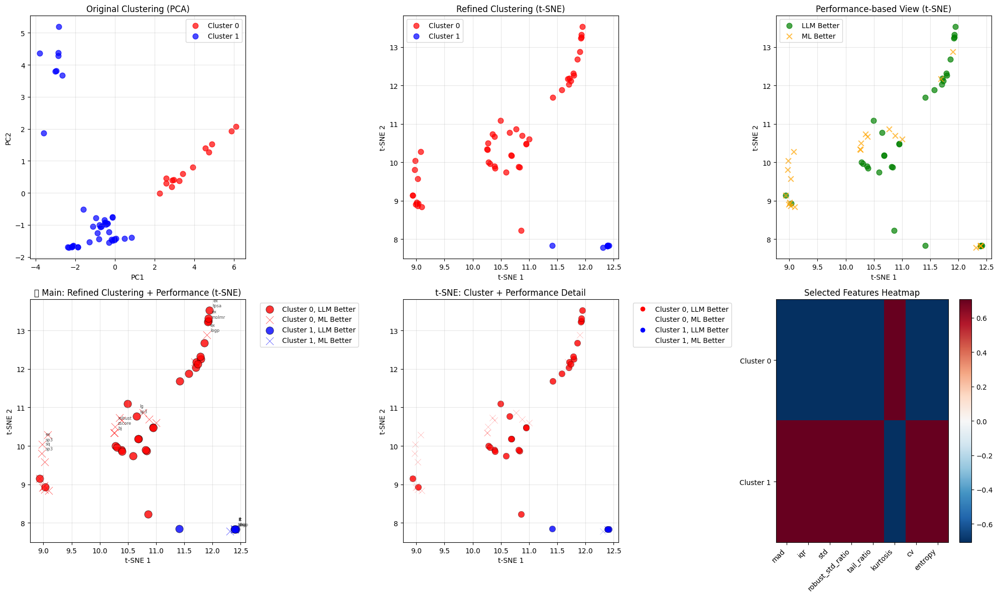


🔍 선택된 특성들의 클러스터별 분석

📊 mad:
  Cluster 0: 평균=2.8258, 표준편차=10.8606
  Cluster 1: 평균=674.4908, 표준편차=0.0000
  클러스터 간 평균 차이: 671.6650

📊 iqr:
  Cluster 0: 평균=6.0262, 표준편차=23.1037
  Cluster 1: 평균=1408.0572, 표준편차=56.2153
  클러스터 간 평균 차이: 1402.0310

📊 std:
  Cluster 0: 평균=4.3447, 표준편차=15.7112
  Cluster 1: 평균=998.3650, 표준편차=163.3493
  클러스터 간 평균 차이: 994.0202

📊 robust_std_ratio:
  Cluster 0: 평균=0.7774, 표준편차=0.4526
  Cluster 1: 평균=1.0274, 표준편차=0.1844
  클러스터 간 평균 차이: 0.2500

📊 tail_ratio:
  Cluster 0: 평균=0.4461, 표준편차=0.3408
  Cluster 1: 평균=0.4620, 표준편차=0.2186
  클러스터 간 평균 차이: 0.0160

📊 kurtosis:
  Cluster 0: 평균=76.0096, 표준편차=173.7504
  Cluster 1: 평균=1.2731, 표준편차=1.5148
  클러스터 간 평균 차이: -74.7365

📊 cv:
  Cluster 0: 평균=101.5538, 표준편차=631.5386
  Cluster 1: 평균=553.8806, 표준편차=1545.9235
  클러스터 간 평균 차이: 452.3267

📊 entropy:
  Cluster 0: 평균=2.9995, 표준편차=1.3975
  Cluster 1: 평균=3.7669, 표준편차=0.2271
  클러스터 간 평균 차이: 0.7674


In [80]:
refined_df, clustering_results = run_refined_clustering_analysis(feature_df, coef_df, top_n_features=8)

In [81]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import seaborn as sns

def perform_refined_clustering(feature_df, coef_df, top_n_features=None, min_coef_threshold=None):
    """
    로지스틱 회귀 계수를 바탕으로 중요한 특성들만 사용한 개선된 클러스터링
    
    Args:
        feature_df: 원본 특성 DataFrame
        coef_df: 로지스틱 회귀 계수 DataFrame
        top_n_features: 상위 N개 특성만 사용 (None이면 threshold 사용)
        min_coef_threshold: 최소 계수 절댓값 임계치
    
    Returns:
        refined_feature_df, selected_features, clustering_results
    """
    
    print("🔄 로지스틱 회귀 계수 기반 개선된 클러스터링")
    print("="*60)
    
    # 중요한 특성 선택
    if top_n_features is not None:
        selected_features = coef_df.head(top_n_features)['feature'].tolist()
        selection_method = f"상위 {top_n_features}개 특성"
    elif min_coef_threshold is not None:
        selected_features = coef_df[coef_df['abs_coefficient'] >= min_coef_threshold]['feature'].tolist()
        selection_method = f"계수 절댓값 >= {min_coef_threshold}"
    else:
        # 기본값: 상위 8개 특성 (전체의 절반)
        selected_features = coef_df.head(8)['feature'].tolist()
        selection_method = "상위 8개 특성 (기본값)"
    
    print(f"📊 특성 선택 방법: {selection_method}")
    print(f"🎯 선택된 특성 ({len(selected_features)}개):")
    
    # 선택된 특성들과 계수 정보 출력
    for i, feature in enumerate(selected_features, 1):
        coef_info = coef_df[coef_df['feature'] == feature].iloc[0]
        coef_val = coef_info['coefficient']
        abs_coef = coef_info['abs_coefficient']
        direction = "LLM 유리" if coef_val > 0 else "ML 유리"
        print(f"  {i:2d}. {feature:<20} (계수: {coef_val:8.4f}, {direction})")
    
    # 선택된 특성들로 데이터 준비
    X_selected = feature_df[selected_features].values
    X_selected = np.nan_to_num(X_selected)
    
    # 표준화
    scaler_refined = StandardScaler()
    X_scaled_refined = scaler_refined.fit_transform(X_selected)
    
    # K-means 클러스터링 (k=2)
    kmeans_refined = KMeans(n_clusters=2, random_state=42, n_init=10)
    clusters_refined = kmeans_refined.fit_predict(X_scaled_refined)
    
    # 결과를 DataFrame에 추가
    refined_df = feature_df.copy()
    refined_df['cluster_refined'] = clusters_refined
    
    print(f"\n🎯 개선된 클러스터링 결과:")
    print(f"클러스터 0: {np.sum(clusters_refined == 0)}개 TaskProp")
    print(f"클러스터 1: {np.sum(clusters_refined == 1)}개 TaskProp")
    
    # t-SNE로 2차원 시각화 (선택된 특성들로)
    print("🔄 t-SNE 차원 축소 수행 중...")
    tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, len(X_scaled_refined)-1))
    X_tsne = tsne.fit_transform(X_scaled_refined)
    
    refined_df['tsne1'] = X_tsne[:, 0]
    refined_df['tsne2'] = X_tsne[:, 1]
    
    print(f"✅ t-SNE 차원 축소 완료")
    
    # PCA도 함께 계산 (비교용)
    pca_refined = PCA(n_components=2)
    X_pca_refined = pca_refined.fit_transform(X_scaled_refined)
    
    refined_df['pca1_refined'] = X_pca_refined[:, 0]
    refined_df['pca2_refined'] = X_pca_refined[:, 1]
    
    print(f"📊 PCA 설명 분산비 (참고): PC1={pca_refined.explained_variance_ratio_[0]:.3f}, PC2={pca_refined.explained_variance_ratio_[1]:.3f}")
    
    # 클러스터링 품질 비교
    compare_clustering_quality(refined_df)
    
    clustering_results = {
        'selected_features': selected_features,
        'scaler': scaler_refined,
        'kmeans': kmeans_refined,
        'pca': pca_refined,
        'tsne': tsne,
        'X_scaled': X_scaled_refined
    }
    
    return refined_df, clustering_results

def compare_clustering_quality(refined_df):
    """
    원본 클러스터링 vs 개선된 클러스터링 품질 비교
    """
    print(f"\n📈 클러스터링 품질 비교:")
    print("-" * 50)
    
    # 원본 클러스터링에서 LLM 성능 예측 정확도
    if 'cluster' in refined_df.columns:
        original_accuracy = calculate_cluster_prediction_accuracy(refined_df, 'cluster')
        print(f"원본 클러스터링 예측 정확도: {original_accuracy:.3f}")
    
    # 개선된 클러스터링에서 LLM 성능 예측 정확도
    refined_accuracy = calculate_cluster_prediction_accuracy(refined_df, 'cluster_refined')
    print(f"개선된 클러스터링 예측 정확도: {refined_accuracy:.3f}")
    
    # 클러스터 내 LLM 성능 비율 분석
    analyze_cluster_performance_distribution(refined_df)

def calculate_cluster_prediction_accuracy(df, cluster_col):
    """
    클러스터링으로 LLM 성능을 얼마나 잘 예측하는지 계산
    """
    cluster_0_llm_ratio = df[df[cluster_col] == 0]['llm_better'].mean()
    cluster_1_llm_ratio = df[df[cluster_col] == 1]['llm_better'].mean()
    
    # 더 높은 LLM 비율을 가진 클러스터를 'LLM 클러스터'로 가정
    if cluster_0_llm_ratio > cluster_1_llm_ratio:
        llm_cluster = 0
        predicted_labels = (df[cluster_col] == 0).astype(int)
    else:
        llm_cluster = 1
        predicted_labels = (df[cluster_col] == 1).astype(int)
    
    actual_labels = df['llm_better'].astype(int)
    accuracy = (predicted_labels == actual_labels).mean()
    
    return accuracy

def analyze_cluster_performance_distribution(refined_df):
    """
    클러스터별 성능 분포 상세 분석
    """
    print(f"\n📊 클러스터별 LLM 성능 분포 (개선된 클러스터링):")
    print("-" * 60)
    
    for cluster in [0, 1]:
        cluster_data = refined_df[refined_df['cluster_refined'] == cluster]
        llm_better_count = cluster_data['llm_better'].sum()
        total_count = len(cluster_data)
        llm_ratio = llm_better_count / total_count
        
        print(f"\n🔸 Cluster {cluster} ({total_count}개 TaskProp):")
        print(f"  LLM Better: {llm_better_count}개 ({llm_ratio:.1%})")
        print(f"  ML Better: {total_count - llm_better_count}개 ({1-llm_ratio:.1%})")
        
        # Task별 분포
        task_dist = cluster_data.groupby('task')['llm_better'].agg(['count', 'sum', 'mean'])
        print(f"  Task별 분포:")
        for task, stats in task_dist.iterrows():
            print(f"    {task}: {stats['sum']}/{stats['count']} LLM Better ({stats['mean']:.1%})")
        
        # Property별 분포
        prop_dist = cluster_data.groupby('property')['llm_better'].agg(['count', 'sum', 'mean'])
        print(f"  Property별 분포:")
        for prop, stats in prop_dist.iterrows():
            print(f"    {prop}: {stats['sum']}/{stats['count']} LLM Better ({stats['mean']:.1%})")

def create_refined_visualization(refined_df, clustering_results):
    """
    개선된 클러스터링 결과 시각화 (t-SNE 사용)
    """
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    
    # 색상과 마커 정의
    cluster_colors = {0: 'red', 1: 'blue'}
    performance_markers = {True: 'o', False: 'x'}
    
    # 1. 원본 클러스터링 (PCA, 비교용)
    ax1 = axes[0, 0]
    if 'cluster' in refined_df.columns and 'pca1' in refined_df.columns:
        for cluster in [0, 1]:
            mask = refined_df['cluster'] == cluster
            ax1.scatter(refined_df[mask]['pca1'], refined_df[mask]['pca2'], 
                       c=cluster_colors[cluster], label=f'Cluster {cluster}', 
                       alpha=0.7, s=60)
        ax1.set_title('Original Clustering (PCA)')
    else:
        ax1.text(0.5, 0.5, 'Original clustering\nnot available', 
                transform=ax1.transAxes, ha='center', va='center')
        ax1.set_title('Original Clustering (Not Available)')
    
    ax1.set_xlabel('PC1')
    ax1.set_ylabel('PC2')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # 2. 개선된 클러스터링 (t-SNE)
    ax2 = axes[0, 1]
    for cluster in [0, 1]:
        mask = refined_df['cluster_refined'] == cluster
        ax2.scatter(refined_df[mask]['tsne1'], refined_df[mask]['tsne2'], 
                   c=cluster_colors[cluster], label=f'Cluster {cluster}', 
                   alpha=0.7, s=60)
    
    ax2.set_xlabel('t-SNE 1')
    ax2.set_ylabel('t-SNE 2')
    ax2.set_title('Refined Clustering (t-SNE)')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    # 3. 성능 기준 시각화 (t-SNE)
    ax3 = axes[0, 2]
    for better in [True, False]:
        mask = refined_df['llm_better'] == better
        color = 'green' if better else 'orange'
        marker = performance_markers[better]
        label = 'LLM Better' if better else 'ML Better'
        ax3.scatter(refined_df[mask]['tsne1'], refined_df[mask]['tsne2'], 
                   c=color, marker=marker, label=label, alpha=0.7, s=60)
    
    ax3.set_xlabel('t-SNE 1')
    ax3.set_ylabel('t-SNE 2')
    ax3.set_title('Performance-based View (t-SNE)')
    ax3.legend()
    ax3.grid(True, alpha=0.3)
    
    # 4. 통합 시각화 (4가지 조합) - 메인 그래프
    ax4 = axes[1, 0]
    combinations = [
        (0, True, 'red', 'o', 'Cluster 0, LLM Better'),
        (0, False, 'red', 'x', 'Cluster 0, ML Better'),
        (1, True, 'blue', 'o', 'Cluster 1, LLM Better'),
        (1, False, 'blue', 'x', 'Cluster 1, ML Better')
    ]
    
    for cluster, llm_better, color, marker, label in combinations:
        mask = (refined_df['cluster_refined'] == cluster) & (refined_df['llm_better'] == llm_better)
        if mask.any():
            ax4.scatter(refined_df[mask]['tsne1'], refined_df[mask]['tsne2'], 
                       c=color, marker=marker, s=120, alpha=0.8, label=label,
                       edgecolors='black', linewidth=0.5)
    
    # TaskProp 라벨 추가 (일부만)
    for _, row in refined_df.sample(n=min(10, len(refined_df))).iterrows():
        ax4.annotate(row['taskprop'].replace('_', '\n'), 
                    (row['tsne1'], row['tsne2']), 
                    xytext=(5, 5), textcoords='offset points', 
                    fontsize=6, alpha=0.7)
    
    ax4.set_xlabel('t-SNE 1')
    ax4.set_ylabel('t-SNE 2')
    ax4.set_title('🎯 Main: Refined Clustering + Performance (t-SNE)')
    ax4.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax4.grid(True, alpha=0.3)
    
    # 5. PCA vs t-SNE 비교
    ax5 = axes[1, 1]
    
    # t-SNE 결과를 색칠하되, 클러스터와 성능을 동시에 표현
    for cluster in [0, 1]:
        for llm_better in [True, False]:
            mask = (refined_df['cluster_refined'] == cluster) & (refined_df['llm_better'] == llm_better)
            if mask.any():
                color = cluster_colors[cluster]
                marker = performance_markers[llm_better]
                alpha = 0.8 if llm_better else 0.5
                ax5.scatter(refined_df[mask]['tsne1'], refined_df[mask]['tsne2'], 
                           c=color, marker=marker, s=80, alpha=alpha,
                           edgecolors='black', linewidth=0.3)
    
    ax5.set_xlabel('t-SNE 1')
    ax5.set_ylabel('t-SNE 2')
    ax5.set_title('t-SNE: Cluster + Performance Detail')
    ax5.grid(True, alpha=0.3)
    
    # 범례 추가
    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=8, label='Cluster 0, LLM Better'),
        plt.Line2D([0], [0], marker='x', color='w', markerfacecolor='red', markersize=8, label='Cluster 0, ML Better'),
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=8, label='Cluster 1, LLM Better'),
        plt.Line2D([0], [0], marker='x', color='w', markerfacecolor='blue', markersize=8, label='Cluster 1, ML Better')
    ]
    ax5.legend(handles=legend_elements, bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # 6. 특성 중요도 (선택된 특성들)
    ax6 = axes[1, 2]
    selected_features = clustering_results['selected_features']
    
    # 클러스터별 선택된 특성들의 평균값
    cluster_means = refined_df.groupby('cluster_refined')[selected_features].mean()
    cluster_means_norm = (cluster_means - cluster_means.mean()) / cluster_means.std()
    
    im = ax6.imshow(cluster_means_norm.values, cmap='RdBu_r', aspect='auto')
    ax6.set_xticks(range(len(selected_features)))
    ax6.set_xticklabels(selected_features, rotation=45, ha='right')
    ax6.set_yticks(range(2))
    ax6.set_yticklabels([f'Cluster {i}' for i in range(2)])
    ax6.set_title('Selected Features Heatmap')
    plt.colorbar(im, ax=ax6)
    
    plt.tight_layout()
    plt.show()
    
    return fig

def analyze_feature_importance_in_clusters(refined_df, clustering_results):
    """
    클러스터에서 선택된 특성들의 중요도 분석
    """
    print(f"\n🔍 선택된 특성들의 클러스터별 분석")
    print("="*60)
    
    selected_features = clustering_results['selected_features']
    
    for feature in selected_features:
        print(f"\n📊 {feature}:")
        
        cluster_stats = refined_df.groupby('cluster_refined')[feature].agg(['mean', 'std', 'min', 'max'])
        
        for cluster in [0, 1]:
            stats = cluster_stats.loc[cluster]
            print(f"  Cluster {cluster}: 평균={stats['mean']:.4f}, 표준편차={stats['std']:.4f}")
        
        # 클러스터 간 차이
        diff = cluster_stats.loc[1, 'mean'] - cluster_stats.loc[0, 'mean']
        print(f"  클러스터 간 평균 차이: {diff:.4f}")

def run_refined_clustering_analysis(feature_df, coef_df, top_n_features=8):
    """
    전체 개선된 클러스터링 분석 실행
    """
    print("🚀 로지스틱 회귀 계수 기반 개선된 클러스터링 분석")
    print("="*70)
    
    # 1. 개선된 클러스터링 수행
    refined_df, clustering_results = perform_refined_clustering(
        feature_df, coef_df, top_n_features=top_n_features
    )
    
    # 2. 시각화
    fig = create_refined_visualization(refined_df, clustering_results)
    
    # 3. 특성 중요도 분석
    analyze_feature_importance_in_clusters(refined_df, clustering_results)
    
    return refined_df, clustering_results

if __name__ == "__main__":
    print("사용 방법:")
    print("refined_df, clustering_results = run_refined_clustering_analysis(feature_df, coef_df, top_n_features=8)")

사용 방법:
refined_df, clustering_results = run_refined_clustering_analysis(feature_df, coef_df, top_n_features=8)


🚀 로지스틱 회귀 계수 기반 개선된 클러스터링 분석
🔄 로지스틱 회귀 계수 기반 개선된 클러스터링
📊 특성 선택 방법: 상위 8개 특성
🎯 선택된 특성 (8개):
   1. mad                  (계수: -147.6505, ML 유리)
   2. iqr                  (계수: 113.1381, LLM 유리)
   3. std                  (계수:  28.6994, LLM 유리)
   4. robust_std_ratio     (계수:  14.3837, LLM 유리)
   5. tail_ratio           (계수:  -7.5172, ML 유리)
   6. kurtosis             (계수:   6.6532, LLM 유리)
   7. cv                   (계수:   4.2388, LLM 유리)
   8. entropy              (계수:  -4.0141, ML 유리)

🎯 개선된 클러스터링 결과:
클러스터 0: 48개 TaskProp
클러스터 1: 8개 TaskProp
🔄 t-SNE 차원 축소 수행 중...
✅ t-SNE 차원 축소 완료
📊 PCA 설명 분산비 (참고): PC1=0.460, PC2=0.327

📈 클러스터링 품질 비교:
--------------------------------------------------
원본 클러스터링 예측 정확도: 0.607
개선된 클러스터링 예측 정확도: 0.571

📊 클러스터별 LLM 성능 분포 (개선된 클러스터링):
------------------------------------------------------------

🔸 Cluster 0 (48개 TaskProp):
  LLM Better: 28개 (58.3%)
  ML Better: 20개 (41.7%)
  Task별 분포:
    ex: 6.0/8.0 LLM Better (75.0%)
    lg: 2.0/8.0 LLM Better (25.0%)
    r

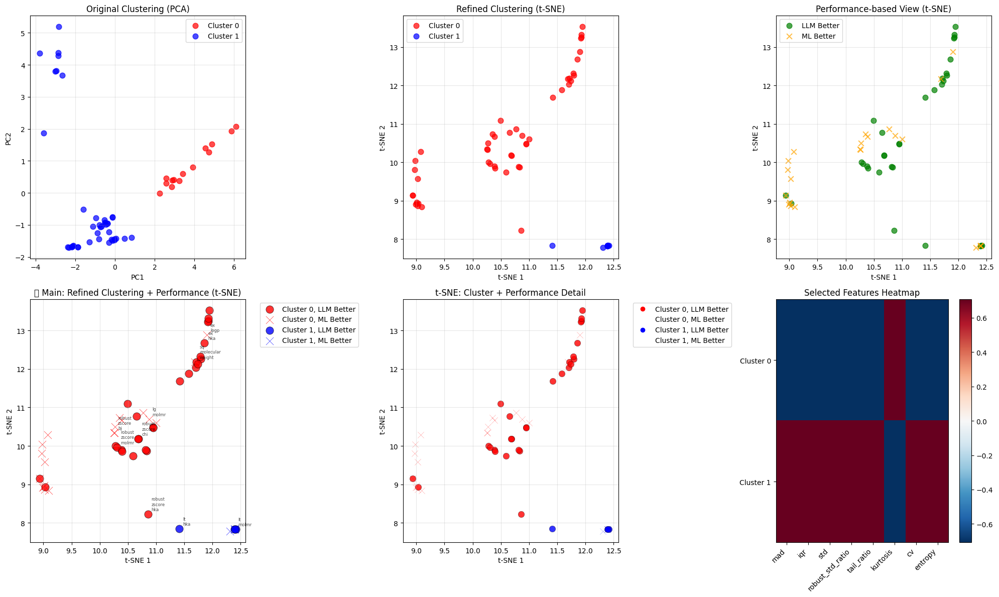


🔍 선택된 특성들의 클러스터별 분석

📊 mad:
  Cluster 0: 평균=2.8258, 표준편차=10.8606
  Cluster 1: 평균=674.4908, 표준편차=0.0000
  클러스터 간 평균 차이: 671.6650

📊 iqr:
  Cluster 0: 평균=6.0262, 표준편차=23.1037
  Cluster 1: 평균=1408.0572, 표준편차=56.2153
  클러스터 간 평균 차이: 1402.0310

📊 std:
  Cluster 0: 평균=4.3447, 표준편차=15.7112
  Cluster 1: 평균=998.3650, 표준편차=163.3493
  클러스터 간 평균 차이: 994.0202

📊 robust_std_ratio:
  Cluster 0: 평균=0.7774, 표준편차=0.4526
  Cluster 1: 평균=1.0274, 표준편차=0.1844
  클러스터 간 평균 차이: 0.2500

📊 tail_ratio:
  Cluster 0: 평균=0.4461, 표준편차=0.3408
  Cluster 1: 평균=0.4620, 표준편차=0.2186
  클러스터 간 평균 차이: 0.0160

📊 kurtosis:
  Cluster 0: 평균=76.0096, 표준편차=173.7504
  Cluster 1: 평균=1.2731, 표준편차=1.5148
  클러스터 간 평균 차이: -74.7365

📊 cv:
  Cluster 0: 평균=101.5538, 표준편차=631.5386
  Cluster 1: 평균=553.8806, 표준편차=1545.9235
  클러스터 간 평균 차이: 452.3267

📊 entropy:
  Cluster 0: 평균=2.9995, 표준편차=1.3975
  Cluster 1: 평균=3.7669, 표준편차=0.2271
  클러스터 간 평균 차이: 0.7674


In [82]:
refined_df, clustering_results = run_refined_clustering_analysis(feature_df, coef_df, top_n_features=8)

In [129]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from matplotlib.patches import Patch

# Matplotlib 기본 설정
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 10

# 이름 매핑 딕셔너리 (일관된 이름 적용을 위해 전역으로 정의)
PROPERTY_MAP = {
    'mw': r'$\mathtt{MW}$', 'logp': r'$\mathtt{logP}$', 'sp3': r'$\mathtt{sp3}$', 
    'tpsa': r'$\mathtt{TPSA}$', 'mr': r'$\mathtt{MR}$', 'chi': r'$\mathtt{Chi1v}$', 
    'hka': r'$\mathtt{HKA}$', 'bj': r'$\mathtt{BJ}$'
}

TASK_MAP = {
    'raw': 'Raw', 'robust_zscore': 'Robust Standardized', 'lt': 'Scaled Robust Standardized', 
    'sq': 'Quadratic Transformed', 'lg': 'Logarithmic Transformed', 
    'sn': 'Trigonometric Transformed', 'ex': 'Exponential Transformed'
}

def analyze_top_models_per_taskprop(consolidator, metric='Total_R2'):
    """
    각 TaskProp에서 최고 성능을 보인 상위 모델들을 분석
    (수정: ML 모델은 임베딩을 포함한 고유 이름으로 처리)
    """
    if consolidator.consolidated_df is None:
        print("❌ 먼저 create_consolidated_dataframe()를 실행하세요")
        return None
    
    df = consolidator.consolidated_df.copy()
    df = df[df[metric].notna()]
    
    # --- [변경] ML 모델의 경우 임베딩을 이름에 포함하여 고유하게 만듦 ---
    is_ml = df['model_type'] == 'ML'
    df['unique_model_name'] = df['model']
    df.loc[is_ml, 'unique_model_name'] = df.loc[is_ml, 'model'] + '_' + df.loc[is_ml, 'embedding']
    
    print(f"🎯 Top Performance Model Analysis per TaskProp (based on {metric})")
    print("="*60)
    
    best_models_per_taskprop = []
    tasks = df['task'].unique()
    properties = df['property'].unique()
    
    print(f"📊 Analysis Target: {len(tasks)} Tasks × {len(properties)} Properties")
    
    for task in tasks:
        for prop in properties:
            taskprop_data = df[(df['task'] == task) & (df['property'] == prop)]
            if taskprop_data.empty: continue
            
            if metric in ['MAE', 'Median_AE', 'Std_AE']:
                best_model_data = taskprop_data.loc[taskprop_data[metric].idxmin()]
            else:
                best_model_data = taskprop_data.loc[taskprop_data[metric].idxmax()]
            
            best_models_per_taskprop.append({
                'task': task,
                'property': prop,
                'taskprop': f"{task}_{prop}",
                'best_model': best_model_data['unique_model_name'], # 고유 이름 사용
                'base_model': best_model_data['model'],
                'best_score': best_model_data[metric],
                'model_type': best_model_data['model_type'],
                'embedding': best_model_data['embedding']
            })
    
    best_models_df = pd.DataFrame(best_models_per_taskprop)
    print(f"✅ Top performing models extracted from {len(best_models_df)} TaskProps")
    
    model_counts = best_models_df['best_model'].value_counts()
    
    print(f"\n🏆 Number of TaskProps where each model achieved top performance:")
    print("-" * 50)
    for model, count in model_counts.head(10).items():
        percentage = count / len(best_models_df) * 100
        model_type = best_models_df[best_models_df['best_model'] == model]['model_type'].iloc[0]
        print(f"{model:<35}: {count:2d} times ({percentage:5.1f}%) [{model_type}]")
    
    return best_models_df, model_counts

def create_top_models_visualization(best_models_df, model_counts, top_n=20):
    """
    Top models performance distribution visualization
    (수정: 이름, 레이블, 각도 변경)
    """
    top_models = model_counts.head(top_n)
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    # 1. 전체 모델 성능 횟수 바 차트
    ax1 = axes[0, 0]
    model_type_map = best_models_df.set_index('best_model')['model_type'].to_dict()
    colors = ['skyblue' if model_type_map[model] == 'LLM' else 'lightcoral' for model in top_models.index]
    
    bars = ax1.bar(range(len(top_models)), top_models.values, color=colors)
    ax1.set_xticks(range(len(top_models)))
    # --- [변경] 이름 생략 없이, 25도 회전 ---
    ax1.set_xticklabels(top_models.index, rotation=35, ha='right')
    ax1.set_ylabel('Number of Top Performance')
    ax1.set_title(f'Top Models by Number of Best Performances')
    ax1.grid(True, axis='y', linestyle='--', alpha=0.5)
    
    legend_elements = [Patch(facecolor='skyblue', label='LLM'), Patch(facecolor='lightcoral', label='ML')]
    ax1.legend(handles=legend_elements)
    
    for bar in bars:
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height + 0.1, f'{int(height)}', ha='center', va='bottom', fontsize=8)

    # 2. 모델 타입별 성능 분포
    ax2 = axes[0, 1]
    model_type_counts = best_models_df.groupby('model_type')['best_model'].count()
    ax2.pie(model_type_counts.values, labels=model_type_counts.index,
            colors=['skyblue', 'lightcoral'], autopct='%1.1f%%', startangle=90)
    ax2.set_title('Model Type Distribution in Top Performances')

    # 3. Task별 최고 성능 모델 분포
    ax3 = axes[1, 0]
    task_model_dist = best_models_df.groupby(['task', 'model_type']).size().unstack(fill_value=0)
    task_model_dist.plot(kind='bar', stacked=True, ax=ax3, color=['skyblue', 'lightcoral'])
    # --- [변경] Task 이름 매핑 및 각도 조절 ---
    ax3.set_xticklabels([TASK_MAP.get(t.get_text(), t.get_text()) for t in ax3.get_xticklabels()], rotation=15, ha='right')
    ax3.set_xlabel('')
    ax3.set_ylabel('Number of Top-Performing Properties')
    ax3.set_title('Top Performance Model Type Distribution by Transformation')
    ax3.legend(title='Model Type')
    ax3.grid(True, axis='y', linestyle='--', alpha=0.5)
    ax3.set_ylim(0, max(8, task_model_dist.sum(axis=1).max()))

    # 4. Property별 최고 성능 모델 분포
    ax4 = axes[1, 1]
    prop_model_dist = best_models_df.groupby(['property', 'model_type']).size().unstack(fill_value=0)
    prop_model_dist.plot(kind='bar', stacked=True, ax=ax4, color=['skyblue', 'lightcoral'])
    # --- [변경] Property 이름 매핑 및 각도 조절 ---
    ax4.set_xticklabels([PROPERTY_MAP.get(p.get_text(), p.get_text()) for p in ax4.get_xticklabels()], rotation=0)
    ax4.set_xlabel('')
    ax4.set_ylabel('Number of Top-Performing Transformations')
    ax4.set_title('Top Performance Model Type Distribution by Property')
    ax4.legend(title='Model Type')
    ax4.grid(True, axis='y', linestyle='--', alpha=0.5)
    ax4.set_ylim(0, max(7, prop_model_dist.sum(axis=1).max()))
    
    plt.tight_layout()
    plt.show()
    return fig

def analyze_specific_model_performance(best_models_df, model_name):
    """
    특정 모델의 상세 분석 (수정: 이름 매핑 적용)
    """
    model_taskprops = best_models_df[best_models_df['best_model'] == model_name]
    if model_taskprops.empty:
        print(f"❌ {model_name} did not achieve top performance in any TaskProp.")
        return
    
    print(f"\n🔍 Detailed Analysis of {model_name}'s Top Performances")
    print("="*60)
    print(f"Total {len(model_taskprops)} TaskProps with top performance")
    
    print(f"\n📊 Distribution by Task:")
    for task, count in model_taskprops['task'].value_counts().items():
        print(f"  {TASK_MAP.get(task, task):<28}: {count} TaskProps")
        
    print(f"\n📊 Distribution by Property:")
    for prop, count in model_taskprops['property'].value_counts().items():
        print(f"  {PROPERTY_MAP.get(prop, prop):<10}: {count} TaskProps")
        
    scores = model_taskprops['best_score']
    print(f"\n📈 Performance Score Statistics:")
    print(f"  Mean: {scores.mean():.4f}, Std: {scores.std():.4f}, Range: [{scores.min():.4f}, {scores.max():.4f}]")
    
    print(f"\n🏆 Top Performance TaskProp List (Score):")
    for _, row in model_taskprops.sort_values('best_score', ascending=False).iterrows():
        task_pretty = TASK_MAP.get(row['task'], row['task'])
        prop_pretty = PROPERTY_MAP.get(row['property'], row['property'])
        print(f"  - {task_pretty} {prop_pretty}: {row['best_score']:.4f}")

def create_llm_dominance_heatmap(consolidator, metric='Total_R2'):
    """
    각 Task-Property 조합별 상위 7개 모델 중 LLM의 비율(개수)을 나타내는 히트맵 생성
    """
    print("\n🔥 Creating LLM Dominance Heatmap...")
    
    if consolidator.consolidated_df is None:
        print("❌ 먼저 create_consolidated_dataframe()를 실행하세요")
        return None

    df = consolidator.consolidated_df.copy()
    df = df[df[metric].notna()]

    # ML 모델의 고유 이름 생성 (모델명_임베딩)
    is_ml = df['model_type'] == 'ML'
    df['unique_model_name'] = df['model']
    df.loc[is_ml, 'unique_model_name'] = df.loc[is_ml, 'model'] + '_' + df.loc[is_ml, 'embedding']
    
    # 각 TaskProp 내에서 고유 모델별로 중복 제거 (동일 모델+임베딩 조합은 하나만 사용)
    df = df.drop_duplicates(subset=['task', 'property', 'unique_model_name'])

    tasks = df['task'].unique()
    properties = df['property'].unique()
    
    # 결과를 저장할 빈 DataFrame 생성
    heatmap_results = pd.DataFrame(index=tasks, columns=properties, dtype=float)

    # 메트릭에 따른 정렬 순서 결정 (MAE 등은 오름차순, R2 등은 내림차순)
    ascending = True if metric in ['MAE', 'Median_AE', 'Std_AE'] else False

    # 각 칸(Task-Property)에 대해 LLM 개수 계산
    for task in tasks:
        for prop in properties:
            cell_data = df[(df['task'] == task) & (df['property'] == prop)]
            if cell_data.empty:
                heatmap_results.loc[task, prop] = np.nan
                continue

            # 성능 순으로 정렬 후 상위 7개 선택
            top_7 = cell_data.sort_values(by=metric, ascending=ascending).head(7)

            # 상위 7개 중 LLM 모델의 개수 계산
            llm_count = (top_7['model_type'] == 'LLM').sum()
            heatmap_results.loc[task, prop] = llm_count

    # 축 레이블을 보기 좋은 이름으로 변경
    heatmap_results.index = heatmap_results.index.map(TASK_MAP)
    heatmap_results.columns = heatmap_results.columns.map(PROPERTY_MAP)

    # 시각화
    plt.figure(figsize=(14, 8))
    
    # Diverging Colormap 사용: 파란색(LLM 우세) <-> 붉은색(ML 우세)
    # 중앙값(3.5)을 기준으로 색상이 나뉨
    sns.heatmap(
        heatmap_results,
        annot=True,
        fmt='.0f',        # 소수점 없이 정수로 표시
        cmap='coolwarm_r',  # 파란색-흰색-붉은색 계열의 색상 맵
        linewidths=.5,
        vmin=0,
        vmax=7,
        cbar_kws={'label': 'Number of LLM Models in Top 7'} # 컬러바 라벨
    )

    plt.title('Dominance of LLMs within Top 7 Models per Transformation & Property', fontsize=16, pad=20)
    plt.xlabel('Property', fontsize=12)
    plt.ylabel('Task', fontsize=12)
    # plt.xticks(ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

    return plt.gcf()

def run_complete_top_models_analysis(consolidator, metric='Total_R2', top_n=23):
    """
    수정된 히트맵을 포함한 전체 분석 실행
    """
    print("🚀 Top Performance Model Analysis by TaskProp")
    print("="*50)
    
    best_models_df, model_counts = analyze_top_models_per_taskprop(consolidator, metric)
    if best_models_df is None: return None, None
    
    print("\n📊 Creating main visualization...")
    create_top_models_visualization(best_models_df, model_counts, top_n)
    
    # --- [변경] 새로운 히트맵 함수 호출 ---
    try:
        create_llm_dominance_heatmap(consolidator, metric)
    except Exception as e:
        print(f"❌ Heatmap creation failed: {e}")
    
    print(f"\n🔍 Top 3 Models Detailed Analysis")
    for model in model_counts.head(3).index:
        analyze_specific_model_performance(best_models_df, model)
    
    return best_models_df, model_counts

if __name__ == "__main__":
    print("사용 방법:")
    print("# consolidator 객체에 데이터가 로드된 후 실행하세요.")
    print("best_models_df, model_counts = run_complete_top_models_analysis(consolidator)")

사용 방법:
# consolidator 객체에 데이터가 로드된 후 실행하세요.
best_models_df, model_counts = run_complete_top_models_analysis(consolidator)


In [111]:
# 위 코드, legend 순서 반영
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from matplotlib.patches import Patch

# Matplotlib 기본 설정
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 10

# 이름 매핑 딕셔너리 (일관된 이름 적용을 위해 전역으로 정의)
PROPERTY_MAP = {
    'mw': r'$\mathtt{MW}$', 'logp': r'$\mathtt{logP}$', 'sp3': r'$\mathtt{sp3}$', 
    'tpsa': r'$\mathtt{TPSA}$', 'mr': r'$\mathtt{MR}$', 'chi': r'$\mathtt{Chi1v}$', 
    'hka': r'$\mathtt{HKA}$', 'bj': r'$\mathtt{BJ}$'
}

TASK_MAP = {
    'raw': 'Raw', 'robust_zscore': 'Robust Standardized', 'lt': 'Scaled Robust Standardized', 
    'sq': 'Quadratic Transformed', 'lg': 'Logarithmic Transformed', 
    'sn': 'Trigonometric Transformed', 'ex': 'Exponential Transformed'
}

# 순서 정의
TASK_ORDER = ['raw', 'robust_zscore', 'lt', 'sq', 'lg', 'sn', 'ex']
PROPERTY_ORDER = ['mw', 'logp', 'sp3', 'tpsa', 'mr', 'chi', 'hka', 'bj']

def analyze_top_models_per_taskprop(consolidator, metric='Total_R2'):
    """
    각 TaskProp에서 최고 성능을 보인 상위 모델들을 분석
    (수정: ML 모델은 임베딩을 포함한 고유 이름으로 처리)
    """
    if consolidator.consolidated_df is None:
        print("❌ 먼저 create_consolidated_dataframe()를 실행하세요")
        return None
    
    df = consolidator.consolidated_df.copy()
    df = df[df[metric].notna()]
    
    # --- [변경] ML 모델의 경우 임베딩을 이름에 포함하여 고유하게 만듦 ---
    is_ml = df['model_type'] == 'ML'
    df['unique_model_name'] = df['model']
    df.loc[is_ml, 'unique_model_name'] = df.loc[is_ml, 'model'] + '_' + df.loc[is_ml, 'embedding']
    
    print(f"🎯 Top Performance Model Analysis per TaskProp (based on {metric})")
    print("="*60)
    
    best_models_per_taskprop = []
    tasks = df['task'].unique()
    properties = df['property'].unique()
    
    print(f"📊 Analysis Target: {len(tasks)} Tasks × {len(properties)} Properties")
    
    for task in tasks:
        for prop in properties:
            taskprop_data = df[(df['task'] == task) & (df['property'] == prop)]
            if taskprop_data.empty: continue
            
            if metric in ['MAE', 'Median_AE', 'Std_AE']:
                best_model_data = taskprop_data.loc[taskprop_data[metric].idxmin()]
            else:
                best_model_data = taskprop_data.loc[taskprop_data[metric].idxmax()]
            
            best_models_per_taskprop.append({
                'task': task,
                'property': prop,
                'taskprop': f"{task}_{prop}",
                'best_model': best_model_data['unique_model_name'], # 고유 이름 사용
                'base_model': best_model_data['model'],
                'best_score': best_model_data[metric],
                'model_type': best_model_data['model_type'],
                'embedding': best_model_data['embedding']
            })
    
    best_models_df = pd.DataFrame(best_models_per_taskprop)
    print(f"✅ Top performing models extracted from {len(best_models_df)} TaskProps")
    
    model_counts = best_models_df['best_model'].value_counts()
    
    print(f"\n🏆 Number of TaskProps where each model achieved top performance:")
    print("-" * 50)
    for model, count in model_counts.head(10).items():
        percentage = count / len(best_models_df) * 100
        model_type = best_models_df[best_models_df['best_model'] == model]['model_type'].iloc[0]
        print(f"{model:<35}: {count:2d} times ({percentage:5.1f}%) [{model_type}]")
    
    return best_models_df, model_counts

def create_top_models_visualization(best_models_df, model_counts, top_n=20):
    """
    Top models performance distribution visualization
    (수정: 이름, 레이블, 각도 변경 및 순서 지정)
    """
    top_models = model_counts.head(top_n)
    fig, axes = plt.subplots(2, 2, figsize=(16, 12), dpi = 1200)
    
    # 1. 전체 모델 성능 횟수 바 차트
    ax1 = axes[0, 0]
    model_type_map = best_models_df.set_index('best_model')['model_type'].to_dict()
    colors = ['skyblue' if model_type_map[model] == 'LLM' else 'lightcoral' for model in top_models.index]
    
    bars = ax1.bar(range(len(top_models)), top_models.values, color=colors)
    ax1.set_xticks(range(len(top_models)))
    # --- [변경] 이름 생략 없이, 25도 회전 ---
    ax1.set_xticklabels(top_models.index, rotation=35, ha='right')
    ax1.set_ylabel('Number of Top Performance')
    ax1.set_title(f'Top Models by Number of Best Performances')
    ax1.grid(True, axis='y', linestyle='--', alpha=0.5)
    
    legend_elements = [Patch(facecolor='skyblue', label='LLM'), Patch(facecolor='lightcoral', label='ML')]
    ax1.legend(handles=legend_elements)
    
    for bar in bars:
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height + 0.1, f'{int(height)}', ha='center', va='bottom', fontsize=8)

    # 2. 모델 타입별 성능 분포
    ax2 = axes[0, 1]
    model_type_counts = best_models_df.groupby('model_type')['best_model'].count()
    ax2.pie(model_type_counts.values, labels=model_type_counts.index,
            colors=['skyblue', 'lightcoral'], autopct='%1.1f%%', startangle=90)
    ax2.set_title('Model Type Distribution in Top Performances')

    # 3. Task별 최고 성능 모델 분포 (순서 지정)
    ax3 = axes[1, 0]
    task_model_dist = best_models_df.groupby(['task', 'model_type']).size().unstack(fill_value=0)
    
    # Task 순서대로 재인덱싱
    existing_tasks = [t for t in TASK_ORDER if t in task_model_dist.index]
    task_model_dist = task_model_dist.reindex(existing_tasks)
    
    task_model_dist.plot(kind='bar', stacked=True, ax=ax3, color=['skyblue', 'lightcoral'])
    # Task 이름 매핑
    ax3.set_xticklabels([TASK_MAP.get(t, t) for t in existing_tasks], rotation=15, ha='right')
    ax3.set_xlabel('')
    ax3.set_ylabel('Number of Top-Performing Properties')
    ax3.set_title('Top Performance Model Type Distribution by Transformation')
    ax3.legend(title='Model Type')
    ax3.grid(True, axis='y', linestyle='--', alpha=0.5)
    ax3.set_ylim(0, max(8, task_model_dist.sum(axis=1).max()))

    # 4. Property별 최고 성능 모델 분포 (순서 지정)
    ax4 = axes[1, 1]
    prop_model_dist = best_models_df.groupby(['property', 'model_type']).size().unstack(fill_value=0)
    
    # Property 순서대로 재인덱싱
    existing_props = [p for p in PROPERTY_ORDER if p in prop_model_dist.index]
    prop_model_dist = prop_model_dist.reindex(existing_props)
    
    prop_model_dist.plot(kind='bar', stacked=True, ax=ax4, color=['skyblue', 'lightcoral'])
    # Property 이름 매핑
    ax4.set_xticklabels([PROPERTY_MAP.get(p, p) for p in existing_props], rotation=0)
    ax4.set_xlabel('')
    ax4.set_ylabel('Number of Top-Performing Transformations')
    ax4.set_title('Top Performance Model Type Distribution by Property')
    ax4.legend(title='Model Type')
    ax4.grid(True, axis='y', linestyle='--', alpha=0.5)
    ax4.set_ylim(0, max(7, prop_model_dist.sum(axis=1).max()))
    
    plt.tight_layout()
    plt.show()
    return fig

def analyze_specific_model_performance(best_models_df, model_name):
    """
    특정 모델의 상세 분석 (수정: 이름 매핑 적용)
    """
    model_taskprops = best_models_df[best_models_df['best_model'] == model_name]
    if model_taskprops.empty:
        print(f"❌ {model_name} did not achieve top performance in any TaskProp.")
        return
    
    print(f"\n🔍 Detailed Analysis of {model_name}'s Top Performances")
    print("="*60)
    print(f"Total {len(model_taskprops)} TaskProps with top performance")
    
    print(f"\n📊 Distribution by Task:")
    for task, count in model_taskprops['task'].value_counts().items():
        print(f"  {TASK_MAP.get(task, task):<28}: {count} TaskProps")
        
    print(f"\n📊 Distribution by Property:")
    for prop, count in model_taskprops['property'].value_counts().items():
        print(f"  {PROPERTY_MAP.get(prop, prop):<10}: {count} TaskProps")
        
    scores = model_taskprops['best_score']
    print(f"\n📈 Performance Score Statistics:")
    print(f"  Mean: {scores.mean():.4f}, Std: {scores.std():.4f}, Range: [{scores.min():.4f}, {scores.max():.4f}]")
    
    print(f"\n🏆 Top Performance TaskProp List (Score):")
    for _, row in model_taskprops.sort_values('best_score', ascending=False).iterrows():
        task_pretty = TASK_MAP.get(row['task'], row['task'])
        prop_pretty = PROPERTY_MAP.get(row['property'], row['property'])
        print(f"  - {task_pretty} {prop_pretty}: {row['best_score']:.4f}")

def create_llm_dominance_heatmap(consolidator, metric='Total_R2'):
    """
    각 Task-Property 조합별 상위 7개 모델 중 LLM의 비율(개수)을 나타내는 히트맵 생성
    (수정: 순서 지정)
    """
    print("\n🔥 Creating LLM Dominance Heatmap...")
    
    if consolidator.consolidated_df is None:
        print("❌ 먼저 create_consolidated_dataframe()를 실행하세요")
        return None

    df = consolidator.consolidated_df.copy()
    df = df[df[metric].notna()]

    # ML 모델의 고유 이름 생성 (모델명_임베딩)
    is_ml = df['model_type'] == 'ML'
    df['unique_model_name'] = df['model']
    df.loc[is_ml, 'unique_model_name'] = df.loc[is_ml, 'model'] + '_' + df.loc[is_ml, 'embedding']
    
    # 각 TaskProp 내에서 고유 모델별로 중복 제거 (동일 모델+임베딩 조합은 하나만 사용)
    df = df.drop_duplicates(subset=['task', 'property', 'unique_model_name'])

    tasks = df['task'].unique()
    properties = df['property'].unique()
    
    # 결과를 저장할 빈 DataFrame 생성
    heatmap_results = pd.DataFrame(index=tasks, columns=properties, dtype=float)

    # 메트릭에 따른 정렬 순서 결정 (MAE 등은 오름차순, R2 등은 내림차순)
    ascending = True if metric in ['MAE', 'Median_AE', 'Std_AE'] else False

    # 각 칸(Task-Property)에 대해 LLM 개수 계산
    for task in tasks:
        for prop in properties:
            cell_data = df[(df['task'] == task) & (df['property'] == prop)]
            if cell_data.empty:
                heatmap_results.loc[task, prop] = np.nan
                continue

            # 성능 순으로 정렬 후 상위 7개 선택
            top_7 = cell_data.sort_values(by=metric, ascending=ascending).head(7)

            # 상위 7개 중 LLM 모델의 개수 계산
            llm_count = (top_7['model_type'] == 'LLM').sum()
            heatmap_results.loc[task, prop] = llm_count

    # Task와 Property 순서대로 재인덱싱
    existing_tasks = [t for t in TASK_ORDER if t in heatmap_results.index]
    existing_props = [p for p in PROPERTY_ORDER if p in heatmap_results.columns]
    heatmap_results = heatmap_results.reindex(index=existing_tasks, columns=existing_props)
    
    # 축 레이블을 보기 좋은 이름으로 변경
    heatmap_results.index = heatmap_results.index.map(TASK_MAP)
    heatmap_results.columns = heatmap_results.columns.map(PROPERTY_MAP)

    # 시각화
    plt.figure(figsize=(14, 8), dpi = 1200)
    
    # Diverging Colormap 사용: 파란색(LLM 우세) <-> 붉은색(ML 우세)
    # 중앙값(3.5)을 기준으로 색상이 나뉨
    ax = sns.heatmap(
        heatmap_results,
        annot=True,
        fmt='.0f',        # 소수점 없이 정수로 표시
        cmap='coolwarm_r',  # 파란색-흰색-붉은색 계열의 색상 맵
        linewidths=.5,
        vmin=0,
        vmax=7,
        cbar_kws={'label': 'Number of LLM Models in Top 7'}, # 컬러바 라벨
        annot_kws={'fontsize': 14},  # 히트맵 내부 숫자 크기
    )

    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=14)  # 컬러바 숫자 크기
    cbar.set_label('Number of LLM Models in Top 7', fontsize=14)  # 컬러바 라벨 크기

    plt.title('Dominance of LLMs within Top 7 Models per Transformation & Property', fontsize=16, pad=20)
    plt.xlabel('Property', fontsize=14)
    plt.ylabel('Task', fontsize=14)
    # plt.xticks(ha='right')
    plt.yticks(rotation=-45, ha = 'right', va = 'bottom')
    plt.tight_layout()
    plt.show()

    return plt.gcf()

def run_complete_top_models_analysis(consolidator, metric='Total_R2', top_n=23):
    """
    수정된 히트맵을 포함한 전체 분석 실행
    """
    print("🚀 Top Performance Model Analysis by TaskProp")
    print("="*50)
    
    best_models_df, model_counts = analyze_top_models_per_taskprop(consolidator, metric)
    if best_models_df is None: return None, None
    
    print("\n📊 Creating main visualization...")
    create_top_models_visualization(best_models_df, model_counts, top_n)
    
    # --- [변경] 새로운 히트맵 함수 호출 ---
    try:
        create_llm_dominance_heatmap(consolidator, metric)
    except Exception as e:
        print(f"❌ Heatmap creation failed: {e}")
    
    print(f"\n🔍 Top 3 Models Detailed Analysis")
    for model in model_counts.head(3).index:
        analyze_specific_model_performance(best_models_df, model)
    
    return best_models_df, model_counts

if __name__ == "__main__":
    print("사용 방법:")
    print("# consolidator 객체에 데이터가 로드된 후 실행하세요.")
    print("best_models_df, model_counts = run_complete_top_models_analysis(consolidator)")

사용 방법:
# consolidator 객체에 데이터가 로드된 후 실행하세요.
best_models_df, model_counts = run_complete_top_models_analysis(consolidator)


In [112]:
best_models_df, model_counts = run_complete_top_models_analysis(consolidator)

🚀 Top Performance Model Analysis by TaskProp
🎯 Top Performance Model Analysis per TaskProp (based on Total_R2)
📊 Analysis Target: 7 Tasks × 8 Properties
✅ Top performing models extracted from 56 TaskProps

🏆 Number of TaskProps where each model achieved top performance:
--------------------------------------------------
claude-3-5-sonnet-20241022         :  9 times ( 16.1%) [LLM]
gemini-2.5-flash                   :  8 times ( 14.3%) [LLM]
gpt-4o-2024-08-06                  :  5 times (  8.9%) [LLM]
gpt-oss-120b                       :  3 times (  5.4%) [LLM]
ElasticNet_ecfp                    :  3 times (  5.4%) [ML]
RandomForest_ecfp                  :  3 times (  5.4%) [ML]
AdaBoost_ecfp                      :  2 times (  3.6%) [ML]
ElasticNet_chemberta               :  2 times (  3.6%) [ML]
MLP_5_rdkit                        :  2 times (  3.6%) [ML]
deepseek-chat                      :  2 times (  3.6%) [LLM]

📊 Creating main visualization...



🔥 Creating LLM Dominance Heatmap...



🔍 Top 3 Models Detailed Analysis

🔍 Detailed Analysis of claude-3-5-sonnet-20241022's Top Performances
Total 9 TaskProps with top performance

📊 Distribution by Task:
  Raw                         : 3 TaskProps
  Robust Standardized         : 3 TaskProps
  Scaled Robust Standardized  : 2 TaskProps
  Exponential Transformed     : 1 TaskProps

📊 Distribution by Property:
  $\mathtt{MW}$: 2 TaskProps
  $\mathtt{MR}$: 2 TaskProps
  $\mathtt{logP}$: 2 TaskProps
  $\mathtt{HKA}$: 2 TaskProps
  $\mathtt{Chi1v}$: 1 TaskProps

📈 Performance Score Statistics:
  Mean: 0.7679, Std: 0.1632, Range: [0.4042, 0.9851]

🏆 Top Performance TaskProp List (Score):
  - Raw $\mathtt{MW}$: 0.9851
  - Raw $\mathtt{MR}$: 0.9015
  - Raw $\mathtt{Chi1v}$: 0.8797
  - Robust Standardized $\mathtt{logP}$: 0.7719
  - Robust Standardized $\mathtt{HKA}$: 0.7643
  - Scaled Robust Standardized $\mathtt{HKA}$: 0.7375
  - Scaled Robust Standardized $\mathtt{logP}$: 0.7366
  - Robust Standardized $\mathtt{MW}$: 0.7302
  - E

<Figure size 640x480 with 0 Axes>

In [206]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil
from matplotlib.patches import Patch

# 이름 매핑 딕셔너리 (전역 또는 main 함수 내에 정의)
PROPERTY_MAP = {
    'mw': r'$\mathtt{MW}$', 
    'logp': r'$\mathtt{logP}$', 
    'sp3': r'$\mathtt{sp3}$', 
    'tpsa': r'$\mathtt{TPSA}$', 
    'mr': r'$\mathtt{MR}$', 
    'chi': r'$\mathtt{Chi1v}$', 
    'hka': r'$\mathtt{HKA}$', 
    'bj': r'$\mathtt{BJ}$'
}

TASK_MAP = {
    'raw': 'Raw', 
    'robust_zscore': 'Robust Standardized', 
    'lt': 'Scaled Robust Standardized', 
    'sq': 'Quadratic Transformed', 
    'lg': 'Logarithmic Transformed', 
    'sn': 'Trigonometric Transformed', 
    'ex': 'Exponential Transformed'
}

def is_baseline_model(model_name):
    """모델 이름을 보고 Baseline 모델인지 판단"""
    model_lower = model_name.lower()
    return 'baseline' in model_lower

def analyze_individual_taskprop_performance(consolidator, metric='Total_R2', top_n_models=10):
    """
    각 TaskProp별 개별 성능 분석 및 시각화
    LLM의 경우 embedding을 무시하고 하나의 결과만 사용
    Baseline 모델들도 embedding을 무시하고 하나의 결과만 사용
    
    Args:
        consolidator: PickleDataConsolidator 객체
        metric: 평가할 성능 지표
        top_n_models: 각 TaskProp에서 보여줄 상위 모델 수
    
    Returns:
        분석 결과들
    """
    
    if consolidator.consolidated_df is None:
        print("❌ Please run create_consolidated_dataframe() first")
        return None
    
    df = consolidator.consolidated_df.copy()
    df = df[df[metric].notna()]
    
    print(f"🎯 Individual TaskProp Performance Analysis (based on {metric})")
    print("="*60)
    
    # 모든 TaskProp 조합 수집
    taskprop_combinations = []
    tasks = df['task'].unique()
    properties = df['property'].unique()
    
    for task in tasks:
        for prop in properties:
            taskprop_data = df[(df['task'] == task) & (df['property'] == prop)]
            if not taskprop_data.empty:
                taskprop_combinations.append((task, prop, f"{task}_{prop}"))
    
    print(f"📊 Total TaskProp combinations to analyze: {len(taskprop_combinations)}")
    
    # 각 TaskProp별 성능 데이터 수집
    taskprop_results = {}
    
    for task, prop, taskprop_name in taskprop_combinations:
        taskprop_data = df[(df['task'] == task) & (df['property'] == prop)]
        
        # LLM 데이터 처리: embedding별 중복 제거 (첫 번째 embedding 결과만 사용)
        llm_data = taskprop_data[taskprop_data['model_type'] == 'LLM']
        
        # Baseline 데이터 처리: 모델 이름으로 찾아서 embedding별 중복 제거
        baseline_mask = taskprop_data['model'].apply(is_baseline_model)
        baseline_data = taskprop_data[baseline_mask]
        
        # ML 데이터 처리: LLM도 아니고 Baseline도 아닌 것들
        ml_data = taskprop_data[~((taskprop_data['model_type'] == 'LLM') | baseline_mask)]
        
        processed_data_list = []
        
        # LLM은 모델별로 첫 번째 embedding 결과만 유지
        if not llm_data.empty:
            llm_deduplicated = llm_data.groupby('model').first().reset_index()
            processed_data_list.append(llm_deduplicated)
        
        # Baseline도 모델별로 첫 번째 embedding 결과만 유지 (embedding 영향 없음)
        if not baseline_data.empty:
            baseline_deduplicated = baseline_data.groupby('model').first().reset_index()
            # model_type 컬럼을 Baseline으로 설정
            baseline_deduplicated['model_type'] = 'Baseline'
            processed_data_list.append(baseline_deduplicated)
        
        # ML 데이터는 embedding별로 다르므로 모두 유지
        # 하지만 동일한 구조를 위해 embedding 정보를 모델명에 포함
        if not ml_data.empty:
            ml_data_with_embedding = ml_data.copy()
            ml_data_with_embedding['model'] = ml_data_with_embedding['model'] + '_' + ml_data_with_embedding['embedding']
            # model_type이 없다면 ML로 설정
            if 'model_type' not in ml_data_with_embedding.columns:
                ml_data_with_embedding['model_type'] = 'ML'
            processed_data_list.append(ml_data_with_embedding)
        
        # 결합
        if processed_data_list:
            combined_data = pd.concat(processed_data_list, ignore_index=True)
        else:
            combined_data = pd.DataFrame()
        
        # 성능 기준 정렬 (R2는 높을수록, MAE는 낮을수록 좋음)
        if not combined_data.empty:
            if metric in ['MAE', 'Median_AE', 'Std_AE']:
                sorted_data = combined_data.sort_values(metric, ascending=True)
            else:
                sorted_data = combined_data.sort_values(metric, ascending=False)
            
            # 상위 N개 모델만 저장
            top_models = sorted_data.head(top_n_models)
        else:
            top_models = pd.DataFrame()
        
        taskprop_results[taskprop_name] = {
            'task': task,
            'property': prop,
            'data': top_models,
            'best_score': top_models.iloc[0][metric] if not top_models.empty else None,
            'best_model': top_models.iloc[0]['model'] if not top_models.empty else None
        }
    
    print(f"✅ Analysis completed. LLM and Baseline models deduplicated (embedding ignored)")
    return taskprop_results

def create_individual_taskprop_plots(taskprop_results, metric='Total_R2', plots_per_page=8):
    """
    각 TaskProp별 개별 성능 그래프 생성
    """
    
    taskprop_names = list(taskprop_results.keys())
    total_plots = len(taskprop_names)
    total_pages = ceil(total_plots / plots_per_page)
    
    print(f"📊 Creating {total_plots} individual TaskProp plots across {total_pages} pages")
    
    figures = []
    
    for page in range(total_pages):
        start_idx = page * plots_per_page
        end_idx = min((page + 1) * plots_per_page, total_plots)
        page_taskprops = taskprop_names[start_idx:end_idx]
        
        # --- [변경] 서브플롯 배치 고정 (2x4) ---
        rows, cols = 2, 4
        
        plt.figure(dpi = 1200)
        plt.rcParams['font.family'] = 'Arial'
        fig, axes = plt.subplots(rows, cols, figsize=(20, 8))
        axes = axes.flatten()
        
        for i, taskprop_name in enumerate(page_taskprops):
            ax = axes[i]
            result = taskprop_results[taskprop_name]
            data = result['data']
            
            # --- [변경] 제목에 매핑된 이름 사용 ---
            task_pretty = TASK_MAP.get(result['task'], result['task'])
            prop_pretty = PROPERTY_MAP.get(result['property'], result['property'])
            plot_title = f"{task_pretty} {prop_pretty}"

            if data.empty:
                ax.text(0.5, 0.5, 'No Data', transform=ax.transAxes, 
                       ha='center', va='center', fontsize=12)
                ax.set_title(f'{plot_title}\n(No Data)', fontsize=11)
                continue
            
            # 모델 타입별 색상
            color_map = {'LLM': 'skyblue', 'ML': 'lightcoral', 'Baseline': 'lightgreen'}
            colors = [color_map.get(mt, 'gray') for mt in data['model_type']]
            
            # 바 차트 생성
            bars = ax.bar(range(len(data)), data[metric], color=colors)
            
            # --- [변경] X축 라벨 전체 표시 및 각도 조절 ---
            model_labels = data['model']
            ax.set_xticks(range(len(data)))
            ax.set_xticklabels(model_labels, rotation=25, ha='right', fontsize=8)
            
            # 제목과 라벨
            best_model = result['best_model']
            ax.set_title(plot_title, fontsize=11) # 부제목 제거하고 메인 제목만
            # ax.set_ylabel(metric, fontsize=9)
            ax.set_ylabel(r'$R^2$', fontsize=9)
            
            # 격자
            ax.grid(True, axis='y', linestyle='--', alpha=0.5)
            
            # 값 표시 (상위 3개만)
            for j, bar in enumerate(bars[:]):
                height = bar.get_height()
                ax.text(bar.get_x() + bar.get_width()/2., height,
                       f'{height:.3f}', ha='center', va='bottom', fontsize=7)
        
        # 빈 서브플롯 숨기기
        for i in range(len(page_taskprops), len(axes)):
            axes[i].set_visible(False)
        
        # 전체 제목
        # fig.suptitle(f'Individual Task & Property Performance Analysis - Page {page+1}/{total_pages}', fontsize=16, y=0.99)
        fig.suptitle(f'Model Performance for {task_pretty} Properties', fontsize=16, y=0.99)
        
        # 범례 추가
        legend_elements = [Patch(facecolor='skyblue', label='LLM'),
                          Patch(facecolor='lightcoral', label='ML'),
                          Patch(facecolor='lightgreen', label='Baseline')]
        fig.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1, 1.05))
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.92) # suptitle과의 간격 조절
        plt.show()
        
        figures.append(fig)
    
    return figures

def create_taskprop_summary_analysis(taskprop_results):
    """
    TaskProp 분석 결과 요약 (변경된 이름 사용)
    """
    print("\n📈 TaskProp Performance Summary")
    print("="*60)
    
    # 최고 성능 모델 타입 분석
    model_type_wins = {'LLM': 0, 'ML': 0, 'Baseline': 0}
    
    for result in taskprop_results.values():
        if result['data'].empty: continue
        best_model_type = result['data'].iloc[0]['model_type']
        if best_model_type in model_type_wins:
            model_type_wins[best_model_type] += 1
    
    total_valid = sum(model_type_wins.values())
    if total_valid > 0:
        print(f"🏆 Overall Best Performance Distribution:")
        for model_type, wins in model_type_wins.items():
            print(f"  {model_type} wins: {wins}/{total_valid} ({wins/total_valid*100:.1f}%)")
    
    # Task별 분석
    print(f"\n📊 Performance by Task:")
    task_analysis = {task: {'LLM': 0, 'ML': 0, 'Baseline': 0} for task in TASK_MAP.keys()}
    for result in taskprop_results.values():
        if result['data'].empty: continue
        task = result['task']
        best_model_type = result['data'].iloc[0]['model_type']
        if task in task_analysis and best_model_type in task_analysis[task]:
            task_analysis[task][best_model_type] += 1
    
    for task, counts in task_analysis.items():
        total = sum(counts.values())
        llm_pct = counts['LLM'] / total * 100 if total > 0 else 0
        task_pretty = TASK_MAP.get(task, task)
        print(f"  - {task_pretty:<28}: LLM {counts['LLM']}/{total} ({llm_pct:.1f}%), "
              f"ML {counts['ML']}/{total}, Baseline {counts['Baseline']}/{total}")
    
    # Property별 분석
    print(f"\n📊 Performance by Property:")
    prop_analysis = {prop: {'LLM': 0, 'ML': 0, 'Baseline': 0} for prop in PROPERTY_MAP.keys()}
    for result in taskprop_results.values():
        if result['data'].empty: continue
        prop = result['property']
        best_model_type = result['data'].iloc[0]['model_type']
        if prop in prop_analysis and best_model_type in prop_analysis[prop]:
            prop_analysis[prop][best_model_type] += 1
    
    for prop, counts in prop_analysis.items():
        total = sum(counts.values())
        llm_pct = counts['LLM'] / total * 100 if total > 0 else 0
        prop_pretty = PROPERTY_MAP.get(prop, prop)
        print(f"  - {prop_pretty:<10}: LLM {counts['LLM']}/{total} ({llm_pct:.1f}%), "
              f"ML {counts['ML']}/{total}, Baseline {counts['Baseline']}/{total}")

def find_most_interesting_taskprops(taskprop_results, top_n=5):
    """
    가장 흥미로운 TaskProp들 찾기 (성능 차이가 큰 것들, 변경된 이름 사용)
    """
    print(f"\n🔍 Most Interesting TaskProps (Top {top_n})")
    print("="*60)
    
    interesting_taskprops = []
    
    for taskprop_name, result in taskprop_results.items():
        data = result['data']
        if len(data) < 2: continue
        
        best_score = data.iloc[0]['Total_R2']
        second_score = data.iloc[1]['Total_R2']
        score_diff = abs(best_score - second_score)
        
        interesting_taskprops.append({
            'task': result['task'], 'property': result['property'],
            'score_diff': score_diff, 'best_score': best_score,
            'best_model': data.iloc[0]['model'],
            'best_model_type': data.iloc[0]['model_type'],
            'second_score': second_score, 'second_model': data.iloc[1]['model']
        })
    
    interesting_taskprops.sort(key=lambda x: x['score_diff'], reverse=True)
    
    print("TaskProps with largest performance gaps (R2):")
    for i, item in enumerate(interesting_taskprops[:top_n], 1):
        task_pretty = TASK_MAP.get(item['task'], item['task'])
        prop_pretty = PROPERTY_MAP.get(item['property'], item['property'])
        
        print(f"{i:2d}. {task_pretty} {prop_pretty}")
        print(f"    Best: {item['best_model']} ({item['best_model_type']}) - {item['best_score']:.4f}")
        print(f"    2nd:  {item['second_model']} - {item['second_score']:.4f}")
        print(f"    Gap:  {item['score_diff']:.4f}\n")
    
    return interesting_taskprops

def run_complete_individual_analysis(consolidator, metric='Total_R2', top_n_models=10):
    """
    전체 개별 TaskProp 분석 실행 (페이지당 플롯 수 고정)
    """
    print("🚀 Individual TaskProp Performance Analysis")
    print("="*60)
    
    # 1. 데이터 분석
    taskprop_results = analyze_individual_taskprop_performance(consolidator, metric, top_n_models)
    
    if taskprop_results is None:
        return None
    
    # 2. 개별 그래프 생성 (plots_per_page=8로 고정)
    figures = create_individual_taskprop_plots(taskprop_results, metric, plots_per_page=8)
    
    # 3. 요약 분석
    create_taskprop_summary_analysis(taskprop_results)
    
    # 4. 흥미로운 TaskProp 찾기
    interesting_taskprops = find_most_interesting_taskprops(taskprop_results)
    
    return taskprop_results, figures, interesting_taskprops

if __name__ == "__main__":
    # 이 스크립트를 직접 실행하는 것이 아니라,
    # PickleDataConsolidator 객체(consolidator)를 생성하고 로드한 후
    # 아래 함수를 호출하여 사용합니다.
    
    # --- 사용 예시 ---
    # 1. 이전 코드에서 consolidator 객체 생성 및 데이터 로드
    # from your_previous_file import PickleDataConsolidator
    # consolidator = PickleDataConsolidator()
    # consolidator.load_all_pickle_files()
    # consolidator.create_consolidated_dataframe()
    
    # 2. 이 파일의 분석 함수 실행
    # if consolidator.consolidated_df is not None:
    #     results, figs, interesting = run_complete_individual_analysis(consolidator)
    
    print("Usage: (After loading data into a consolidator object)")
    print("taskprop_results, figures, interesting = run_complete_individual_analysis(consolidator)")

Usage: (After loading data into a consolidator object)
taskprop_results, figures, interesting = run_complete_individual_analysis(consolidator)


🚀 Individual TaskProp Performance Analysis
🎯 Individual TaskProp Performance Analysis (based on Total_R2)
📊 Total TaskProp combinations to analyze: 56
✅ Analysis completed. LLM and Baseline models deduplicated (embedding ignored)
📊 Creating 56 individual TaskProp plots across 7 pages


<Figure size 7680x5760 with 0 Axes>

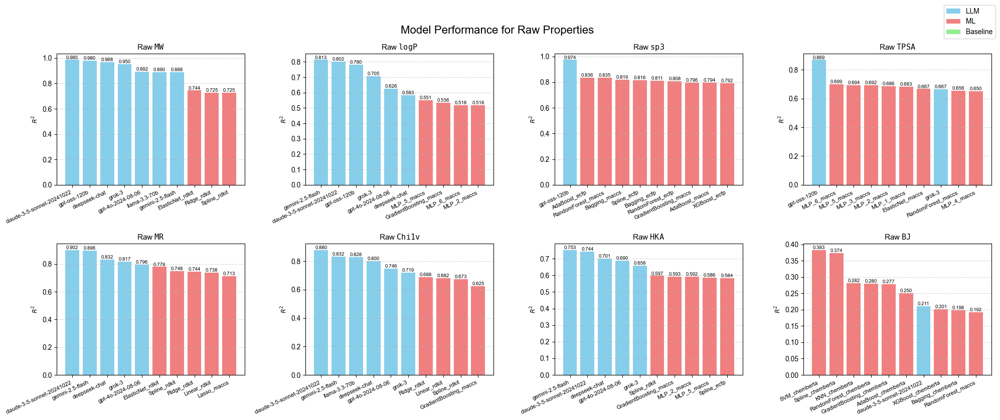

<Figure size 7680x5760 with 0 Axes>

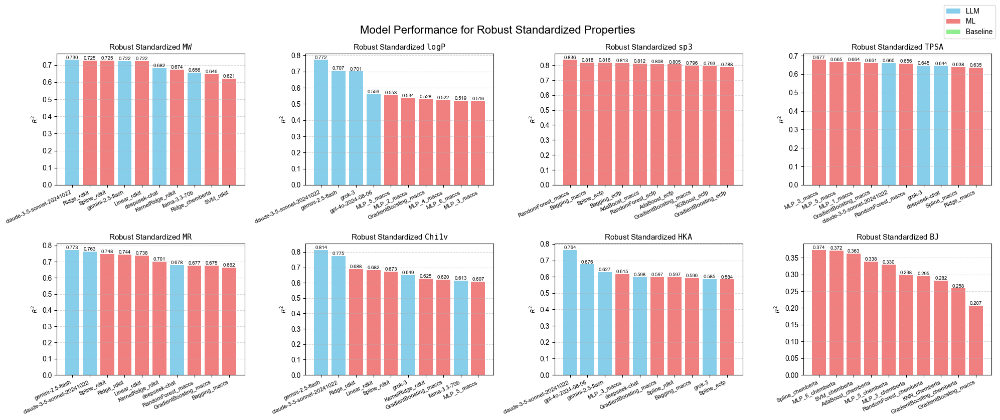

<Figure size 7680x5760 with 0 Axes>

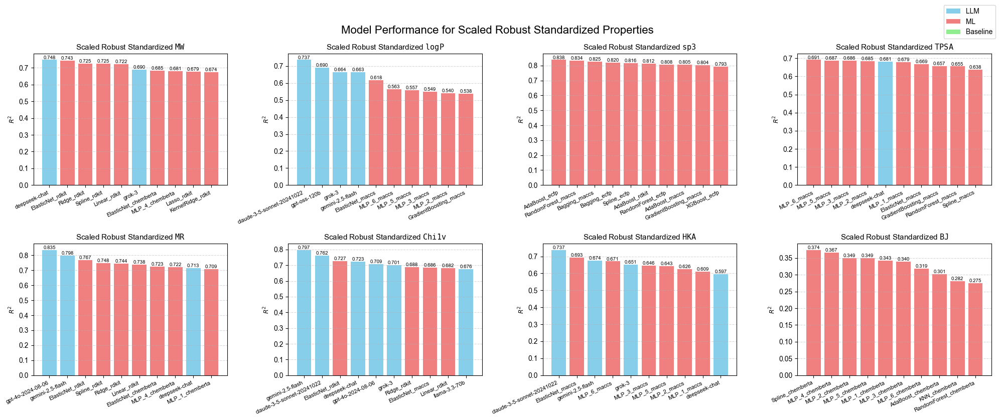

<Figure size 7680x5760 with 0 Axes>

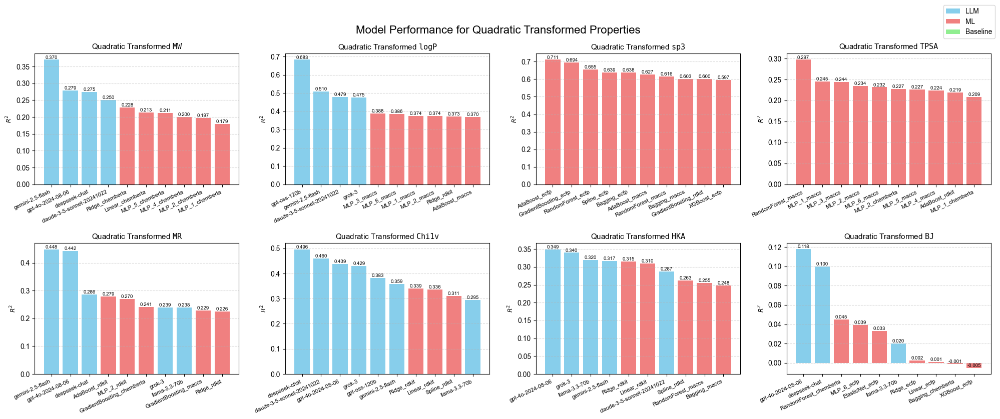

<Figure size 7680x5760 with 0 Axes>

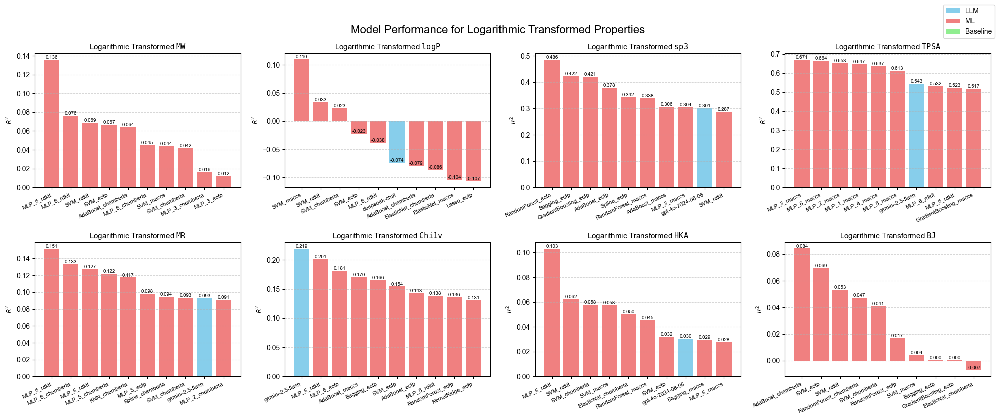

<Figure size 7680x5760 with 0 Axes>

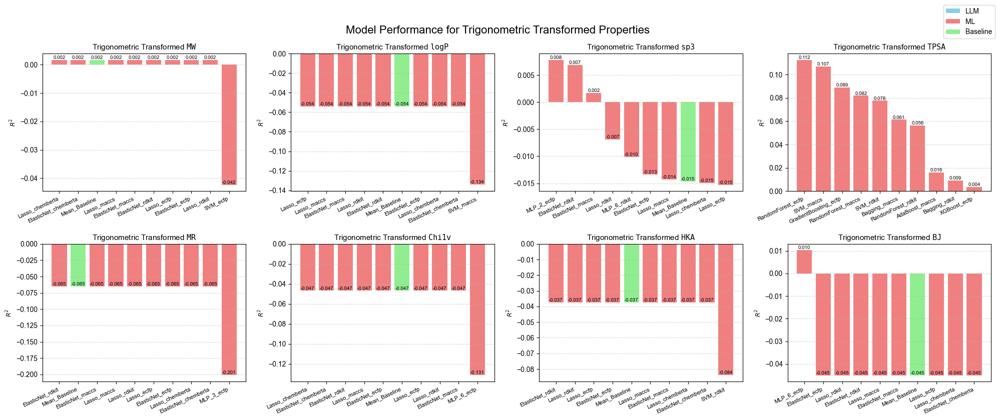

<Figure size 7680x5760 with 0 Axes>

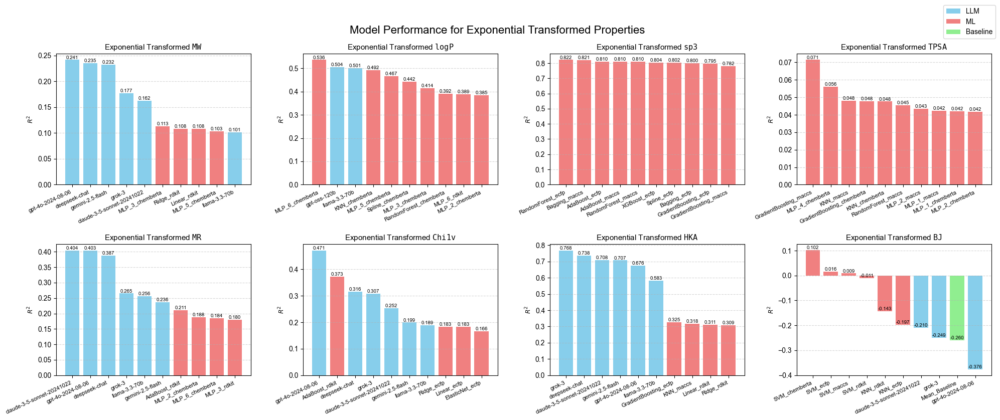


📈 TaskProp Performance Summary
🏆 Overall Best Performance Distribution:
  LLM wins: 28/56 (50.0%)
  ML wins: 28/56 (50.0%)
  Baseline wins: 0/56 (0.0%)

📊 Performance by Task:
  - Raw                         : LLM 7/8 (87.5%), ML 1/8, Baseline 0/8
  - Robust Standardized         : LLM 5/8 (62.5%), ML 3/8, Baseline 0/8
  - Scaled Robust Standardized  : LLM 5/8 (62.5%), ML 3/8, Baseline 0/8
  - Quadratic Transformed       : LLM 6/8 (75.0%), ML 2/8, Baseline 0/8
  - Logarithmic Transformed     : LLM 1/8 (12.5%), ML 7/8, Baseline 0/8
  - Trigonometric Transformed   : LLM 0/8 (0.0%), ML 8/8, Baseline 0/8
  - Exponential Transformed     : LLM 4/8 (50.0%), ML 4/8, Baseline 0/8

📊 Performance by Property:
  - $\mathtt{MW}$: LLM 5/7 (71.4%), ML 2/7, Baseline 0/7
  - $\mathtt{logP}$: LLM 4/7 (57.1%), ML 3/7, Baseline 0/7
  - $\mathtt{sp3}$: LLM 1/7 (14.3%), ML 6/7, Baseline 0/7
  - $\mathtt{TPSA}$: LLM 1/7 (14.3%), ML 6/7, Baseline 0/7
  - $\mathtt{MR}$: LLM 5/7 (71.4%), ML 2/7, Baseline 0/7
  

In [207]:
taskprop_results, figures, interesting = run_complete_individual_analysis(consolidator)

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# (이전 코드에 있던 이름 매핑 딕셔너리를 그대로 사용합니다)
PROPERTY_MAP = {
    'mw': r'$\mathtt{MW}$', 'logp': r'$\mathtt{logP}$', 'sp3': r'$\mathtt{sp3}$', 
    'tpsa': r'$\mathtt{TPSA}$', 'mr': r'$\mathtt{MR}$', 'chi': r'$\mathtt{Chi1v}$', 
    'hka': r'$\mathtt{HKA}$', 'bj': r'$\mathtt{BJ}$'
}

TASK_MAP = {
    'raw': 'Raw', 'robust_zscore': 'Robust Standardized', 'lt': 'Scaled Robust Standardized', 
    'sq': 'Quadratic Transformed', 'lg': 'Logarithmic Transformed', 
    'sn': 'Trigonometric Transformed', 'ex': 'Exponential Transformed'
}

def analyze_mae_ratio_per_taskprop(consolidator):
    """
    각 Task-Property 조합별로 상위 7개 모델의 MAE 비율을 계산합니다.
    MAE Ratio = MAE_LLM_avg / MAE_ML_avg
    """
    print("📊 Analyzing MAE Ratio (Top 7 LLM Avg / Top 7 ML Avg)...")
    
    if consolidator.consolidated_df is None:
        print("❌ 먼저 create_consolidated_dataframe()를 실행하세요.")
        return None

    df = consolidator.consolidated_df.copy()
    df = df[df['MAE'].notna()]

    # ML 모델의 고유 이름 생성 (모델명_임베딩)
    is_ml = df['model_type'] == 'ML'
    df['unique_model_name'] = df['model']
    df.loc[is_ml, 'unique_model_name'] = df.loc[is_ml, 'model'] + '_' + df.loc[is_ml, 'embedding']
    df = df.drop_duplicates(subset=['task', 'property', 'unique_model_name'])

    tasks = df['task'].unique()
    properties = df['property'].unique()
    
    ratio_results = []

    for task in tasks:
        for prop in properties:
            cell_data = df[(df['task'] == task) & (df['property'] == prop)]
            if cell_data.empty: continue

            llm_data = cell_data[cell_data['model_type'] == 'LLM']
            ml_data = cell_data[cell_data['model_type'] == 'ML']

            # 데이터가 없는 경우를 대비
            if llm_data.empty or ml_data.empty: continue

            # LLM 평균 MAE 계산 (7개 전체)
            mae_llm_avg = llm_data['MAE'].mean()

            # ML 상위 7개 평균 MAE 계산 (MAE가 낮은 순)
            mae_ml_avg = ml_data.sort_values('MAE', ascending=True).head(7)['MAE'].mean()

            # 비율 계산 (0으로 나누는 경우 방지)
            if mae_ml_avg > 0:
                ratio = mae_llm_avg / mae_ml_avg
            else:
                ratio = np.nan

            ratio_results.append({
                'task': task,
                'property': prop,
                'taskprop_name': f"{TASK_MAP.get(task, task)} {PROPERTY_MAP.get(prop, prop)}",
                'mae_llm_avg': mae_llm_avg,
                'mae_ml_avg': mae_ml_avg,
                'mae_ratio': ratio
            })

    results_df = pd.DataFrame(ratio_results).dropna()
    print(f"✅ MAE Ratio calculated for {len(results_df)} Task-Property combinations.")
    return results_df

def create_mae_ratio_plot(ratio_df):
    """
    계산된 MAE Ratio를 막대그래프로 시각화합니다.
    (수정: 요청된 색상 적용)
    """
    if ratio_df.empty:
        print("⚠️ No data available to plot.")
        return

    # 비율을 기준으로 데이터 정렬
    df_sorted = ratio_df.sort_values('mae_ratio', ascending=False).reset_index(drop=True)

    # --- [변경] 비율에 따른 색상 결정 ---
    # 비율 < 1 (LLM 우세) -> skyblue
    # 비율 > 1 (ML 우세) -> lightcoral
    colors = ['skyblue' if r < 1 else 'lightcoral' for r in df_sorted['mae_ratio']]

    plt.style.use('seaborn-v0_8-whitegrid')
    fig, ax = plt.subplots(figsize=(12, 14))

    # 수평 막대그래프 생성
    bars = ax.barh(df_sorted['taskprop_name'], df_sorted['mae_ratio'], color=colors)

    # 기준선 추가 (Ratio = 1)
    ax.axvline(x=1, color='gray', linestyle='--', linewidth=1.5, label='Ratio = 1 (Equal Performance)')
    
    # 제목 및 레이블 설정
    ax.set_title('MAE Ratio (Avg. LLM / Avg. ML) per Task-Property', fontsize=16, pad=20)
    ax.set_xlabel('MAE Ratio (Lower is Better for LLMs)', fontsize=12)
    ax.set_ylabel('Task & Property', fontsize=12)
    ax.invert_yaxis() # 비율이 높은 (ML이 우세한) 항목을 위로

    # X축 눈금과 범례
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)
    ax.legend()
    
    # 범례 텍스트 추가 (색상에 맞춰 수정)
    ax.text(0.98, 0.02, 'Ratio > 1: ML Superiority (lightcoral)', transform=ax.transAxes, 
            ha='right', va='bottom', fontsize=10, color='darkred', weight='bold')
    ax.text(0.02, 0.02, 'Ratio < 1: LLM Superiority (skyblue)', transform=ax.transAxes, 
            ha='left', va='bottom', fontsize=10, color='darkblue', weight='bold')

    plt.tight_layout()
    plt.show()
    return fig

def create_mae_ratio_grouped_plot(ratio_df):
    """
    Task별로 그룹화하여 MAE Ratio를 여러 개의 서브플롯으로 시각화합니다.
    """
    if ratio_df.empty:
        print("⚠️ No data available to plot.")
        return

    tasks = ratio_df['task'].unique()
    n_tasks = len(tasks)
    
    # 4x2 그리드로 서브플롯 생성
    fig, axes = plt.subplots(4, 2, figsize=(15, 20), sharex=True)
    axes = axes.flatten() # 2D 배열을 1D로 만들어 쉽게 접근

    # 전체 데이터에서 X축의 최대/최소 범위를 찾아 모든 그래프에 동일하게 적용 (비교 용이)
    max_ratio = ratio_df['mae_ratio'].max()
    
    for i, task in enumerate(tasks):
        ax = axes[i]
        
        # 현재 Task에 해당하는 데이터만 필터링
        task_data = ratio_df[ratio_df['task'] == task].sort_values('mae_ratio', ascending=True)
        
        # Property 이름을 보기 좋게 변경
        prop_labels = task_data['property'].map(PROPERTY_MAP)
        
        # 색상 결정
        colors = ['skyblue' if r < 1 else 'lightcoral' for r in task_data['mae_ratio']]
        
        # 수평 막대그래프 그리기
        ax.barh(prop_labels, task_data['mae_ratio'], color=colors)
        
        # 각 서브플롯 스타일링
        ax.set_title(f"Transformation: {TASK_MAP.get(task, task)}", fontsize=12, weight='bold')
        ax.axvline(x=1, color='gray', linestyle='--', linewidth=1.5)
        ax.grid(True, axis='x', linestyle='--', alpha=0.6)
        ax.set_xlim(0, max_ratio * 1.1) # 모든 그래프의 X축 범위 통일

    # 남는 빈 서브플롯 숨기기
    for i in range(n_tasks, len(axes)):
        axes[i].set_visible(False)

    # 전체 제목 및 레이아웃 설정
    fig.suptitle('MAE Ratio (LLM/ML) Grouped by Task', fontsize=18, weight='bold')
    fig.supxlabel('MAE Ratio (← LLM Superior | ML Superior →)', fontsize=14) # 공통 X축 레이블
    fig.tight_layout(rect=[0, 0.03, 1, 0.96]) # 전체 제목과 레이블이 겹치지 않도록 조정
    
    plt.show()
    return fig

def create_mae_ratio_grouped_by_property_plot(ratio_df):
    """
    Property별로 그룹화하여 MAE Ratio를 여러 개의 서브플롯으로 시각화합니다.
    """
    if ratio_df.empty:
        print("⚠️ No data available to plot.")
        return

    properties = ratio_df['property'].unique()
    n_properties = len(properties)
    
    # 4x2 그리드로 서브플롯 생성 (8개 Property에 적합)
    fig, axes = plt.subplots(4, 2, figsize=(15, 20), sharex=True)
    axes = axes.flatten() # 2D 배열을 1D로 만들어 쉽게 접근

    # 전체 데이터에서 X축의 최대 범위를 찾아 모든 그래프에 동일하게 적용
    max_ratio = ratio_df['mae_ratio'].max()
    
    for i, prop in enumerate(properties):
        ax = axes[i]
        
        # 현재 Property에 해당하는 데이터만 필터링
        prop_data = ratio_df[ratio_df['property'] == prop].sort_values('mae_ratio', ascending=True)
        
        # Task 이름을 보기 좋게 변경
        task_labels = prop_data['task'].map(TASK_MAP)
        
        # 색상 결정
        colors = ['skyblue' if r < 1 else 'lightcoral' for r in prop_data['mae_ratio']]
        
        # 수평 막대그래프 그리기
        ax.barh(task_labels, prop_data['mae_ratio'], color=colors)
        
        # 각 서브플롯 스타일링
        ax.set_title(f"Property: {PROPERTY_MAP.get(prop, prop)}", fontsize=12, weight='bold')
        ax.axvline(x=1, color='gray', linestyle='--', linewidth=1.5)
        ax.grid(True, axis='x', linestyle='--', alpha=0.6)
        ax.set_xlim(0, max_ratio * 1.1) # 모든 그래프의 X축 범위 통일

    # 남는 빈 서브플롯 숨기기 (Property가 8개 미만일 경우)
    for i in range(n_properties, len(axes)):
        axes[i].set_visible(False)

    # 전체 제목 및 레이아웃 설정
    fig.suptitle('MAE Ratio (LLM/ML) Grouped by Property', fontsize=18, weight='bold')
    fig.supxlabel('MAE Ratio (← LLM Superior | ML Superior →)', fontsize=14)
    fig.tight_layout(rect=[0, 0.03, 1, 0.96])
    
    plt.show()
    return fig

# --- 사용 예시 ---
# # 먼저 기존 분석 함수를 실행하여 ratio_df를 계산합니다.
# ratio_df = analyze_mae_ratio_per_taskprop(consolidator)
#
# # 그 다음, 새로 만든 Property 그룹 플롯 함수를 호출합니다.
# if ratio_df is not None:
#     create_mae_ratio_grouped_by_property_plot(ratio_df)

def run_mae_ratio_analysis(consolidator):
    """
    MAE 비율 분석 및 시각화 전체 프로세스를 실행합니다.
    """
    # 1. MAE 비율 계산
    ratio_df = analyze_mae_ratio_per_taskprop(consolidator)
    
    if ratio_df is None or ratio_df.empty:
        print("❌ Analysis failed or produced no results.")
        return

    # 2. 시각화
    # create_mae_ratio_plot(ratio_df)
    # create_mae_ratio_grouped_plot(ratio_df)
    create_mae_ratio_grouped_by_property_plot(ratio_df)

    # 3. 요약 정보 출력
    print("\n--- Summary ---")
    print("🏆 Top 5 Task-Properties where LLMs are most superior (Lowest MAE Ratio):")
    print(ratio_df.sort_values('mae_ratio').head(5)[['taskprop_name', 'mae_ratio']].to_string(index=False))
    
    print("\n📉 Top 5 Task-Properties where MLs are most superior (Highest MAE Ratio):")
    print(ratio_df.sort_values('mae_ratio', ascending=False).head(5)[['taskprop_name', 'mae_ratio']].to_string(index=False))
    
    return ratio_df

# --- 사용 예시 ---
# if 'consolidator' in locals() and consolidator.consolidated_df is not None:
#     mae_ratio_results = run_mae_ratio_analysis(consolidator)
# else:
#     print("Please load data into the 'consolidator' object first.")

📊 Analyzing MAE Ratio (Top 7 LLM Avg / Top 7 ML Avg)...
✅ MAE Ratio calculated for 56 Task-Property combinations.


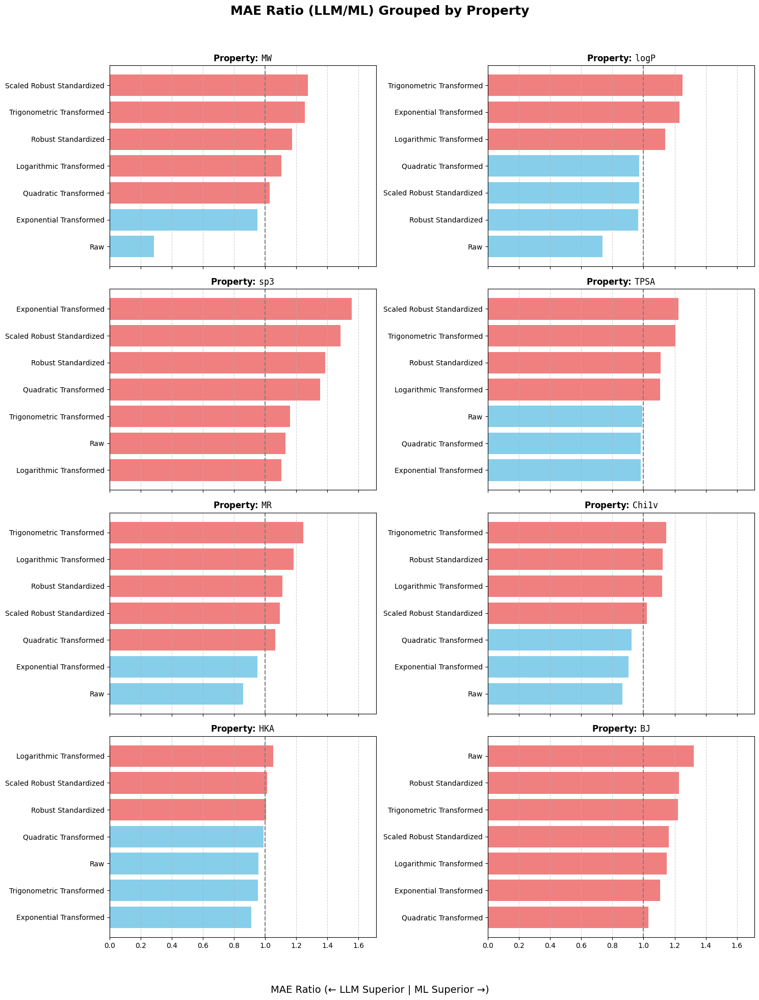


--- Summary ---
🏆 Top 5 Task-Properties where LLMs are most superior (Lowest MAE Ratio):
                           taskprop_name  mae_ratio
                       Raw $\mathtt{MW}$   0.286934
                     Raw $\mathtt{logP}$   0.736488
                       Raw $\mathtt{MR}$   0.857682
                    Raw $\mathtt{Chi1v}$   0.863453
Exponential Transformed $\mathtt{Chi1v}$   0.902398

📉 Top 5 Task-Properties where MLs are most superior (Highest MAE Ratio):
                            taskprop_name  mae_ratio
   Exponential Transformed $\mathtt{sp3}$   1.556719
Scaled Robust Standardized $\mathtt{sp3}$   1.483601
       Robust Standardized $\mathtt{sp3}$   1.388102
     Quadratic Transformed $\mathtt{sp3}$   1.355164
                        Raw $\mathtt{BJ}$   1.323981


In [9]:
if 'consolidator' in locals() and consolidator.consolidated_df is not None:
    mae_ratio_results = run_mae_ratio_analysis(consolidator)
else:
    print("Please load data into the 'consolidator' object first.")

In [85]:
analyze_mae_ratio_per_taskprop(consolidator)

📊 Analyzing MAE Ratio (Top 7 LLM Avg / Top 7 ML Avg)...
✅ MAE Ratio calculated for 56 Task-Property combinations.


,task,property,taskprop_name,mae_llm_avg,mae_ml_avg,mae_ratio
0,raw,mw,Raw $\mathtt{MW}$,12.439549,43.353346,0.286934
1,raw,logp,Raw $\mathtt{logP}$,0.736023,0.999369,0.736488
2,raw,sp3,Raw $\mathtt{sp3}$,0.119224,0.105446,1.130663
3,raw,tpsa,Raw $\mathtt{TPSA}$,11.891471,11.987859,0.991960
4,raw,mr,Raw $\mathtt{MR}$,8.667753,10.106018,0.857682
5,raw,chi,Raw $\mathtt{Chi1v}$,1.038332,1.202535,0.863453
6,raw,hka,Raw $\mathtt{HKA}$,0.440914,0.460577,0.957309
7,raw,bj,Raw $\mathtt{BJ}$,0.460257,0.347631,1.323981
8,robust_zscore,mw,Robust Standardized $\mathtt{MW}$,0.503838,0.429499,1.173083
9,robust_zscore,logp,Robust Standardized $\mathtt{logP}$,0.656101,0.678239,0.967359


In [86]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Property와 Task 이름 매핑
PROPERTY_MAP = {
    'mw': r'$\mathtt{MW}$', 'logp': r'$\mathtt{logP}$', 'sp3': r'$\mathtt{sp3}$', 
    'tpsa': r'$\mathtt{TPSA}$', 'mr': r'$\mathtt{MR}$', 'chi': r'$\mathtt{Chi1v}$', 
    'hka': r'$\mathtt{HKA}$', 'bj': r'$\mathtt{BJ}$',
    # SALI 결과 파일의 property 이름 매핑 추가
    'Molecular Weight': 'mw', 'LogP': 'logp', 'TPSA': 'tpsa', 
    'sp3': 'sp3', 'MolMR': 'mr', 'BJ': 'bj', 'Chi': 'chi', 'HKA': 'hka'
}

TASK_MAP = {
    'raw': 'Raw', 'robust_zscore': 'Robust Standardized', 'lt': 'Scaled Robust Standardized', 
    'sq': 'Quadratic Transformed', 'lg': 'Logarithmic Transformed', 
    'sn': 'Trigonometric Transformed', 'ex': 'Exponential Transformed'
}

def load_sali_results(sali_csv_path='sali_results_accelerated.csv'):
    """
    SALI 결과 CSV 파일을 로드하고 정리합니다.
    """
    print("📂 Loading SALI results...")
    sali_df = pd.read_csv(sali_csv_path)
    
    # Property 컬럼 파싱 - robust_zscore를 올바르게 처리
    # 예: "Molecular Weight_robust_zscore" -> ["Molecular Weight", "robust_zscore"]
    
    # '_robust_zscore', '_sq', '_lg', '_sn', '_ex' 패턴으로 분리
    def parse_property_column(prop_str):
        transformations = ['_robust_zscore', '_sq', '_lg', '_sn', '_ex']
        for trans in transformations:
            if prop_str.endswith(trans):
                prop_name = prop_str[:-len(trans)]
                trans_name = trans[1:]  # '_' 제거
                return prop_name, trans_name
        # 매칭 안되면 마지막 '_'로 분리 (fallback)
        parts = prop_str.rsplit('_', 1)
        if len(parts) == 2:
            return parts[0], parts[1]
        return prop_str, ''
    
    # 파싱 적용
    parsed = sali_df['Property'].apply(parse_property_column)
    sali_df['property_name'] = parsed.apply(lambda x: x[0])
    sali_df['transformation'] = parsed.apply(lambda x: x[1])
    
    # Property 이름을 표준화 (Molecular Weight -> mw)
    sali_df['property_std'] = sali_df['property_name'].map(PROPERTY_MAP)
    
    print(f"✅ Loaded {len(sali_df)} SALI records")
    print(f"   Properties: {sali_df['property_name'].unique()}")
    print(f"   Transformations: {sali_df['transformation'].unique()}")
    print(f"   Fingerprints: {sali_df['Fingerprint'].unique()}")
    
    return sali_df

def create_sali_mae_ratio_table(mae_ratio_df, sali_df):
    """
    MAE ratio 테이블에 SALI 값을 추가합니다.
    raw와 lt는 robust_zscore의 SALI 값을 사용합니다.
    """
    print("\n🔗 Integrating SALI values with MAE ratios...")
    
    # SALI 데이터에서 property_std가 없는 경우 처리
    if 'property_std' not in sali_df.columns:
        print("⚠️ Warning: 'property_std' column not found in sali_df")
        # Property 이름 수동 매핑
        sali_df['property_std'] = sali_df['property_name'].map({
            'Molecular Weight': 'mw',
            'LogP': 'logp', 
            'TPSA': 'tpsa',
            'sp3': 'sp3',
            'MolMR': 'mr',
            'BJ': 'bj',
            'Chi': 'chi',
            'HKA': 'hka'
        })
    
    # 결과를 저장할 리스트
    integrated_results = []
    
    # 각 MAE ratio 행에 대해 처리
    for _, row in mae_ratio_df.iterrows():
        task = row['task']
        property_name = row['property']
        
        # SALI를 가져올 transformation 결정
        # raw, lt, robust_zscore 모두 robust_zscore의 SALI 값 사용
        if task in ['raw', 'lt', 'robust_zscore']:
            sali_transformation = 'robust_zscore'
        else:
            sali_transformation = task
        
        # 해당하는 SALI 값들 찾기
        sali_match = sali_df[
            (sali_df['property_std'] == property_name) & 
            (sali_df['transformation'] == sali_transformation)
        ]
        
        # 디버깅 정보
        if len(sali_match) == 0:
            print(f"  ⚠️ No SALI found for property={property_name}, transformation={sali_transformation}")
            print(f"     Available properties: {sali_df['property_std'].unique()}")
            print(f"     Available transformations: {sali_df['transformation'].unique()}")
        
        # 각 fingerprint별 SALI 값 추출
        result_row = row.to_dict()
        
        for fp in ['ecfp', 'rdkit', 'maccs', 'chemberta']:
            fp_sali = sali_match[sali_match['Fingerprint'] == fp]['Mean_SALI'].values
            if len(fp_sali) > 0:
                result_row[f'sali_{fp}'] = fp_sali[0]
            else:
                # robust_zscore에도 없으면 NaN
                result_row[f'sali_{fp}'] = np.nan
        
        # 평균 SALI 계산
        sali_values = [result_row[f'sali_{fp}'] for fp in ['ecfp', 'rdkit', 'maccs', 'chemberta']]
        sali_values = [v for v in sali_values if not np.isnan(v)]
        if sali_values:
            result_row['sali_avg'] = np.mean(sali_values)
        else:
            result_row['sali_avg'] = np.nan
        
        integrated_results.append(result_row)
    
    # DataFrame으로 변환
    integrated_df = pd.DataFrame(integrated_results)
    
    # 컬럼 순서 정리
    base_cols = ['task', 'property', 'taskprop_name', 'mae_llm_avg', 'mae_ml_avg', 'mae_ratio']
    sali_cols = ['sali_ecfp', 'sali_rdkit', 'sali_maccs', 'sali_chemberta', 'sali_avg']
    
    integrated_df = integrated_df[base_cols + sali_cols]
    
    print(f"✅ Created integrated table with {len(integrated_df)} rows")
    print(f"   Missing SALI values: {integrated_df['sali_avg'].isna().sum()}")
    
    return integrated_df

def analyze_sali_mae_correlation(integrated_df):
    """
    SALI와 MAE ratio 간의 상관관계를 분석합니다.
    """
    print("\n📈 Analyzing SALI-MAE Ratio Correlation...")
    
    # 상관계수 계산
    correlations = {}
    for fp in ['ecfp', 'rdkit', 'maccs', 'chemberta', 'avg']:
        sali_col = f'sali_{fp}'
        if sali_col in integrated_df.columns:
            valid_data = integrated_df[[sali_col, 'mae_ratio']].dropna()
            if len(valid_data) > 2:
                corr = valid_data[sali_col].corr(valid_data['mae_ratio'])
                correlations[fp] = corr
                print(f"   {fp.upper():10s}: r = {corr:.4f}")
    
    return correlations

def create_sali_mae_scatter_plots(integrated_df):
    """
    SALI vs MAE ratio의 산점도를 그립니다.
    """
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    axes = axes.flatten()
    
    fingerprints = ['ecfp', 'rdkit', 'maccs', 'chemberta']
    
    for i, fp in enumerate(fingerprints):
        ax = axes[i]
        sali_col = f'sali_{fp}'
        
        # 유효한 데이터만 사용
        valid_data = integrated_df[[sali_col, 'mae_ratio', 'property']].dropna()
        
        # Property별로 색상 구분
        unique_props = valid_data['property'].unique()
        colors = plt.cm.tab10(np.linspace(0, 1, len(unique_props)))
        prop_colors = {prop: colors[j] for j, prop in enumerate(unique_props)}
        
        # 산점도 그리기
        for prop in unique_props:
            prop_data = valid_data[valid_data['property'] == prop]
            ax.scatter(prop_data[sali_col], prop_data['mae_ratio'], 
                      label=PROPERTY_MAP.get(prop, prop), 
                      alpha=0.7, s=80, 
                      color=prop_colors[prop])
        
        # 추세선 추가
        if len(valid_data) > 2:
            z = np.polyfit(valid_data[sali_col], valid_data['mae_ratio'], 1)
            p = np.poly1d(z)
            x_line = np.linspace(valid_data[sali_col].min(), valid_data[sali_col].max(), 100)
            ax.plot(x_line, p(x_line), "r--", alpha=0.5, linewidth=2)
            
            # 상관계수 표시
            corr = valid_data[sali_col].corr(valid_data['mae_ratio'])
            ax.text(0.05, 0.95, f'r = {corr:.3f}', transform=ax.transAxes, 
                   fontsize=12, verticalalignment='top',
                   bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        
        # 기준선 추가
        ax.axhline(y=1, color='gray', linestyle='--', alpha=0.5)
        
        # 레이블과 제목
        ax.set_xlabel(f'SALI ({fp.upper()})', fontsize=11)
        ax.set_ylabel('MAE Ratio (LLM/ML)', fontsize=11)
        ax.set_title(f'{fp.upper()} Fingerprint', fontsize=13, fontweight='bold')
        ax.grid(True, alpha=0.3)
        
        # 범례는 첫 번째 서브플롯에만
        if i == 0:
            ax.legend(loc='upper left', fontsize=9, framealpha=0.9)
    
    plt.suptitle('SALI vs MAE Ratio Analysis', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return fig

def create_heatmap_sali_mae(integrated_df):
    """
    Property와 Task별 SALI 및 MAE ratio 히트맵을 생성합니다.
    """
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    
    # SALI 평균 히트맵
    sali_pivot = integrated_df.pivot(index='property', columns='task', values='sali_avg')
    sali_pivot.index = sali_pivot.index.map(lambda x: PROPERTY_MAP.get(x, x))
    sali_pivot.columns = sali_pivot.columns.map(lambda x: TASK_MAP.get(x, x))
    
    sns.heatmap(sali_pivot, annot=True, fmt='.3f', cmap='YlOrRd', 
                ax=axes[0], cbar_kws={'label': 'SALI (Average)'})
    axes[0].set_title('Average SALI by Property and Task', fontsize=14, fontweight='bold')
    axes[0].set_xlabel('Transformation', fontsize=12)
    axes[0].set_ylabel('Property', fontsize=12)
    
    # MAE ratio 히트맵
    mae_pivot = integrated_df.pivot(index='property', columns='task', values='mae_ratio')
    mae_pivot.index = mae_pivot.index.map(lambda x: PROPERTY_MAP.get(x, x))
    mae_pivot.columns = mae_pivot.columns.map(lambda x: TASK_MAP.get(x, x))
    
    sns.heatmap(mae_pivot, annot=True, fmt='.3f', cmap='RdBu_r', center=1,
                ax=axes[1], cbar_kws={'label': 'MAE Ratio (LLM/ML)'})
    axes[1].set_title('MAE Ratio by Property and Task', fontsize=14, fontweight='bold')
    axes[1].set_xlabel('Transformation', fontsize=12)
    axes[1].set_ylabel('Property', fontsize=12)
    
    plt.suptitle('SALI and MAE Ratio Comparison', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return fig

def run_integrated_analysis(mae_ratio_df, sali_csv_path='sali_results_accelerated.csv'):
    """
    SALI와 MAE ratio 통합 분석을 실행합니다.
    """
    print("="*60)
    print("🚀 Starting SALI-MAE Ratio Integration Analysis")
    print("="*60)
    
    # 1. SALI 데이터 로드
    sali_df = load_sali_results(sali_csv_path)
    
    # 2. 통합 테이블 생성
    integrated_df = create_sali_mae_ratio_table(mae_ratio_df, sali_df)
    
    # 3. 상관관계 분석
    correlations = analyze_sali_mae_correlation(integrated_df)
    
    # 4. 시각화
    create_sali_mae_scatter_plots(integrated_df)
    create_heatmap_sali_mae(integrated_df)
    
    # 5. 요약 통계
    print("\n📊 Summary Statistics:")
    print("-"*40)
    
    # SALI가 높은데 MAE ratio가 낮은 경우 (LLM이 어려운 SAR에서도 잘함)
    high_sali_low_ratio = integrated_df[
        (integrated_df['sali_avg'] > integrated_df['sali_avg'].quantile(0.75)) &
        (integrated_df['mae_ratio'] < 1)
    ].sort_values('mae_ratio')
    
    if len(high_sali_low_ratio) > 0:
        print("\n🎯 Cases where LLMs excel despite high SALI (complex SAR):")
        print(high_sali_low_ratio[['taskprop_name', 'sali_avg', 'mae_ratio']].head())
    
    # SALI가 낮은데 MAE ratio가 높은 경우 (ML이 쉬운 SAR에서 더 잘함)
    low_sali_high_ratio = integrated_df[
        (integrated_df['sali_avg'] < integrated_df['sali_avg'].quantile(0.25)) &
        (integrated_df['mae_ratio'] > 1)
    ].sort_values('mae_ratio', ascending=False)
    
    if len(low_sali_high_ratio) > 0:
        print("\n🔍 Cases where MLs dominate despite low SALI (simple SAR):")
        print(low_sali_high_ratio[['taskprop_name', 'sali_avg', 'mae_ratio']].head())
    
    # CSV로 저장
    output_path = 'sali_mae_ratio_integrated.csv'
    integrated_df.to_csv(output_path, index=False)
    print(f"\n💾 Integrated results saved to '{output_path}'")
    
    return integrated_df

# 사용 예시
if __name__ == "__main__":
    print("Usage example:")
    print("integrated_df = run_integrated_analysis(mae_ratio_df, 'sali_results_accelerated.csv')")

Usage example:
integrated_df = run_integrated_analysis(mae_ratio_df, 'sali_results_accelerated.csv')


📊 Analyzing MAE Ratio (Top 7 LLM Avg / Top 7 ML Avg)...
✅ MAE Ratio calculated for 56 Task-Property combinations.
🚀 Starting SALI-MAE Ratio Integration Analysis
📂 Loading SALI results...
✅ Loaded 160 SALI records
   Properties: ['Molecular Weight' 'LogP' 'TPSA' 'sp3' 'MolMR' 'BJ' 'Chi' 'HKA']
   Transformations: ['robust_zscore' 'sq' 'lg' 'sn' 'ex']
   Fingerprints: ['ecfp' 'rdkit' 'maccs' 'chemberta']

🔗 Integrating SALI values with MAE ratios...
✅ Created integrated table with 56 rows
   Missing SALI values: 0

📈 Analyzing SALI-MAE Ratio Correlation...
   ECFP      : r = -0.2329
   RDKIT     : r = -0.2314
   MACCS     : r = -0.2347
   CHEMBERTA : r = -0.2260
   AVG       : r = -0.2309


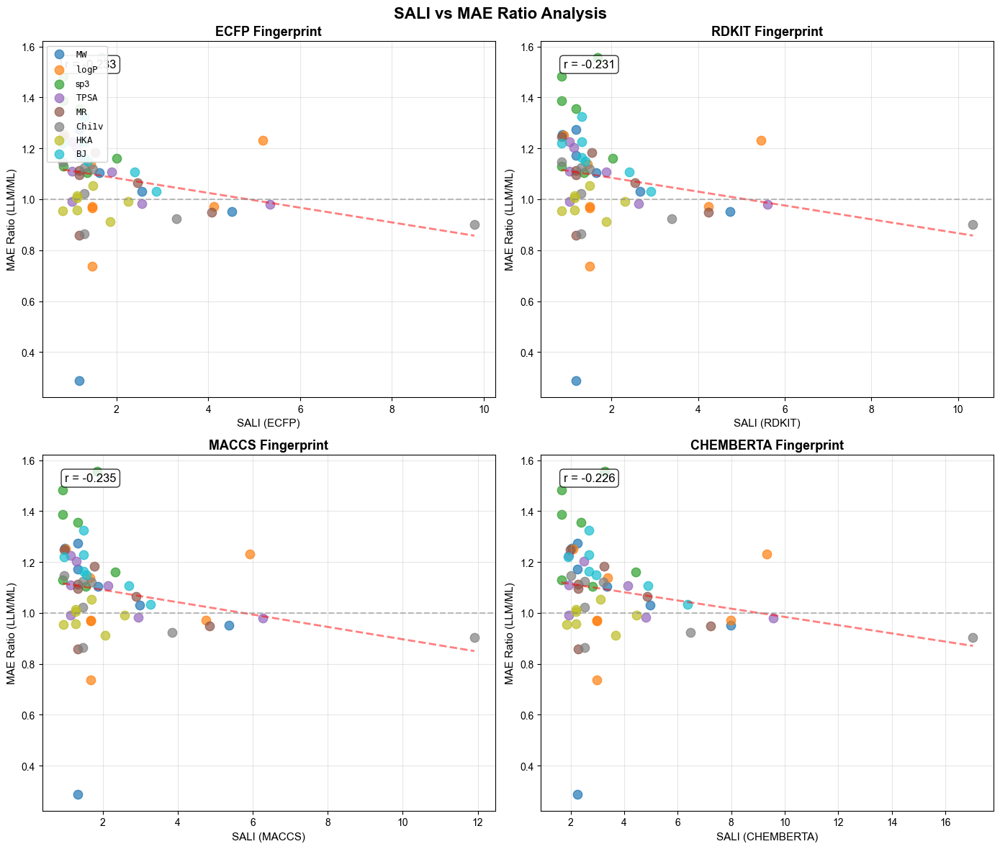

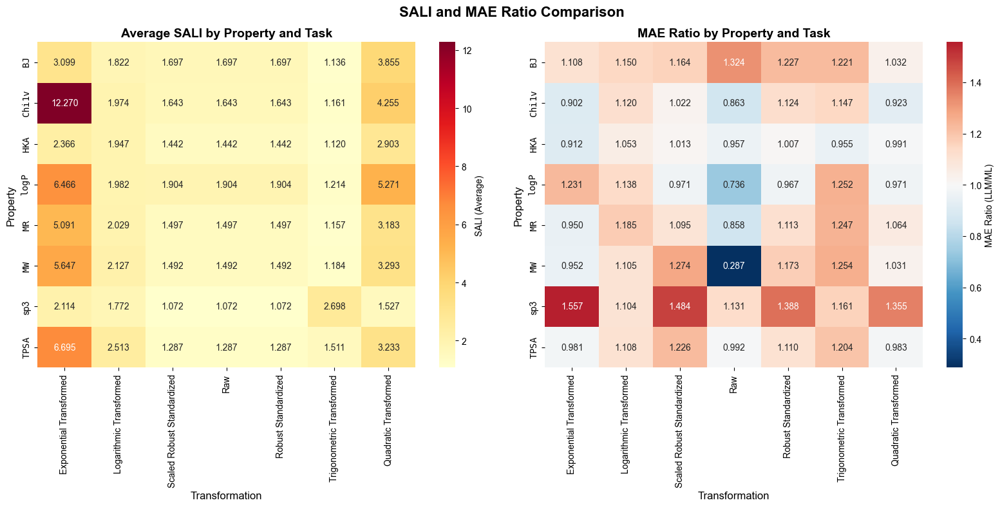


📊 Summary Statistics:
----------------------------------------

🎯 Cases where LLMs excel despite high SALI (complex SAR):
                               taskprop_name   sali_avg  mae_ratio
53  Exponential Transformed $\mathtt{Chi1v}$  12.269911   0.902398
29    Quadratic Transformed $\mathtt{Chi1v}$   4.254966   0.922953
52     Exponential Transformed $\mathtt{MR}$   5.091326   0.950101
48     Exponential Transformed $\mathtt{MW}$   5.646705   0.951852
25     Quadratic Transformed $\mathtt{logP}$   5.271401   0.971399

🔍 Cases where MLs dominate despite low SALI (simple SAR):
                                taskprop_name  sali_avg  mae_ratio
18             Scaled Robust Standardized sp3  1.071687   1.483601
10                    Robust Standardized sp3  1.071687   1.388102
40    Trigonometric Transformed $\mathtt{MW}$  1.184173   1.254346
41  Trigonometric Transformed $\mathtt{logP}$  1.213510   1.251674
44    Trigonometric Transformed $\mathtt{MR}$  1.157345   1.247011

💾 Integrated 

In [87]:
mae_ratio_df = analyze_mae_ratio_per_taskprop(consolidator)
integrated_df = run_integrated_analysis(mae_ratio_df, '../sali_results_accelerated.csv')

In [88]:
import pandas as pd
import numpy as np
from scipy import stats
from scipy.stats import skew, kurtosis, entropy
import warnings
warnings.filterwarnings('ignore')

def calculate_distribution_statistics(values):
    """
    분포로부터 다양한 통계적 특성을 계산합니다.
    """
    values = np.array(values)
    values = values[~np.isnan(values)]  # NaN 제거
    
    if len(values) == 0:
        return {}
    
    stats_dict = {
        # 기본 통계량
        'mean': np.mean(values),
        'median': np.median(values),
        'std': np.std(values),
        'var': np.var(values),
        'min': np.min(values),
        'max': np.max(values),
        'range': np.max(values) - np.min(values),
        
        # 분위수
        'q25': np.percentile(values, 25),
        'q75': np.percentile(values, 75),
        'iqr': np.percentile(values, 75) - np.percentile(values, 25),
        
        # 고차 모멘트
        'skewness': skew(values),
        'kurtosis': kurtosis(values),
        
        # 추가 통계량
        'cv': np.std(values) / np.mean(values) if np.mean(values) != 0 else 0,  # 변동계수
        'mad': np.median(np.abs(values - np.median(values))),  # Median Absolute Deviation
        'gini': calculate_gini(values),  # Gini coefficient
        
        # 분포 특성
        'entropy': stats.entropy(np.histogram(values, bins=10)[0] + 1e-10),  # Shannon entropy
        'energy': np.sum(values**2),  # Energy
        'rms': np.sqrt(np.mean(values**2)),  # Root Mean Square
        
        # Percentile 기반 특성
        'p10': np.percentile(values, 10),
        'p90': np.percentile(values, 90),
        'p90_p10_ratio': np.percentile(values, 90) / (np.percentile(values, 10) + 1e-10),
        
        # Outlier 관련
        'outlier_ratio': calculate_outlier_ratio(values),
        'z_score_max': np.max(np.abs(stats.zscore(values))) if len(values) > 1 else 0,
    }
    
    return stats_dict

def calculate_gini(values):
    """
    Gini coefficient 계산 (불평등 척도)
    """
    values = np.sort(np.abs(values))
    n = len(values)
    index = np.arange(1, n + 1)
    return (2 * np.sum(index * values)) / (n * np.sum(values)) - (n + 1) / n if np.sum(values) != 0 else 0

def calculate_outlier_ratio(values):
    """
    IQR 기준 outlier 비율 계산
    """
    q1 = np.percentile(values, 25)
    q3 = np.percentile(values, 75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = np.sum((values < lower_bound) | (values > upper_bound))
    return outliers / len(values) if len(values) > 0 else 0

def add_statistical_features_to_integrated_df(integrated_df, esol):
    """
    integrated_df에 통계적 특성을 추가합니다.
    raw와 lt는 robust_zscore의 값을 사용합니다.
    """
    print("📊 Adding statistical features to integrated dataframe...")
    
    # Property 이름 매핑 (통일된 형식으로)
    property_name_map = {
        'mw': 'Molecular Weight',
        'logp': 'LogP',
        'tpsa': 'TPSA',
        'sp3': 'sp3',
        'mr': 'MolMR',
        'bj': 'BJ',
        'chi': 'Chi',
        'hka': 'HKA'
    }
    
    # 결과를 저장할 리스트
    enhanced_rows = []
    
    # 각 행에 대해 처리
    for _, row in integrated_df.iterrows():
        task = row['task']
        property_key = row['property']
        
        # esol에서 사용할 컬럼명 결정
        property_name = property_name_map.get(property_key, property_key)
        
        # raw와 lt는 robust_zscore의 값을 사용
        if task in ['raw', 'lt']:
            column_name = f"{property_name}_robust_zscore"
        else:
            column_name = f"{property_name}_{task}"
        
        # 해당 컬럼이 esol에 있는지 확인
        if column_name in esol.columns:
            values = esol[column_name].values
            
            # 통계적 특성 계산
            stats_features = calculate_distribution_statistics(values)
            
            # 기존 row 데이터와 통계적 특성 병합
            enhanced_row = row.to_dict()
            
            # 통계적 특성 추가 (stat_ 접두사 사용)
            for stat_name, stat_value in stats_features.items():
                enhanced_row[f'stat_{stat_name}'] = stat_value
            
            enhanced_rows.append(enhanced_row)
        else:
            print(f"⚠️ Warning: Column '{column_name}' not found in esol dataframe")
            enhanced_rows.append(row.to_dict())
    
    # DataFrame으로 변환
    enhanced_df = pd.DataFrame(enhanced_rows)
    
    print(f"✅ Added {len(stats_features)} statistical features")
    print(f"   Total columns: {len(enhanced_df.columns)}")
    print(f"   Total rows: {len(enhanced_df)}")
    
    return enhanced_df

def expand_integrated_df_by_fingerprint(enhanced_df):
    """
    각 fingerprint별로 행을 확장합니다.
    물성(8) x 변환(7) x 임베딩(4) = 224 rows
    """
    print("\n🔄 Expanding dataframe by fingerprint...")
    
    expanded_rows = []
    fingerprints = ['ecfp', 'rdkit', 'maccs', 'chemberta']
    
    for _, row in enhanced_df.iterrows():
        # 각 fingerprint에 대해 별도의 행 생성
        for fp in fingerprints:
            expanded_row = row.to_dict()
            
            # fingerprint 컬럼 추가
            expanded_row['fingerprint'] = fp
            
            # 해당 fingerprint의 SALI 값을 'sali' 컬럼으로
            expanded_row['sali'] = row[f'sali_{fp}']
            
            # 개별 sali_* 컬럼들 제거 (중복 방지)
            for fp_temp in fingerprints:
                expanded_row.pop(f'sali_{fp_temp}', None)
            
            expanded_rows.append(expanded_row)
    
    expanded_df = pd.DataFrame(expanded_rows)
    
    print(f"✅ Expanded to {len(expanded_df)} rows")
    print(f"   Expected: 8 properties × 7 transformations × 4 fingerprints = 224")
    print(f"   Actual: {len(expanded_df)}")
    
    return expanded_df

def prepare_feature_matrix_for_clustering(expanded_df):
    """
    K-means 클러스터링을 위한 feature matrix를 준비합니다.
    """
    print("\n🎯 Preparing feature matrix for clustering...")
    
    # Feature 컬럼 선택
    feature_columns = []
    
    # SALI 값
    feature_columns.append('sali')
    
    # MAE 관련 특성
    mae_columns = ['mae_llm_avg', 'mae_ml_avg', 'mae_ratio']
    feature_columns.extend(mae_columns)
    
    # 통계적 특성 (stat_ 접두사)
    stat_columns = [col for col in expanded_df.columns if col.startswith('stat_')]
    feature_columns.extend(stat_columns)
    
    # Feature matrix 생성
    feature_matrix = expanded_df[feature_columns].values
    
    # NaN 처리 (평균값으로 대체)
    from sklearn.impute import SimpleImputer
    imputer = SimpleImputer(strategy='mean')
    feature_matrix = imputer.fit_transform(feature_matrix)
    
    # 정규화
    from sklearn.preprocessing import StandardScaler
    scaler = StandardScaler()
    feature_matrix_scaled = scaler.fit_transform(feature_matrix)
    
    print(f"✅ Feature matrix prepared:")
    print(f"   Shape: {feature_matrix_scaled.shape}")
    print(f"   Features: {len(feature_columns)}")
    print(f"   Feature names: {feature_columns[:5]}... (showing first 5)")
    
    # 메타데이터 추가 (클러스터링 후 분석용)
    metadata_df = expanded_df[['task', 'property', 'fingerprint', 'taskprop_name']].copy()
    
    return feature_matrix_scaled, feature_columns, metadata_df

def run_enhanced_integration(integrated_df, esol):
    """
    전체 프로세스를 실행합니다.
    Fingerprint별로 확장하지 않고 한 행에 모든 정보를 유지합니다.
    """
    print("="*60)
    print("🚀 Starting Enhanced Integration with Statistical Features")
    print("="*60)
    
    # 1. 통계적 특성 추가 (fingerprint별 확장 없이)
    enhanced_df = add_statistical_features_to_integrated_df(integrated_df, esol)
    
    # 2. Feature matrix 준비 (확장 없이)
    feature_matrix, feature_names = prepare_feature_matrix_without_expansion(enhanced_df)
    
    # 3. 결과 저장
    enhanced_df.to_csv('integrated_with_stats.csv', index=False)
    print(f"\n💾 Saved enhanced dataframe to 'integrated_with_stats.csv'")
    
    # 4. 요약 정보
    print("\n📋 Summary:")
    print(f"   Original integrated_df: {len(integrated_df)} rows")
    print(f"   Enhanced with stats: {len(enhanced_df)} rows (same as original)")
    print(f"   Feature matrix shape: {feature_matrix.shape}")
    print(f"   Total features: {len(feature_names)}")
    print(f"   Statistical features added: {len([c for c in enhanced_df.columns if c.startswith('stat_')])}")
    
    return enhanced_df, feature_matrix, feature_names

def prepare_feature_matrix_without_expansion(enhanced_df):
    """
    K-means 클러스터링을 위한 feature matrix를 준비합니다.
    Fingerprint별 확장 없이 모든 SALI 값을 feature로 포함합니다.
    """
    print("\n🎯 Preparing feature matrix for clustering...")
    
    # Feature 컬럼 선택
    feature_columns = []
    
    # 각 fingerprint별 SALI 값 (4개)
    sali_columns = ['sali_ecfp', 'sali_rdkit', 'sali_maccs', 'sali_chemberta', 'sali_avg']
    feature_columns.extend(sali_columns)
    
    # MAE 관련 특성
    mae_columns = ['mae_llm_avg', 'mae_ml_avg', 'mae_ratio']
    feature_columns.extend(mae_columns)
    
    # 통계적 특성 (stat_ 접두사)
    stat_columns = [col for col in enhanced_df.columns if col.startswith('stat_')]
    feature_columns.extend(stat_columns)
    
    # Feature matrix 생성
    feature_matrix = enhanced_df[feature_columns].values
    
    # NaN 처리 (평균값으로 대체)
    from sklearn.impute import SimpleImputer
    imputer = SimpleImputer(strategy='mean')
    feature_matrix = imputer.fit_transform(feature_matrix)
    
    # 정규화
    from sklearn.preprocessing import StandardScaler
    scaler = StandardScaler()
    feature_matrix_scaled = scaler.fit_transform(feature_matrix)
    
    print(f"✅ Feature matrix prepared:")
    print(f"   Shape: {feature_matrix_scaled.shape}")
    print(f"   Features: {len(feature_columns)}")
    print(f"\n   Feature categories:")
    print(f"   - SALI features: {len(sali_columns)}")
    print(f"   - MAE features: {len(mae_columns)}")
    print(f"   - Statistical features: {len(stat_columns)}")
    
    return feature_matrix_scaled, feature_columns

# 사용 예시
if __name__ == "__main__":
    print("Usage:")
    print("enhanced_df, feature_matrix, feature_names = run_enhanced_integration(integrated_df, esol)")
    print("\nThis will create:")
    print("  - enhanced_df: 56 rows (8 properties × 7 transformations) with all features")
    print("  - feature_matrix: Normalized features ready for K-means clustering")
    print("  - feature_names: List of all feature column names including:")
    print("    * 4 SALI values (ecfp, rdkit, maccs, chemberta)")
    print("    * 3 MAE metrics")
    print("    * 23 statistical features")

Usage:
enhanced_df, feature_matrix, feature_names = run_enhanced_integration(integrated_df, esol)

This will create:
  - enhanced_df: 56 rows (8 properties × 7 transformations) with all features
  - feature_matrix: Normalized features ready for K-means clustering
  - feature_names: List of all feature column names including:
    * 4 SALI values (ecfp, rdkit, maccs, chemberta)
    * 3 MAE metrics
    * 23 statistical features


In [89]:
enhanced_df, feature_matrix, feature_names = run_enhanced_integration(integrated_df, esol)

🚀 Starting Enhanced Integration with Statistical Features
📊 Adding statistical features to integrated dataframe...
✅ Added 23 statistical features
   Total columns: 34
   Total rows: 56

🎯 Preparing feature matrix for clustering...
✅ Feature matrix prepared:
   Shape: (56, 31)
   Features: 31

   Feature categories:
   - SALI features: 5
   - MAE features: 3
   - Statistical features: 23

💾 Saved enhanced dataframe to 'integrated_with_stats.csv'

📋 Summary:
   Original integrated_df: 56 rows
   Enhanced with stats: 56 rows (same as original)
   Feature matrix shape: (56, 31)
   Total features: 31
   Statistical features added: 23


In [90]:
enhanced_df

,task,property,taskprop_name,mae_llm_avg,mae_ml_avg,mae_ratio,sali_ecfp,sali_rdkit,sali_maccs,sali_chemberta,...,stat_mad,stat_gini,stat_entropy,stat_energy,stat_rms,stat_p10,stat_p90,stat_p90_p10_ratio,stat_outlier_ratio,stat_z_score_max
0,raw,mw,Raw $\mathtt{MW}$,12.439549,43.353346,0.286934,1.181490,1.184681,1.336242,2.265727,...,0.674491,0.401105,1.641144,1.149501e+03,1.009486,-0.897893,1.578751,-1.758284,0.008865,5.618831
1,raw,logp,Raw $\mathtt{logP}$,0.736023,0.999369,0.736488,1.472357,1.493978,1.675809,2.975592,...,0.674491,0.470762,1.435989,1.817520e+03,1.269361,-1.256757,1.616205,-1.286012,0.049645,5.409627
2,raw,sp3,Raw sp3,0.119224,0.105446,1.130663,0.848404,0.849439,0.933212,1.655692,...,0.674491,0.327500,2.106730,5.958364e+02,0.726790,-0.674491,1.214083,-1.800000,0.000000,1.482350
3,raw,tpsa,Raw $\mathtt{TPSA}$,11.891471,11.987859,0.991960,1.030946,1.036014,1.140760,1.942130,...,0.674491,0.432065,1.284107,9.825693e+02,0.933312,-0.674491,1.308769,-1.940380,0.010638,6.610714
4,raw,mr,Raw $\mathtt{MR}$,8.667753,10.106018,0.857682,1.184253,1.184640,1.341023,2.277819,...,0.674491,0.394769,1.652810,1.139294e+03,1.004994,-0.890874,1.550377,-1.740287,0.004433,5.484974
5,raw,chi,Raw $\mathtt{Chi1v}$,1.038332,1.202535,0.863453,1.292032,1.296072,1.466829,2.518578,...,0.674491,0.435046,1.541262,1.445364e+03,1.131968,-0.866983,1.794933,-2.070321,0.012411,6.138459
6,raw,hka,Raw $\mathtt{HKA}$,0.440914,0.460577,0.957309,1.144719,1.149130,1.278480,2.196571,...,0.674491,0.390452,1.639159,1.008878e+03,0.945725,-1.276848,1.120404,-0.877476,0.003546,4.358215
7,raw,bj,Raw $\mathtt{BJ}$,0.460257,0.347631,1.323981,1.300265,1.313879,1.479793,2.692545,...,0.674491,0.423868,1.580466,1.347734e+03,1.093069,-1.454774,1.063783,-0.731236,0.020390,4.669187
8,robust_zscore,mw,Robust Standardized $\mathtt{MW}$,0.503838,0.429499,1.173083,1.181490,1.184681,1.336242,2.265727,...,0.674491,0.401105,1.641144,1.149501e+03,1.009486,-0.897893,1.578751,-1.758284,0.008865,5.618831
9,robust_zscore,logp,Robust Standardized $\mathtt{logP}$,0.656101,0.678239,0.967359,1.472357,1.493978,1.675809,2.975592,...,0.674491,0.470762,1.435989,1.817520e+03,1.269361,-1.256757,1.616205,-1.286012,0.049645,5.409627


In [91]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import warnings
warnings.filterwarnings('ignore')

def perform_kmeans_clustering(enhanced_df, n_clusters=2):
    """
    MAE 관련 특성을 제외하고 K-means 클러스터링을 수행합니다.
    
    Parameters:
    -----------
    enhanced_df : DataFrame
        통계적 특성이 추가된 통합 데이터프레임
    n_clusters : int
        클러스터 개수 (기본값: 2)
    
    Returns:
    --------
    feature_matrix : array
        클러스터링에 사용된 정규화된 특성 행렬
    cluster_labels : array
        각 데이터 포인트의 클러스터 레이블
    feature_names : list
        사용된 특성 이름 리스트
    """
    print("="*60)
    print("🎯 K-means Clustering (MAE features excluded)")
    print("="*60)
    
    # Feature 선택 (MAE 관련 제외)
    feature_columns = []
    
    # SALI features
    sali_columns = ['sali_ecfp', 'sali_rdkit', 'sali_maccs', 'sali_chemberta', 'sali_avg']
    feature_columns.extend([col for col in sali_columns if col in enhanced_df.columns])
    
    # Statistical features
    stat_columns = [col for col in enhanced_df.columns if col.startswith('stat_')]
    feature_columns.extend(stat_columns)
    
    # MAE 관련 컬럼 명시적 제외 확인
    mae_columns = ['mae_llm_avg', 'mae_ml_avg', 'mae_ratio']
    feature_columns = [col for col in feature_columns if col not in mae_columns]
    
    print(f"✅ Selected features for clustering:")
    print(f"   - SALI features: {len([c for c in feature_columns if 'sali' in c])}")
    print(f"   - Statistical features: {len([c for c in feature_columns if 'stat_' in c])}")
    print(f"   - Total features: {len(feature_columns)}")
    print(f"\n❌ Excluded MAE features: {mae_columns}")
    
    # Feature matrix 생성
    X = enhanced_df[feature_columns].values
    
    # NaN 처리
    imputer = SimpleImputer(strategy='mean')
    X = imputer.fit_transform(X)
    
    # 정규화
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # K-means 클러스터링
    print(f"\n🔄 Performing K-means with {n_clusters} clusters...")
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(X_scaled)
    
    # 클러스터 정보 출력
    unique, counts = np.unique(cluster_labels, return_counts=True)
    print(f"✅ Clustering completed:")
    for cluster, count in zip(unique, counts):
        print(f"   - Cluster {cluster}: {count} samples")
    
    # Inertia (within-cluster sum of squares)
    print(f"\n📊 Inertia: {kmeans.inertia_:.2f}")
    
    return X_scaled, cluster_labels, feature_columns

def perform_tsne_visualization(X_scaled, cluster_labels, enhanced_df, perplexity=30):
    """
    t-SNE를 사용하여 클러스터링 결과를 2D로 시각화합니다.
    MAE ratio에 따라 마커 모양을 결정합니다.
    
    Parameters:
    -----------
    X_scaled : array
        정규화된 특성 행렬
    cluster_labels : array
        클러스터 레이블
    enhanced_df : DataFrame
        원본 데이터 (MAE ratio 정보 포함)
    perplexity : int
        t-SNE perplexity 파라미터
    """
    print("\n🎨 t-SNE Visualization")
    print("="*60)
    
    # t-SNE 수행
    print(f"Running t-SNE with perplexity={perplexity}...")
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42, n_iter=1000)
    X_tsne = tsne.fit_transform(X_scaled)
    
    # 시각화
    plt.figure(figsize=(12, 8))
    
    # 클러스터별 색상 정의
    colors = ['#FF6B6B', '#4ECDC4']  # 빨강, 청록
    
    # MAE ratio 기준 (1보다 작으면 o, 크면 x)
    mae_ratios = enhanced_df['mae_ratio'].values
    
    # 각 클러스터별로 플롯
    for cluster in np.unique(cluster_labels):
        cluster_mask = cluster_labels == cluster
        
        # MAE ratio에 따라 분리
        llm_better = (mae_ratios < 1) & cluster_mask  # o 마커
        ml_better = (mae_ratios >= 1) & cluster_mask   # x 마커
        
        # LLM이 더 나은 경우 (o 마커)
        if np.any(llm_better):
            plt.scatter(X_tsne[llm_better, 0], X_tsne[llm_better, 1],
                       c=colors[cluster], marker='o', s=150, alpha=0.7,
                       edgecolors='black', linewidth=1.5,
                       label=f'Cluster {cluster} (LLM better)')
        
        # ML이 더 나은 경우 (x 마커)
        if np.any(ml_better):
            plt.scatter(X_tsne[ml_better, 0], X_tsne[ml_better, 1],
                       c=colors[cluster], marker='x', s=200, alpha=0.7,
                       linewidth=2.5,
                       label=f'Cluster {cluster} (ML better)')
    
    # 각 포인트에 대한 라벨 추가 (옵션)
    add_labels = False  # True로 바꾸면 라벨 표시
    if add_labels and len(enhanced_df) <= 20:  # 20개 이하일 때만 라벨 표시
        for i, (x, y) in enumerate(X_tsne):
            task = enhanced_df.iloc[i]['task']
            prop = enhanced_df.iloc[i]['property']
            plt.annotate(f'{prop[:2]}_{task[:2]}', (x, y), 
                        fontsize=8, alpha=0.5, ha='center')
    
    plt.xlabel('t-SNE Component 1', fontsize=12)
    plt.ylabel('t-SNE Component 2', fontsize=12)
    plt.title('K-means Clustering Visualization with t-SNE\n(○: MAE ratio < 1, ×: MAE ratio ≥ 1)', 
              fontsize=14, fontweight='bold')
    plt.legend(loc='best', fontsize=10)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    return X_tsne

def analyze_cluster_characteristics(enhanced_df, cluster_labels, feature_columns):
    """
    각 클러스터의 특성을 분석합니다.
    """
    print("\n📈 Cluster Characteristics Analysis")
    print("="*60)
    
    # 클러스터 레이블 추가
    enhanced_df_with_clusters = enhanced_df.copy()
    enhanced_df_with_clusters['cluster'] = cluster_labels
    
    # 각 클러스터별 통계
    for cluster in np.unique(cluster_labels):
        cluster_data = enhanced_df_with_clusters[enhanced_df_with_clusters['cluster'] == cluster]
        
        print(f"\n🔍 Cluster {cluster} (n={len(cluster_data)}):")
        
        # Task 분포
        print(f"   Tasks: {cluster_data['task'].value_counts().to_dict()}")
        
        # Property 분포
        print(f"   Properties: {cluster_data['property'].value_counts().to_dict()}")
        
        # MAE ratio 통계
        mae_stats = cluster_data['mae_ratio'].describe()
        print(f"   MAE ratio: mean={mae_stats['mean']:.3f}, std={mae_stats['std']:.3f}")
        print(f"   MAE ratio < 1 (LLM better): {(cluster_data['mae_ratio'] < 1).sum()} samples")
        print(f"   MAE ratio ≥ 1 (ML better): {(cluster_data['mae_ratio'] >= 1).sum()} samples")
        
        # 주요 SALI 특성
        print(f"   Average SALI values:")
        for sali_col in ['sali_ecfp', 'sali_rdkit', 'sali_maccs', 'sali_chemberta']:
            if sali_col in cluster_data.columns:
                mean_val = cluster_data[sali_col].mean()
                print(f"     - {sali_col}: {mean_val:.3f}")
    
    return enhanced_df_with_clusters

def create_feature_importance_plot(X_scaled, cluster_labels, feature_columns):
    """
    클러스터를 구분하는 주요 특성을 시각화합니다.
    """
    from sklearn.ensemble import RandomForestClassifier
    
    print("\n🔑 Feature Importance for Cluster Separation")
    
    # Random Forest로 feature importance 계산
    rf = RandomForestClassifier(n_estimators=100, random_state=42)
    rf.fit(X_scaled, cluster_labels)
    
    # Feature importance 정렬
    importance_df = pd.DataFrame({
        'feature': feature_columns,
        'importance': rf.feature_importances_
    }).sort_values('importance', ascending=False).head(15)
    
    # 시각화
    plt.figure(figsize=(10, 6))
    plt.barh(importance_df['feature'], importance_df['importance'])
    plt.xlabel('Feature Importance', fontsize=12)
    plt.title('Top 15 Features for Cluster Separation', fontsize=14, fontweight='bold')
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()
    
    return importance_df

def run_clustering_analysis(enhanced_df, n_clusters=2):
    """
    전체 클러스터링 분석 파이프라인을 실행합니다.
    """
    print("\n" + "="*60)
    print("🚀 Starting Complete Clustering Analysis")
    print("="*60)
    
    # 1. K-means 클러스터링
    X_scaled, cluster_labels, feature_columns = perform_kmeans_clustering(enhanced_df, n_clusters)
    
    # 2. t-SNE 시각화
    X_tsne = perform_tsne_visualization(X_scaled, cluster_labels, enhanced_df)
    
    # 3. 클러스터 특성 분석
    enhanced_df_with_clusters = analyze_cluster_characteristics(enhanced_df, cluster_labels, feature_columns)
    
    # 4. Feature importance
    importance_df = create_feature_importance_plot(X_scaled, cluster_labels, feature_columns)
    
    # 5. 결과 저장
    enhanced_df_with_clusters.to_csv('clustering_results.csv', index=False)
    print("\n💾 Results saved to 'clustering_results.csv'")
    
    return enhanced_df_with_clusters, X_tsne, importance_df

# 사용 예시
if __name__ == "__main__":
    print("Usage:")
    print("results_df, tsne_coords, importance = run_clustering_analysis(enhanced_df, n_clusters=2)")
    print("\nThis will:")
    print("  1. Perform K-means clustering (excluding MAE features)")
    print("  2. Visualize with t-SNE (○ for MAE ratio < 1, × for MAE ratio ≥ 1)")
    print("  3. Analyze cluster characteristics")
    print("  4. Show feature importance for cluster separation")

Usage:
results_df, tsne_coords, importance = run_clustering_analysis(enhanced_df, n_clusters=2)

This will:
  1. Perform K-means clustering (excluding MAE features)
  2. Visualize with t-SNE (○ for MAE ratio < 1, × for MAE ratio ≥ 1)
  3. Analyze cluster characteristics
  4. Show feature importance for cluster separation



🚀 Starting Complete Clustering Analysis
🎯 K-means Clustering (MAE features excluded)
✅ Selected features for clustering:
   - SALI features: 5
   - Statistical features: 23
   - Total features: 28

❌ Excluded MAE features: ['mae_llm_avg', 'mae_ml_avg', 'mae_ratio']

🔄 Performing K-means with 2 clusters...
✅ Clustering completed:
   - Cluster 0: 50 samples
   - Cluster 1: 6 samples

📊 Inertia: 853.98

🎨 t-SNE Visualization
Running t-SNE with perplexity=30...


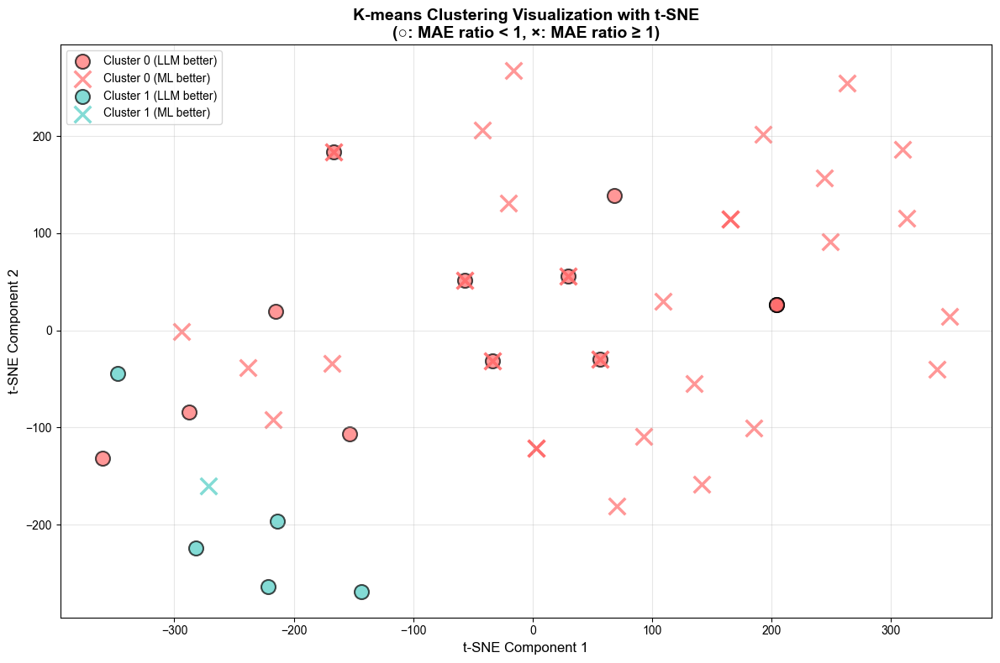


📈 Cluster Characteristics Analysis

🔍 Cluster 0 (n=50):
   Tasks: {'raw': 8, 'robust_zscore': 8, 'lt': 8, 'lg': 8, 'sn': 8, 'sq': 7, 'ex': 3}
   Properties: {'sp3': 7, 'hka': 7, 'bj': 7, 'mw': 6, 'tpsa': 6, 'mr': 6, 'chi': 6, 'logp': 5}
   MAE ratio: mean=1.097, std=0.195
   MAE ratio < 1 (LLM better): 13 samples
   MAE ratio ≥ 1 (ML better): 37 samples
   Average SALI values:
     - sali_ecfp: 1.437
     - sali_rdkit: 1.454
     - sali_maccs: 1.636
     - sali_chemberta: 2.935

🔍 Cluster 1 (n=6):
   Tasks: {'ex': 5, 'sq': 1}
   Properties: {'logp': 2, 'mw': 1, 'tpsa': 1, 'mr': 1, 'chi': 1}
   MAE ratio: mean=0.998, std=0.117
   MAE ratio < 1 (LLM better): 5 samples
   MAE ratio ≥ 1 (ML better): 1 samples
   Average SALI values:
     - sali_ecfp: 5.503
     - sali_rdkit: 5.767
     - sali_maccs: 6.510
     - sali_chemberta: 9.846

🔑 Feature Importance for Cluster Separation


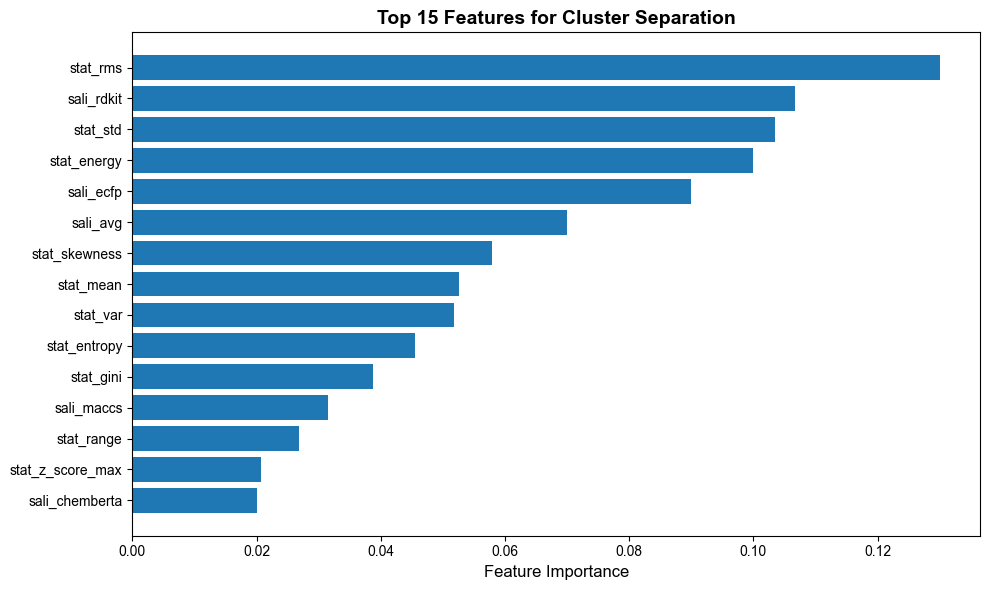


💾 Results saved to 'clustering_results.csv'


In [92]:
results_df, tsne_coords, importance = run_clustering_analysis(enhanced_df, n_clusters=2)

In [34]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

def prepare_features_for_tsne(enhanced_df):
    """
    MAE 관련 특성을 제외하고 t-SNE를 위한 feature matrix를 준비합니다.
    
    Parameters:
    -----------
    enhanced_df : DataFrame
        통계적 특성이 추가된 통합 데이터프레임
    
    Returns:
    --------
    X_scaled : array
        정규화된 특성 행렬
    feature_columns : list
        사용된 특성 이름 리스트
    """
    print("="*60)
    print("📊 Preparing Features for t-SNE (MAE features excluded)")
    print("="*60)
    
    # Feature 선택 (MAE 관련 제외)
    feature_columns = []
    
    # SALI features
    sali_columns = ['sali_ecfp', 'sali_rdkit', 'sali_maccs', 'sali_chemberta', 'sali_avg']
    feature_columns.extend([col for col in sali_columns if col in enhanced_df.columns])
    
    # Statistical features
    stat_columns = [col for col in enhanced_df.columns if col.startswith('stat_')]
    feature_columns.extend(stat_columns)
    
    # MAE 관련 컬럼 명시적 제외
    mae_columns = ['mae_llm_avg', 'mae_ml_avg', 'mae_ratio']
    feature_columns = [col for col in feature_columns if col not in mae_columns]
    
    print(f"✅ Selected features for t-SNE:")
    print(f"   - SALI features: {len([c for c in feature_columns if 'sali' in c])}")
    print(f"   - Statistical features: {len([c for c in feature_columns if 'stat_' in c])}")
    print(f"   - Total features: {len(feature_columns)}")
    print(f"\n❌ Excluded MAE features: {mae_columns}")
    
    # Feature matrix 생성
    X = enhanced_df[feature_columns].values
    
    # NaN 처리
    imputer = SimpleImputer(strategy='mean')
    X = imputer.fit_transform(X)
    
    # 정규화
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    return X_scaled, feature_columns

def perform_tsne_analysis(enhanced_df, perplexity=15):
    """
    t-SNE를 수행하고 다양한 방식으로 시각화합니다.
    
    Parameters:
    -----------
    enhanced_df : DataFrame
        분석할 데이터프레임
    perplexity : int
        t-SNE perplexity 파라미터 (5-50 사이, 데이터 크기에 맞게 조정)
    """
    print("\n🎨 t-SNE Analysis and Visualization")
    print("="*60)
    
    # Feature 준비
    X_scaled, feature_columns = prepare_features_for_tsne(enhanced_df)
    
    # t-SNE 수행
    print(f"\nRunning t-SNE with perplexity={perplexity}...")
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42, 
                n_iter=2000, learning_rate='auto', init='pca')
    X_tsne = tsne.fit_transform(X_scaled)
    
    # 결과를 DataFrame에 추가
    enhanced_df_tsne = enhanced_df.copy()
    enhanced_df_tsne['tsne_1'] = X_tsne[:, 0]
    enhanced_df_tsne['tsne_2'] = X_tsne[:, 1]
    
    return enhanced_df_tsne, X_tsne

def create_tsne_visualization_by_mae_ratio(enhanced_df_tsne):
    """
    MAE ratio에 따라 마커를 다르게 하여 t-SNE 시각화
    """
    plt.figure(figsize=(12, 8))
    
    # MAE ratio 기준으로 분리
    llm_better = enhanced_df_tsne['mae_ratio'] < 1
    ml_better = enhanced_df_tsne['mae_ratio'] >= 1
    
    # 색상맵 설정 (연속적인 색상으로 MAE ratio 표현)
    mae_ratios = enhanced_df_tsne['mae_ratio'].values
    
    # LLM이 더 나은 경우 (○ 마커)
    scatter1 = plt.scatter(enhanced_df_tsne[llm_better]['tsne_1'], 
                          enhanced_df_tsne[llm_better]['tsne_2'],
                          c=mae_ratios[llm_better], cmap='coolwarm', vmin=0, vmax=2,
                          marker='o', s=200, alpha=0.7, edgecolors='black', linewidth=1.5,
                          label='LLM better (ratio < 1)')
    
    # ML이 더 나은 경우 (× 마커)
    scatter2 = plt.scatter(enhanced_df_tsne[ml_better]['tsne_1'], 
                          enhanced_df_tsne[ml_better]['tsne_2'],
                          c=mae_ratios[ml_better], cmap='coolwarm', vmin=0, vmax=2,
                          marker='x', s=250, alpha=0.7, linewidth=2.5,
                          label='ML better (ratio ≥ 1)')
    
    # 컬러바 추가
    plt.colorbar(scatter1, label='MAE Ratio (LLM/ML)')
    
    plt.xlabel('t-SNE Component 1', fontsize=12)
    plt.ylabel('t-SNE Component 2', fontsize=12)
    plt.title('t-SNE Visualization by MAE Ratio\n(○: LLM better, ×: ML better)', 
              fontsize=14, fontweight='bold')
    plt.legend(loc='best', fontsize=10)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

def create_tsne_visualization_by_property(enhanced_df_tsne):
    """
    Property별로 색상을 다르게 하여 t-SNE 시각화
    """
    plt.figure(figsize=(14, 8))
    
    # Property별 색상 매핑
    properties = enhanced_df_tsne['property'].unique()
    colors = plt.cm.tab10(np.linspace(0, 1, len(properties)))
    prop_colors = {prop: colors[i] for i, prop in enumerate(properties)}
    
    # MAE ratio에 따라 마커 모양 결정
    for prop in properties:
        prop_data = enhanced_df_tsne[enhanced_df_tsne['property'] == prop]
        
        # LLM better (○)
        llm_mask = prop_data['mae_ratio'] < 1
        if llm_mask.any():
            plt.scatter(prop_data[llm_mask]['tsne_1'], prop_data[llm_mask]['tsne_2'],
                       c=[prop_colors[prop]], marker='o', s=150, alpha=0.7,
                       edgecolors='black', linewidth=1, label=f'{prop} (LLM)')
        
        # ML better (×)
        ml_mask = prop_data['mae_ratio'] >= 1
        if ml_mask.any():
            plt.scatter(prop_data[ml_mask]['tsne_1'], prop_data[ml_mask]['tsne_2'],
                       c=[prop_colors[prop]], marker='x', s=200, alpha=0.7,
                       linewidth=2, label=f'{prop} (ML)')
    
    plt.xlabel('t-SNE Component 1', fontsize=12)
    plt.ylabel('t-SNE Component 2', fontsize=12)
    plt.title('t-SNE Visualization by Property', fontsize=14, fontweight='bold')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

def create_tsne_visualization_by_transformation(enhanced_df_tsne):
    """
    Transformation(task)별로 색상을 다르게 하여 t-SNE 시각화
    """
    plt.figure(figsize=(14, 8))
    
    # Task별 색상 매핑
    tasks = enhanced_df_tsne['task'].unique()
    colors = plt.cm.Set2(np.linspace(0, 1, len(tasks)))
    task_colors = {task: colors[i] for i, task in enumerate(tasks)}
    
    # Task별로 플롯
    for task in tasks:
        task_data = enhanced_df_tsne[enhanced_df_tsne['task'] == task]
        
        # LLM better (○)
        llm_mask = task_data['mae_ratio'] < 1
        if llm_mask.any():
            plt.scatter(task_data[llm_mask]['tsne_1'], task_data[llm_mask]['tsne_2'],
                       c=[task_colors[task]], marker='o', s=150, alpha=0.7,
                       edgecolors='black', linewidth=1, label=f'{task} (LLM)')
        
        # ML better (×)
        ml_mask = task_data['mae_ratio'] >= 1
        if ml_mask.any():
            plt.scatter(task_data[ml_mask]['tsne_1'], task_data[ml_mask]['tsne_2'],
                       c=[task_colors[task]], marker='x', s=200, alpha=0.7,
                       linewidth=2, label=f'{task} (ML)')
    
    plt.xlabel('t-SNE Component 1', fontsize=12)
    plt.ylabel('t-SNE Component 2', fontsize=12)
    plt.title('t-SNE Visualization by Transformation', fontsize=14, fontweight='bold')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

def create_tsne_interactive_plot(enhanced_df_tsne):
    """
    인터랙티브한 t-SNE 플롯 (hover 정보 포함)
    plotly가 설치되어 있어야 함
    """
    try:
        import plotly.express as px
        import plotly.graph_objects as go
        
        # MAE ratio에 따른 symbol 설정
        enhanced_df_tsne['marker_symbol'] = enhanced_df_tsne['mae_ratio'].apply(
            lambda x: 'circle' if x < 1 else 'x'
        )
        enhanced_df_tsne['model_preference'] = enhanced_df_tsne['mae_ratio'].apply(
            lambda x: 'LLM better' if x < 1 else 'ML better'
        )
        
        # Hover text 생성
        enhanced_df_tsne['hover_text'] = (
            'Property: ' + enhanced_df_tsne['property'] + '<br>' +
            'Task: ' + enhanced_df_tsne['task'] + '<br>' +
            'MAE Ratio: ' + enhanced_df_tsne['mae_ratio'].round(3).astype(str) + '<br>' +
            'SALI (avg): ' + enhanced_df_tsne['sali_avg'].round(3).astype(str)
        )
        
        # 인터랙티브 플롯 생성
        fig = px.scatter(enhanced_df_tsne, 
                        x='tsne_1', y='tsne_2',
                        color='mae_ratio',
                        symbol='model_preference',
                        hover_data=['property', 'task', 'mae_ratio', 'sali_avg'],
                        color_continuous_scale='RdBu_r',
                        range_color=[0, 2],
                        title='Interactive t-SNE Visualization',
                        labels={'tsne_1': 't-SNE Component 1', 
                               'tsne_2': 't-SNE Component 2'})
        
        fig.update_traces(marker=dict(size=12, line=dict(width=1, color='black')))
        fig.update_layout(width=900, height=600)
        fig.show()
        
        print("✅ Interactive plot created with plotly")
        
    except ImportError:
        print("⚠️ plotly not installed. Skipping interactive plot.")
        print("   Install with: pip install plotly")

def analyze_tsne_patterns(enhanced_df_tsne):
    """
    t-SNE 결과의 패턴을 분석합니다.
    """
    print("\n📊 t-SNE Pattern Analysis")
    print("="*60)
    
    # 거리 기반 분석
    from scipy.spatial.distance import pdist, squareform
    
    # t-SNE 좌표로 거리 행렬 계산
    tsne_coords = enhanced_df_tsne[['tsne_1', 'tsne_2']].values
    distances = squareform(pdist(tsne_coords))
    
    # 가장 가까운 이웃 찾기
    print("\n🔍 Nearest Neighbors in t-SNE space:")
    for i in range(min(5, len(enhanced_df_tsne))):  # 처음 5개 샘플에 대해
        row = enhanced_df_tsne.iloc[i]
        nearest_idx = np.argsort(distances[i])[1:4]  # 자기 자신 제외, 가장 가까운 3개
        
        print(f"\n{row['property']}_{row['task']} (MAE ratio: {row['mae_ratio']:.3f}):")
        for idx in nearest_idx:
            neighbor = enhanced_df_tsne.iloc[idx]
            print(f"  → {neighbor['property']}_{neighbor['task']} "
                  f"(dist: {distances[i, idx]:.2f}, MAE ratio: {neighbor['mae_ratio']:.3f})")
    
    # MAE ratio 그룹별 중심점
    print("\n📍 Centroids by MAE ratio groups:")
    llm_better = enhanced_df_tsne[enhanced_df_tsne['mae_ratio'] < 1]
    ml_better = enhanced_df_tsne[enhanced_df_tsne['mae_ratio'] >= 1]
    
    if len(llm_better) > 0:
        llm_centroid = llm_better[['tsne_1', 'tsne_2']].mean()
        print(f"  LLM better centroid: ({llm_centroid['tsne_1']:.2f}, {llm_centroid['tsne_2']:.2f})")
    
    if len(ml_better) > 0:
        ml_centroid = ml_better[['tsne_1', 'tsne_2']].mean()
        print(f"  ML better centroid: ({ml_centroid['tsne_1']:.2f}, {ml_centroid['tsne_2']:.2f})")
    
    # 분산 분석
    print("\n📈 Variance in t-SNE space:")
    print(f"  Component 1 variance: {enhanced_df_tsne['tsne_1'].var():.2f}")
    print(f"  Component 2 variance: {enhanced_df_tsne['tsne_2'].var():.2f}")

def run_tsne_analysis(enhanced_df, perplexity=15):
    """
    전체 t-SNE 분석 파이프라인을 실행합니다.
    """
    print("\n" + "="*60)
    print("🚀 Starting t-SNE Analysis (No Clustering)")
    print("="*60)
    
    # 1. t-SNE 수행
    enhanced_df_tsne, X_tsne = perform_tsne_analysis(enhanced_df, perplexity)
    
    # 2. 다양한 시각화
    print("\n📈 Creating visualizations...")
    
    # MAE ratio 기반 시각화
    create_tsne_visualization_by_mae_ratio(enhanced_df_tsne)
    
    # Property별 시각화
    create_tsne_visualization_by_property(enhanced_df_tsne)
    
    # Transformation별 시각화
    create_tsne_visualization_by_transformation(enhanced_df_tsne)
    
    # 인터랙티브 플롯 (plotly 설치 필요)
    create_tsne_interactive_plot(enhanced_df_tsne)
    
    # 3. 패턴 분석
    analyze_tsne_patterns(enhanced_df_tsne)
    
    # 4. 결과 저장
    enhanced_df_tsne.to_csv('tsne_results.csv', index=False)
    print("\n💾 Results saved to 'tsne_results.csv'")
    
    return enhanced_df_tsne

# 사용 예시
if __name__ == "__main__":
    print("Usage:")
    print("tsne_results = run_tsne_analysis(enhanced_df, perplexity=15)")
    print("\nThis will:")
    print("  1. Perform t-SNE dimensionality reduction (excluding MAE features)")
    print("  2. Create multiple visualizations:")
    print("     - By MAE ratio (○ for ratio < 1, × for ratio ≥ 1)")
    print("     - By Property (colored by property type)")
    print("     - By Transformation (colored by task)")
    print("  3. Analyze patterns in t-SNE space")
    print("  4. Save results with t-SNE coordinates")

Usage:
tsne_results = run_tsne_analysis(enhanced_df, perplexity=15)

This will:
  1. Perform t-SNE dimensionality reduction (excluding MAE features)
  2. Create multiple visualizations:
     - By MAE ratio (○ for ratio < 1, × for ratio ≥ 1)
     - By Property (colored by property type)
     - By Transformation (colored by task)
  3. Analyze patterns in t-SNE space
  4. Save results with t-SNE coordinates



🚀 Starting t-SNE Analysis (No Clustering)

🎨 t-SNE Analysis and Visualization
📊 Preparing Features for t-SNE (MAE features excluded)
✅ Selected features for t-SNE:
   - SALI features: 5
   - Statistical features: 23
   - Total features: 28

❌ Excluded MAE features: ['mae_llm_avg', 'mae_ml_avg', 'mae_ratio']

Running t-SNE with perplexity=15...

📈 Creating visualizations...


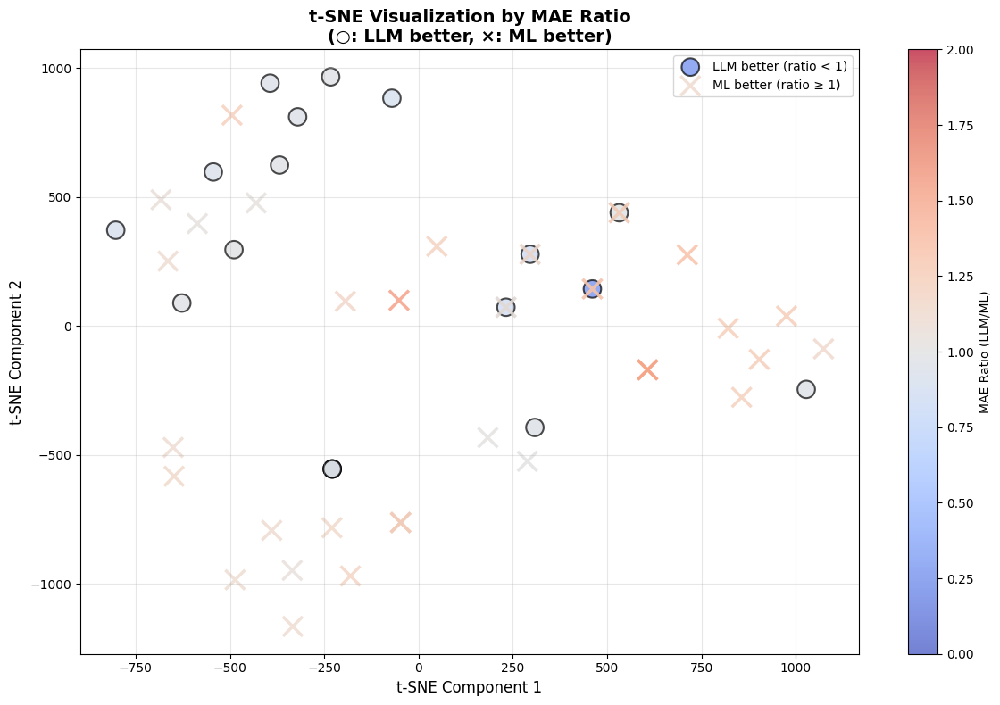

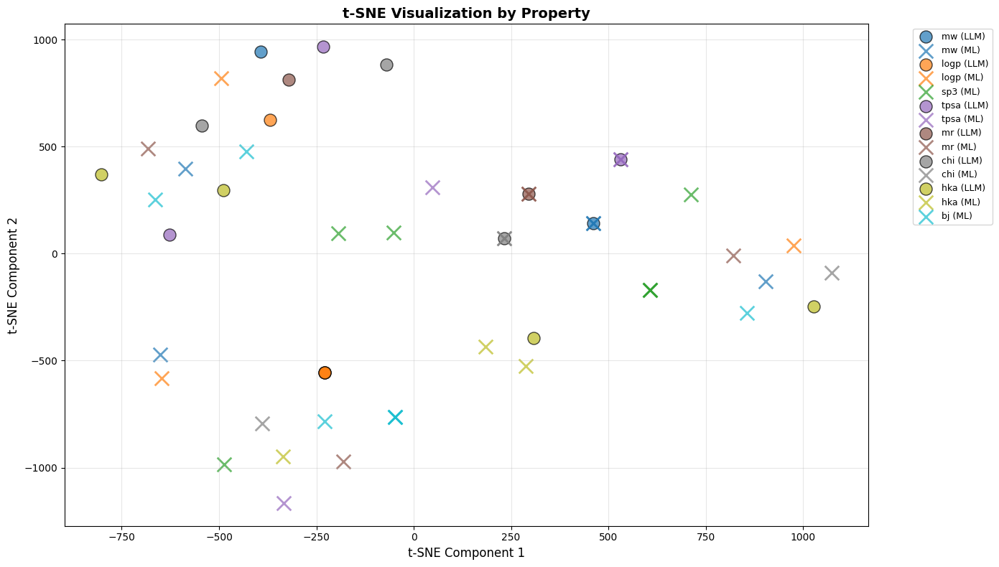

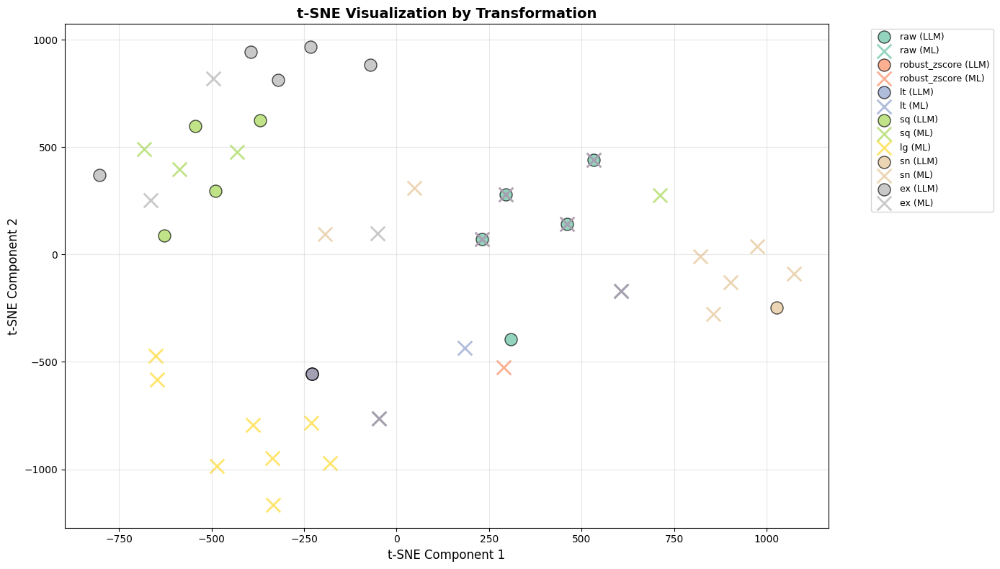

⚠️ plotly not installed. Skipping interactive plot.
   Install with: pip install plotly

📊 t-SNE Pattern Analysis

🔍 Nearest Neighbors in t-SNE space:

mw_raw (MAE ratio: 0.287):
  → mw_lt (dist: 0.00, MAE ratio: 1.274)
  → mw_robust_zscore (dist: 0.00, MAE ratio: 1.173)
  → mr_robust_zscore (dist: 213.14, MAE ratio: 1.113)

logp_raw (MAE ratio: 0.736):
  → logp_raw (dist: 0.00, MAE ratio: 0.736)
  → logp_lt (dist: 0.00, MAE ratio: 0.971)
  → bj_lg (dist: 228.07, MAE ratio: 1.150)

sp3_raw (MAE ratio: 1.131):
  → sp3_lt (dist: 0.00, MAE ratio: 1.484)
  → sp3_robust_zscore (dist: 0.00, MAE ratio: 1.388)
  → mr_sn (dist: 267.68, MAE ratio: 1.247)

tpsa_raw (MAE ratio: 0.992):
  → tpsa_lt (dist: 0.00, MAE ratio: 1.226)
  → tpsa_robust_zscore (dist: 0.00, MAE ratio: 1.110)
  → sp3_sq (dist: 243.41, MAE ratio: 1.355)

mr_raw (MAE ratio: 0.858):
  → mr_raw (dist: 0.00, MAE ratio: 0.858)
  → mr_robust_zscore (dist: 0.00, MAE ratio: 1.113)
  → mw_raw (dist: 213.14, MAE ratio: 0.287)

📍 Centroi

In [35]:
tsne_results = run_tsne_analysis(enhanced_df, perplexity=15)

In [96]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression # 로지스틱 회귀 모델 추가
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

def select_features_with_logistic_regression(enhanced_df, top_n=10):
    """
    로지스틱 회귀를 사용하여 LLM/ML 성능을 가장 잘 예측하는 특성을 선택합니다.
    
    Parameters:
    -----------
    enhanced_df : DataFrame
        분석할 데이터프레임
    top_n : int
        선택할 상위 특성의 개수
        
    Returns:
    --------
    selected_features : list
        선택된 상위 N개 특성 이름 리스트
    """
    print("="*60)
    print(f"🎯 Feature Selection using Logistic Regression (Top {top_n})")
    print("="*60)

    # 1. 특성 및 타겟 변수 설정
    # MAE 관련 특성을 제외한 모든 SALI 및 통계 특성 선택
    feature_columns = [col for col in enhanced_df.columns if col.startswith('sali_') or col.startswith('stat_')]
    mae_columns = ['mae_llm_avg', 'mae_ml_avg', 'mae_ratio']
    feature_columns = [col for col in feature_columns if col not in mae_columns]
    
    X = enhanced_df[feature_columns]
    
    # 타겟 변수 y: LLM이 더 나으면 1, 아니면 0
    y = (enhanced_df['mae_ratio'] < 1).astype(int)
    
    # NaN 처리 및 정규화
    imputer = SimpleImputer(strategy='mean')
    X_imputed = imputer.fit_transform(X)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_imputed)

    # 2. 로지스틱 회귀 모델 학습
    model = LogisticRegression(random_state=42, class_weight='balanced', max_iter=10000)
    model.fit(X_scaled, y)
    
    # 3. 특성 중요도 계산 (계수의 절댓값)
    importances = np.abs(model.coef_[0])
    
    # 중요도와 특성 이름을 데이터프레임으로 결합
    feature_importance_df = pd.DataFrame({
        'feature': feature_columns,
        'importance': importances
    }).sort_values(by='importance', ascending=False)
    
    print("📊 Feature Importances (Top 10):")
    print(feature_importance_df.head(10).to_string(index=False))
    
    # 4. 상위 N개 특성 선택
    selected_features = feature_importance_df.head(top_n)['feature'].tolist()
    
    print(f"\n✅ Selected Top {top_n} features for t-SNE:")
    print(selected_features)
    
    return selected_features

def prepare_features_for_tsne(enhanced_df, feature_columns):
    """
    주어진 특성 리스트를 기반으로 t-SNE를 위한 feature matrix를 준비합니다.
    """
    print("\n" + "="*60)
    print("📊 Preparing Selected Features for t-SNE")
    print("="*60)
    
    # Feature matrix 생성
    X = enhanced_df[feature_columns].values
    
    # NaN 처리
    imputer = SimpleImputer(strategy='mean')
    X = imputer.fit_transform(X)
    
    # 정규화
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    return X_scaled

def perform_tsne_analysis(enhanced_df, feature_columns, perplexity=15):
    """
    t-SNE를 수행하고 결과를 반환합니다.
    """
    print("\n🎨 t-SNE Analysis and Visualization")
    print("="*60)
    
    # Feature 준비
    X_scaled = prepare_features_for_tsne(enhanced_df, feature_columns)
    
    # t-SNE 수행
    print(f"\nRunning t-SNE with perplexity={perplexity}...")
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42, 
                n_iter=100000, learning_rate='auto', init='pca')
    X_tsne = tsne.fit_transform(X_scaled)
    
    # 결과를 DataFrame에 추가
    enhanced_df_tsne = enhanced_df.copy()
    enhanced_df_tsne['tsne_1'] = X_tsne[:, 0]
    enhanced_df_tsne['tsne_2'] = X_tsne[:, 1]
    
    return enhanced_df_tsne

# (이 아래의 시각화 함수들은 이전과 동일합니다)
# create_tsne_visualization_by_mae_ratio
# create_tsne_visualization_by_property
# create_tsne_visualization_by_transformation
# create_tsne_interactive_plot
# analyze_tsne_patterns
# def create_tsne_visualization_by_mae_ratio(enhanced_df_tsne):
#     """
#     MAE ratio에 따라 마커를 다르게 하여 t-SNE 시각화
#     """
#     plt.figure(figsize=(12, 8))
    
#     # MAE ratio 기준으로 분리
#     llm_better = enhanced_df_tsne['mae_ratio'] < 1
#     ml_better = enhanced_df_tsne['mae_ratio'] >= 1
    
#     # 색상맵 설정 (연속적인 색상으로 MAE ratio 표현)
#     mae_ratios = enhanced_df_tsne['mae_ratio'].values
    
#     # LLM이 더 나은 경우 (○ 마커)
#     scatter1 = plt.scatter(enhanced_df_tsne[llm_better]['tsne_1'], 
#                           enhanced_df_tsne[llm_better]['tsne_2'],
#                           c=mae_ratios[llm_better], cmap='coolwarm', vmin=0, vmax=2,
#                           marker='o', s=200, alpha=0.7, edgecolors='black', linewidth=1.5,
#                           label='LLM better (ratio < 1)')
    
#     # ML이 더 나은 경우 (× 마커)
#     scatter2 = plt.scatter(enhanced_df_tsne[ml_better]['tsne_1'], 
#                           enhanced_df_tsne[ml_better]['tsne_2'],
#                           c=mae_ratios[ml_better], cmap='coolwarm', vmin=0, vmax=2,
#                           marker='x', s=250, alpha=0.7, linewidth=2.5,
#                           label='ML better (ratio ≥ 1)')
    
#     # 컬러바 추가
#     plt.colorbar(scatter1, label='MAE Ratio (LLM/ML)')
    
#     plt.xlabel('t-SNE Component 1', fontsize=12)
#     plt.ylabel('t-SNE Component 2', fontsize=12)
#     plt.title('t-SNE Visualization by MAE Ratio (using selected features)\n(○: LLM better, ×: ML better)', 
#               fontsize=14, fontweight='bold')
#     plt.legend(loc='best', fontsize=10)
#     plt.grid(True, alpha=0.3)
#     plt.tight_layout()
#     plt.show()

def create_tsne_visualization_by_mae_ratio(enhanced_df_tsne):
    """
    MAE ratio를 세 구간으로 나누어 마커를 다르게 하여 t-SNE 시각화
    (o: LLM 우세, s: 비슷, x: ML 우세)
    """
    plt.figure(figsize=(12, 8))
    
    # MAE ratio 기준으로 세 그룹으로 분리 ##########################################################################################
    ll = 0.95
    ul = 1.05
    llm_dominant = enhanced_df_tsne['mae_ratio'] < ll
    competitive = (enhanced_df_tsne['mae_ratio'] >= ll) & (enhanced_df_tsne['mae_ratio'] <= ul)
    ml_dominant = enhanced_df_tsne['mae_ratio'] > ul
    
    # 색상맵 설정을 위한 전체 MAE ratio 값
    mae_ratios = enhanced_df_tsne['mae_ratio'].values
    
    # 1. LLM이 명백히 우세한 경우 (○ 마커)
    scatter1 = plt.scatter(enhanced_df_tsne[llm_dominant]['tsne_1'], 
                          enhanced_df_tsne[llm_dominant]['tsne_2'],
                          c=mae_ratios[llm_dominant], cmap='coolwarm', vmin=0, vmax=2,
                          marker='o', s=200, alpha=0.8, edgecolors='black', linewidth=1.5,
                          label=f'LLM Dominant (ratio < {ll})')
    
    # 2. 성능이 비슷한 경우 (네모 마커)
    plt.scatter(enhanced_df_tsne[competitive]['tsne_1'], 
                enhanced_df_tsne[competitive]['tsne_2'],
                c=mae_ratios[competitive], cmap='coolwarm', vmin=0, vmax=2,
                marker='^', s=180, alpha=0.7, edgecolors='black', linewidth=1.5,
                label=f'Competitive ({ll} ≤ ratio ≤ {ul})')

    # 3. ML이 명백히 우세한 경우 (× 마커)
    plt.scatter(enhanced_df_tsne[ml_dominant]['tsne_1'], 
                enhanced_df_tsne[ml_dominant]['tsne_2'],
                c=mae_ratios[ml_dominant], cmap='coolwarm', vmin=0, vmax=2,
                marker='x', s=250, alpha=0.8, linewidth=2.5,
                label=f'ML Dominant (ratio > {ul})')
    
    # 컬러바 추가
    plt.colorbar(scatter1, label='MAE Ratio (LLM/ML)')
    
    plt.xlabel('t-SNE Component 1', fontsize=12)
    plt.ylabel('t-SNE Component 2', fontsize=12)
    plt.title('t-SNE Visualization by MAE Ratio Categories\n(○: LLM Dominant, □: Competitive, ×: ML Dominant)', 
              fontsize=14, fontweight='bold')
    plt.legend(loc='best', fontsize=10)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

def create_tsne_visualization_by_property(enhanced_df_tsne):
    """
    Property별로 색상을 다르게 하여 t-SNE 시각화
    """
    plt.figure(figsize=(14, 8))
    
    # Property별 색상 매핑
    properties = enhanced_df_tsne['property'].unique()
    colors = plt.cm.tab10(np.linspace(0, 1, len(properties)))
    prop_colors = {prop: colors[i] for i, prop in enumerate(properties)}
    
    # MAE ratio에 따라 마커 모양 결정
    for prop in properties:
        prop_data = enhanced_df_tsne[enhanced_df_tsne['property'] == prop]
        
        # LLM better (○)
        llm_mask = prop_data['mae_ratio'] < 1
        if llm_mask.any():
            plt.scatter(prop_data[llm_mask]['tsne_1'], prop_data[llm_mask]['tsne_2'],
                       c=[prop_colors[prop]], marker='o', s=150, alpha=0.7,
                       edgecolors='black', linewidth=1, label=f'{prop} (LLM)')
        
        # ML better (×)
        ml_mask = prop_data['mae_ratio'] >= 1
        if ml_mask.any():
            plt.scatter(prop_data[ml_mask]['tsne_1'], prop_data[ml_mask]['tsne_2'],
                       c=[prop_colors[prop]], marker='x', s=200, alpha=0.7,
                       linewidth=2, label=f'{prop} (ML)')
    
    plt.xlabel('t-SNE Component 1', fontsize=12)
    plt.ylabel('t-SNE Component 2', fontsize=12)
    plt.title('t-SNE Visualization by Property (using selected features)', fontsize=14, fontweight='bold')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

def create_tsne_visualization_by_transformation(enhanced_df_tsne):
    """
    Transformation(task)별로 색상을 다르게 하여 t-SNE 시각화
    """
    plt.figure(figsize=(14, 8))
    
    # Task별 색상 매핑
    tasks = enhanced_df_tsne['task'].unique()
    colors = plt.cm.Set2(np.linspace(0, 1, len(tasks)))
    task_colors = {task: colors[i] for i, task in enumerate(tasks)}
    
    # Task별로 플롯
    for task in tasks:
        task_data = enhanced_df_tsne[enhanced_df_tsne['task'] == task]
        
        # LLM better (○)
        llm_mask = task_data['mae_ratio'] < 1
        if llm_mask.any():
            plt.scatter(task_data[llm_mask]['tsne_1'], task_data[llm_mask]['tsne_2'],
                       c=[task_colors[task]], marker='o', s=150, alpha=0.7,
                       edgecolors='black', linewidth=1, label=f'{task} (LLM)')
        
        # ML better (×)
        ml_mask = task_data['mae_ratio'] >= 1
        if ml_mask.any():
            plt.scatter(task_data[ml_mask]['tsne_1'], task_data[ml_mask]['tsne_2'],
                       c=[task_colors[task]], marker='x', s=200, alpha=0.7,
                       linewidth=2, label=f'{task} (ML)')
    
    plt.xlabel('t-SNE Component 1', fontsize=12)
    plt.ylabel('t-SNE Component 2', fontsize=12)
    plt.title('t-SNE Visualization by Transformation (using selected features)', fontsize=14, fontweight='bold')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

def create_tsne_interactive_plot(enhanced_df_tsne):
    """
    인터랙티브한 t-SNE 플롯 (hover 정보 포함)
    plotly가 설치되어 있어야 함
    """
    try:
        import plotly.express as px
        import plotly.graph_objects as go
        
        # MAE ratio에 따른 symbol 설정
        enhanced_df_tsne['marker_symbol'] = enhanced_df_tsne['mae_ratio'].apply(
            lambda x: 'circle' if x < 1 else 'x'
        )
        enhanced_df_tsne['model_preference'] = enhanced_df_tsne['mae_ratio'].apply(
            lambda x: 'LLM better' if x < 1 else 'ML better'
        )
        
        # Hover text 생성
        enhanced_df_tsne['hover_text'] = (
            'Property: ' + enhanced_df_tsne['property'] + '<br>' +
            'Task: ' + enhanced_df_tsne['task'] + '<br>' +
            'MAE Ratio: ' + enhanced_df_tsne['mae_ratio'].round(3).astype(str) + '<br>' +
            'SALI (avg): ' + enhanced_df_tsne['sali_avg'].round(3).astype(str)
        )
        
        # 인터랙티브 플롯 생성
        fig = px.scatter(enhanced_df_tsne, 
                        x='tsne_1', y='tsne_2',
                        color='mae_ratio',
                        symbol='model_preference',
                        hover_data=['property', 'task', 'mae_ratio', 'sali_avg'],
                        color_continuous_scale='RdBu_r',
                        range_color=[0, 2],
                        title='Interactive t-SNE Visualization (using selected features)',
                        labels={'tsne_1': 't-SNE Component 1', 
                               'tsne_2': 't-SNE Component 2'})
        
        fig.update_traces(marker=dict(size=12, line=dict(width=1, color='black')))
        fig.update_layout(width=900, height=600)
        fig.show()
        
        print("✅ Interactive plot created with plotly")
        
    except ImportError:
        print("⚠️ plotly not installed. Skipping interactive plot.")
        print("   Install with: pip install plotly")

def analyze_tsne_patterns(enhanced_df_tsne):
    """
    t-SNE 결과의 패턴을 분석합니다.
    """
    print("\n📊 t-SNE Pattern Analysis")
    print("="*60)
    
    # 거리 기반 분석
    from scipy.spatial.distance import pdist, squareform
    
    # t-SNE 좌표로 거리 행렬 계산
    tsne_coords = enhanced_df_tsne[['tsne_1', 'tsne_2']].values
    distances = squareform(pdist(tsne_coords))
    
    # 가장 가까운 이웃 찾기
    print("\n🔍 Nearest Neighbors in t-SNE space:")
    for i in range(min(5, len(enhanced_df_tsne))):  # 처음 5개 샘플에 대해
        row = enhanced_df_tsne.iloc[i]
        nearest_idx = np.argsort(distances[i])[1:4]  # 자기 자신 제외, 가장 가까운 3개
        
        print(f"\n{row['property']}_{row['task']} (MAE ratio: {row['mae_ratio']:.3f}):")
        for idx in nearest_idx:
            neighbor = enhanced_df_tsne.iloc[idx]
            print(f"  → {neighbor['property']}_{neighbor['task']} "
                  f"(dist: {distances[i, idx]:.2f}, MAE ratio: {neighbor['mae_ratio']:.3f})")
    
    # MAE ratio 그룹별 중심점
    print("\n📍 Centroids by MAE ratio groups:")
    llm_better = enhanced_df_tsne[enhanced_df_tsne['mae_ratio'] < 1]
    ml_better = enhanced_df_tsne[enhanced_df_tsne['mae_ratio'] >= 1]
    
    if len(llm_better) > 0:
        llm_centroid = llm_better[['tsne_1', 'tsne_2']].mean()
        print(f"  LLM better centroid: ({llm_centroid['tsne_1']:.2f}, {llm_centroid['tsne_2']:.2f})")
    
    if len(ml_better) > 0:
        ml_centroid = ml_better[['tsne_1', 'tsne_2']].mean()
        print(f"  ML better centroid: ({ml_centroid['tsne_1']:.2f}, {ml_centroid['tsne_2']:.2f})")
    
    # 분산 분석
    print("\n📈 Variance in t-SNE space:")
    print(f"  Component 1 variance: {enhanced_df_tsne['tsne_1'].var():.2f}")
    print(f"  Component 2 variance: {enhanced_df_tsne['tsne_2'].var():.2f}")


def run_tsne_analysis_with_feature_selection(enhanced_df, perplexity=15, top_n=10):
    """
    특성 선택을 포함한 전체 t-SNE 분석 파이프라인을 실행합니다.
    """
    # 1. 로지스틱 회귀로 핵심 특성 선택
    selected_features = select_features_with_logistic_regression(enhanced_df, top_n=top_n)
    
    # 2. 선택된 특성으로 t-SNE 수행
    enhanced_df_tsne = perform_tsne_analysis(enhanced_df, selected_features, perplexity=perplexity)
    
    # 3. 다양한 시각화
    print("\n📈 Creating visualizations...")
    create_tsne_visualization_by_mae_ratio(enhanced_df_tsne)
    create_tsne_visualization_by_property(enhanced_df_tsne)
    create_tsne_visualization_by_transformation(enhanced_df_tsne)
    create_tsne_interactive_plot(enhanced_df_tsne)
    
    # 4. 패턴 분석
    analyze_tsne_patterns(enhanced_df_tsne)
    
    # 5. 결과 저장
    output_filename = f'tsne_results_top{top_n}_features.csv'
    enhanced_df_tsne.to_csv(output_filename, index=False)
    print(f"\n💾 Results saved to '{output_filename}'")
    
    return enhanced_df_tsne

# 사용 예시
if __name__ == "__main__":
    # 이 스크립트를 실행하려면 enhanced_df라는 데이터프레임이 필요합니다.
    # 예시: enhanced_df = pd.read_csv('your_data.csv')
    
    print("Usage:")
    print("tsne_results = run_tsne_analysis_with_feature_selection(enhanced_df, perplexity=15, top_n=10)")
    print("\nThis will:")
    print("  1. Select top 10 most important features using Logistic Regression")
    print("  2. Perform t-SNE using only these selected features")
    print("  3. Create multiple visualizations based on the new t-SNE coordinates")
    print("  4. Analyze patterns and save the results")

Usage:
tsne_results = run_tsne_analysis_with_feature_selection(enhanced_df, perplexity=15, top_n=10)

This will:
  1. Select top 10 most important features using Logistic Regression
  2. Perform t-SNE using only these selected features
  3. Create multiple visualizations based on the new t-SNE coordinates
  4. Analyze patterns and save the results


🎯 Feature Selection using Logistic Regression (Top 31)
📊 Feature Importances (Top 10):
           feature  importance
          stat_p10    0.831051
          stat_min    0.767178
stat_outlier_ratio    0.629348
         stat_gini    0.543819
    sali_chemberta    0.482903
       stat_median    0.435288
          stat_p90    0.365022
  stat_z_score_max    0.355316
      stat_entropy    0.326005
     stat_kurtosis    0.253757

✅ Selected Top 31 features for t-SNE:
['stat_p10', 'stat_min', 'stat_outlier_ratio', 'stat_gini', 'sali_chemberta', 'stat_median', 'stat_p90', 'stat_z_score_max', 'stat_entropy', 'stat_kurtosis', 'sali_avg', 'stat_cv', 'stat_range', 'stat_var', 'stat_max', 'stat_energy', 'stat_skewness', 'sali_rdkit', 'sali_ecfp', 'stat_q25', 'stat_std', 'stat_rms', 'sali_maccs', 'stat_iqr', 'stat_mean', 'stat_p90_p10_ratio', 'stat_q75', 'stat_mad']

🎨 t-SNE Analysis and Visualization

📊 Preparing Selected Features for t-SNE

Running t-SNE with perplexity=20...

📈 Creating visualiz

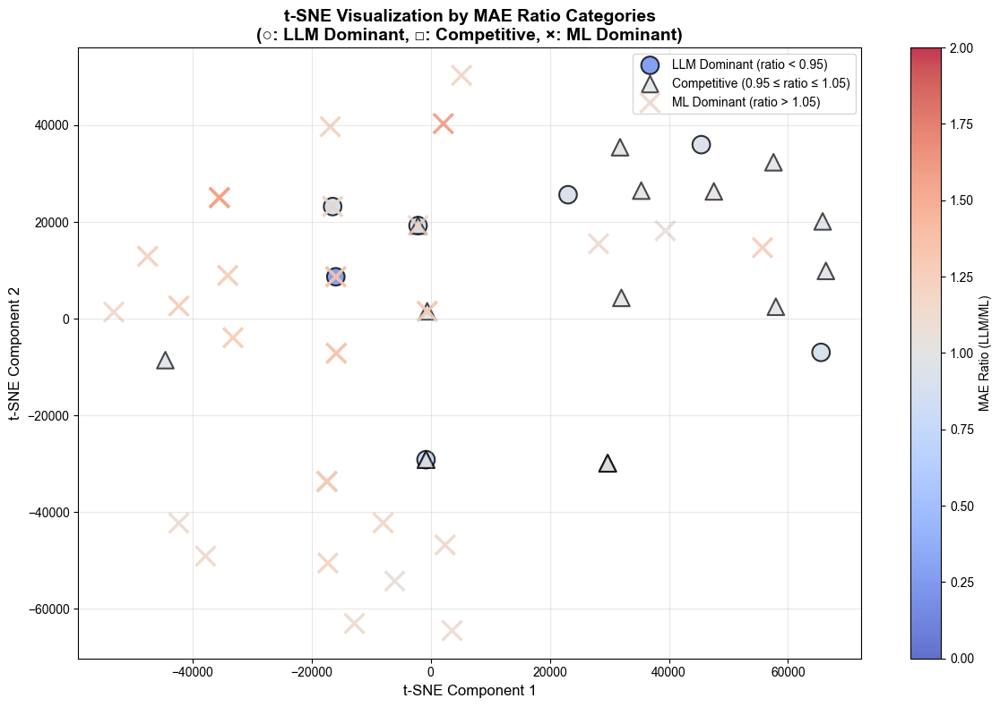

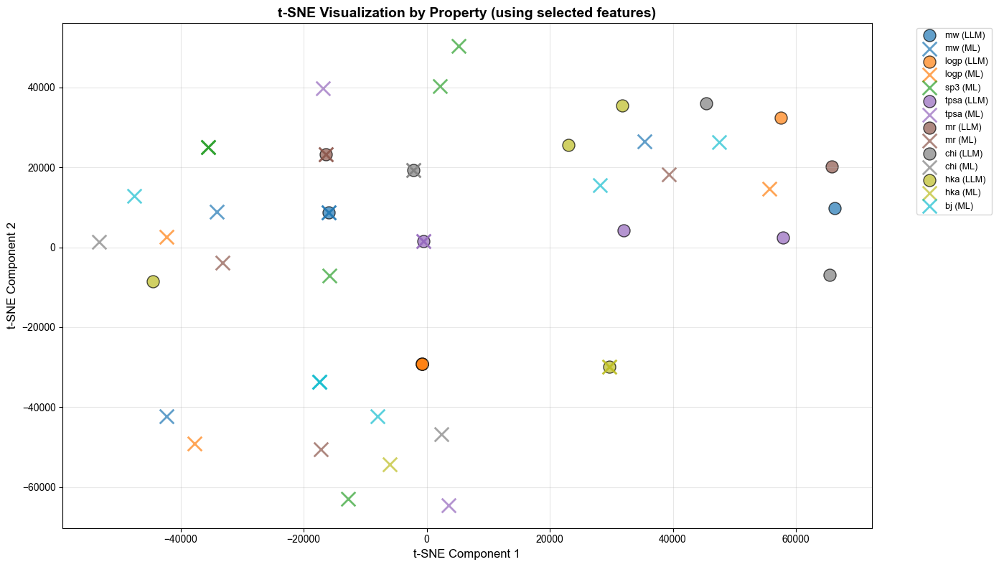

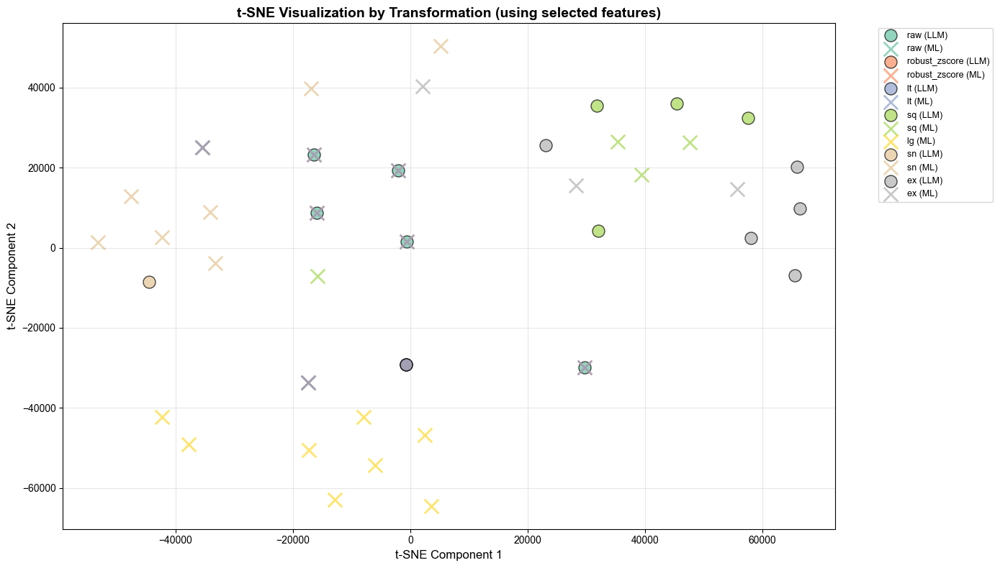

✅ Interactive plot created with plotly

📊 t-SNE Pattern Analysis

🔍 Nearest Neighbors in t-SNE space:

mw_raw (MAE ratio: 0.287):
  → mw_robust_zscore (dist: 0.00, MAE ratio: 1.173)
  → mw_lt (dist: 0.00, MAE ratio: 1.274)
  → mr_raw (dist: 14527.20, MAE ratio: 0.858)

logp_raw (MAE ratio: 0.736):
  → logp_lt (dist: 0.00, MAE ratio: 0.971)
  → logp_robust_zscore (dist: 0.00, MAE ratio: 0.967)
  → bj_lg (dist: 14928.03, MAE ratio: 1.150)

sp3_raw (MAE ratio: 1.131):
  → sp3_lt (dist: 0.00, MAE ratio: 1.484)
  → sp3_robust_zscore (dist: 0.00, MAE ratio: 1.388)
  → mw_sn (dist: 16151.82, MAE ratio: 1.254)

tpsa_raw (MAE ratio: 0.992):
  → tpsa_lt (dist: 0.00, MAE ratio: 1.226)
  → tpsa_robust_zscore (dist: 0.00, MAE ratio: 1.110)
  → mw_raw (dist: 16922.51, MAE ratio: 0.287)

mr_raw (MAE ratio: 0.858):
  → mr_lt (dist: 0.00, MAE ratio: 1.095)
  → mr_raw (dist: 0.00, MAE ratio: 0.858)
  → mw_lt (dist: 14527.20, MAE ratio: 1.274)

📍 Centroids by MAE ratio groups:
  LLM better centroid: (218

In [97]:
tsne_results = run_tsne_analysis_with_feature_selection(enhanced_df, perplexity=20, top_n=31)

In [58]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random
from rdkit import Chem
from rdkit.Chem import Crippen
from rdkit.Chem import Descriptors

# 랜덤한 a와 b 생성
# a = random.uniform(0, 10)
# b = random.uniform(-200, 200)
a = 6.462356980390821
b = -162.75140504630065

# 데이터 불러오기
esol = pd.read_csv('../delaney-processed.csv')

# 'aM_w+b' 열 추가 (분자량은 4번째 열에 있다고 가정)
esol['smiles_len'] = esol['smiles'].apply(len)
esol['aM_w+b'] = a * esol.loc[:, 'Molecular Weight'] + b

# RDKit를 사용하여 물성 값들 계산
esol['LogP'] = esol['smiles'].apply(lambda x: Descriptors.MolLogP(Chem.MolFromSmiles(x)))
esol['TPSA'] = esol['smiles'].apply(lambda x: Descriptors.TPSA(Chem.MolFromSmiles(x)))
esol['sp3'] = esol['smiles'].apply(lambda x: Descriptors.FractionCSP3(Chem.MolFromSmiles(x)))
esol['MolMR'] = esol['smiles'].apply(lambda x: Descriptors.MolMR(Chem.MolFromSmiles(x)))
esol['BJ'] = esol['smiles'].apply(lambda x: Descriptors.BalabanJ(Chem.MolFromSmiles(x)))
esol['Chi'] = esol['smiles'].apply(lambda x: Descriptors.Chi1v(Chem.MolFromSmiles(x)))
esol['HKA'] = esol['smiles'].apply(lambda x: Descriptors.HallKierAlpha(Chem.MolFromSmiles(x)))

print(f"a = {a}, b = {b}")

# Robust Z-score 정규화 함수
def robust_zscore(values, mode):
   """
   Robust Z-score 정규화 함수
   median과 MAD(Median Absolute Deviation)를 사용
   """
   values = np.array(values)
   
   # NaN 값 처리
   valid_mask = ~np.isnan(values)
   if not np.any(valid_mask):
       return values  # 모든 값이 NaN인 경우
   
   valid_values = values[valid_mask]
   
   # Median 계산
   median = np.median(valid_values)
   
   # MAD (Median Absolute Deviation) 계산
   mad = np.median(np.abs(valid_values - median))
   
   # MAD가 0인 경우 (모든 값이 같은 경우) 처리
   if mad == 0:
       return np.zeros_like(values)
   
   # 정규분포 가정 하의 보정계수 1.4826
   # (MAD * 1.4826 ≈ standard deviation for normal distribution)
   robust_std = 1.4826 * mad
   
   # Robust Z-score 계산 ##################################################
   robust_z = (values - median) / robust_std
   if mode == 0:
      return robust_z
   elif mode == 1:
      return robust_z * 1000
   elif mode == 2:
      return robust_z ** 2
   elif mode == 3:
      return np.log(np.abs(robust_z + 1e-3)) + 500 # log 변환 (0으로 나누는 오류 방지)
   elif mode == 4:
      return np.sin(10 * robust_z)
   elif mode == 5:
      return np.exp(robust_z - 10)
      
# 정규화할 물성들 리스트return 500 * np.sin(5 * robust_z)elif mode == 4:

properties_to_normalize = ['Molecular Weight', 'LogP', 'TPSA', 'sp3', 'MolMR', 'BJ', 'Chi', 'HKA']

# 원본 통계량 저장을 위한 딕셔너리
original_stats = {}
normalized_stats = {}

print("\n=== 원본 데이터 통계량 ===")
for prop in properties_to_normalize:
   values = esol[prop].values
   
   # 원본 통계량 계산
   original_stats[prop] = {
       'mean': np.mean(values),
       'median': np.median(values),
       'std': np.std(values),
       'mad': np.median(np.abs(values - np.median(values))),
       'min': np.min(values),
       'max': np.max(values),
       'outlier_ratio': np.sum(np.abs(values - np.mean(values)) > 3 * np.std(values)) / len(values)
   }
   
   print(f"\n{prop}:")
   print(f"  Mean: {original_stats[prop]['mean']:.3f}")
   print(f"  Median: {original_stats[prop]['median']:.3f}")
   print(f"  Std: {original_stats[prop]['std']:.3f}")
   print(f"  MAD: {original_stats[prop]['mad']:.3f}")
   print(f"  Range: [{original_stats[prop]['min']:.3f}, {original_stats[prop]['max']:.3f}]")
   print(f"  Outlier ratio (>3σ): {original_stats[prop]['outlier_ratio']:.3f}")

print("\n=== Robust Z-score 정규화 수행 ===")

# 각 물성에 대해 Robust Z-score 정규화 수행
for prop in properties_to_normalize:
   # 새로운 컬럼명 생성
   raw_col = f"{prop}_raw"
   normalized_col = f"{prop}_robust_zscore"
   lt_col = f"{prop}_lt"
   sq_col = f"{prop}_sq"
   lg_col = f"{prop}_lg"
   sn_col = f"{prop}_sn"
   ex_col = f"{prop}_ex"

   # Robust Z-score 정규화 적용
   esol[raw_col] = esol[prop]  # 원본 데이터 저장
   esol[normalized_col] = robust_zscore(esol[prop], 0)
   esol[lt_col] = robust_zscore(esol[prop], 1)
   esol[sq_col] = robust_zscore(robust_zscore(esol[prop], 2), 0)
   esol[lg_col] = robust_zscore(robust_zscore(esol[prop], 3), 0)
   esol[sn_col] = robust_zscore(robust_zscore(esol[prop], 4), 0)
   esol[ex_col] = robust_zscore(robust_zscore(esol[prop], 5), 0)

   # 정규화 후 통계량 계산
   normalized_values = esol[normalized_col].values
   normalized_stats[prop] = {
       'mean': np.mean(normalized_values),
       'median': np.median(normalized_values),
       'std': np.std(normalized_values),
       'mad': np.median(np.abs(normalized_values - np.median(normalized_values))),
       'min': np.min(normalized_values),
       'max': np.max(normalized_values)
   }
   
   print(f"\n{prop} -> {normalized_col}:")
   print(f"  정규화 후 Mean: {normalized_stats[prop]['mean']:.6f}")
   print(f"  정규화 후 Median: {normalized_stats[prop]['median']:.6f}")
   print(f"  정규화 후 Std: {normalized_stats[prop]['std']:.3f}")
   print(f"  정규화 후 MAD: {normalized_stats[prop]['mad']:.6f}")
   print(f"  정규화 후 Range: [{normalized_stats[prop]['min']:.3f}, {normalized_stats[prop]['max']:.3f}]")

# 정규화 검증
print("\n=== 정규화 검증 ===")
print("Robust Z-score의 특성:")
print("- Median = 0 (정확히 0)")
print("- MAD = 1/1.4826 ≈ 0.6745 (이론값)")
print("\n실제 값들:")
for prop in properties_to_normalize:
   normalized_col = f"{prop}_robust_zscore"
   median_val = normalized_stats[prop]['median']
   mad_val = normalized_stats[prop]['mad']
   theoretical_mad = 1/1.4826
   
   print(f"{prop}:")
   print(f"  Median: {median_val:.6f} (이론값: 0)")
   print(f"  MAD: {mad_val:.6f} (이론값: {theoretical_mad:.6f})")

# 데이터프레임의 새로운 컬럼들 확인
print(f"\n=== 최종 데이터프레임 정보 ===")
print(f"전체 컬럼 수: {len(esol.columns)}")
print("정규화된 컬럼들:")
for prop in properties_to_normalize:
   normalized_col = f"{prop}_robust_zscore"
   print(f"  {normalized_col}")

# 샘플 데이터 확인
print(f"\n=== 샘플 데이터 (첫 5행) ===")
cols_to_show = properties_to_normalize + [f"{prop}_robust_zscore" for prop in properties_to_normalize]
print(esol[cols_to_show].head())

# 선택적: 히스토그램으로 정규화 전후 비교
def plot_before_after_histograms(prop_name, save_plots=False):
   """정규화 전후 히스토그램 비교"""
   fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
   
   # 원본 데이터 히스토그램
   ax1.hist(esol[prop_name], bins=50, alpha=0.7, color='blue', edgecolor='black')
   ax1.set_title(f'Original {prop_name}')
   ax1.set_xlabel(prop_name)
   ax1.set_ylabel('Frequency')
   ax1.grid(True, alpha=0.3)
   
   # 정규화된 데이터 히스토그램
   normalized_col = f"{prop_name}_robust_zscore"
   ax2.hist(esol[normalized_col], bins=50, alpha=0.7, color='red', edgecolor='black')
   ax2.set_title(f'Robust Z-score Normalized {prop_name}')
   ax2.set_xlabel(f'{prop_name} (Robust Z-score)')
   ax2.set_ylabel('Frequency')
   ax2.grid(True, alpha=0.3)
   
   plt.tight_layout()
   
   if save_plots:
       plt.savefig(f'robust_zscore_{prop_name.replace(" ", "_")}.png', dpi=300, bbox_inches='tight')
   
   plt.show()

# 예시: 몇 개 물성의 히스토그램 확인 (선택적으로 실행)
print("\n히스토그램을 확인하려면 다음 함수들을 실행하세요:")
print("plot_before_after_histograms('Molecular Weight')")
print("plot_before_after_histograms('LogP')")
print("plot_before_after_histograms('sp3')")

a = 6.462356980390821, b = -162.75140504630065

=== 원본 데이터 통계량 ===

Molecular Weight:
  Mean: 203.937
  Median: 182.179
  Std: 102.693
  MAD: 70.137
  Range: [16.043, 780.949]
  Outlier ratio (>3σ): 0.004

LogP:
  Mean: 2.448
  Median: 2.339
  Std: 1.852
  MAD: 0.986
  Range: [-7.571, 10.389]
  Outlier ratio (>3σ): 0.012

TPSA:
  Mean: 34.873
  Median: 26.300
  Std: 35.368
  MAD: 26.300
  Range: [0.000, 268.680]
  Outlier ratio (>3σ): 0.011

sp3:
  Mean: 0.444
  Median: 0.357
  Std: 0.375
  MAD: 0.357
  Range: [0.000, 1.000]
  Outlier ratio (>3σ): 0.000

MolMR:
  Mean: 54.016
  Median: 48.523
  Std: 25.268
  MAD: 17.355
  Range: [6.731, 192.611]
  Outlier ratio (>3σ): 0.004

BJ:
  Mean: 2.676
  Median: 2.723
  Std: 0.573
  MAD: 0.355
  Range: [0.000, 4.808]
  Outlier ratio (>3σ): 0.011

Chi:
  Mean: 4.899
  Median: 4.264
  Std: 2.613
  MAD: 1.602
  Range: [0.000, 20.941]
  Outlier ratio (>3σ): 0.009

HKA:
  Mean: -0.920
  Median: -0.920
  Std: 1.010
  MAD: 0.720
  Range: [-4.680, 3.480

In [ ]:
# (이 코드를 실행하기 전, consolidator 객체에 성능 데이터가 로드되어 있어야 합니다.)

def analyze_mae_ratio_per_taskprop(consolidated_df):
    """'consolidated_df'로부터 MAE Ratio를 계산하여 성능 그룹을 정의합니다."""
    print("STEP 1: 성능 데이터로부터 MAE Ratio 계산 중...")
    df = consolidated_df.copy()
    
    is_ml = df['model_type'] == 'ML'
    df['unique_model_name'] = df['model']
    df.loc[is_ml, 'unique_model_name'] = df.loc[is_ml, 'model'] + '_' + df.loc[is_ml, 'embedding']
    df = df.drop_duplicates(subset=['task', 'property', 'unique_model_name'])

    tasks = df['task'].unique()
    properties = df['property'].unique()
    
    ratio_results = []
    for task in tasks:
        for prop in properties:
            cell_data = df[(df['task'] == task) & (df['property'] == prop)]
            llm_data = cell_data[cell_data['model_type'] == 'LLM']
            ml_data = cell_data[cell_data['model_type'] == 'ML']

            if llm_data.empty or ml_data.empty: continue

            mae_llm_avg = llm_data['MAE'].mean()
            mae_ml_avg = ml_data.sort_values('MAE').head(7)['MAE'].mean()
            ratio = mae_llm_avg / mae_ml_avg if mae_ml_avg > 0 else np.nan
            ratio_results.append({'task': task, 'property': prop, 'mae_ratio': ratio})

    ratio_df = pd.DataFrame(ratio_results).dropna()
    
    def assign_performance_group(r):
        if r < 0.9: return 'LLM Superior'
        elif r > 1.1: return 'ML Superior'
        else: return 'Competitive'
    
    ratio_df['performance_group'] = ratio_df['mae_ratio'].apply(assign_performance_group)
    color_map = {'LLM Superior': 'skyblue', 'ML Superior': 'lightcoral', 'Competitive': 'gray'}
    ratio_df['color'] = ratio_df['performance_group'].map(color_map)
    
    print("✅ MAE Ratio 계산 완료.")
    return ratio_df

# --- 1단계 실행 예시 ---
performance_df = (consolidator.consolidated_df)

STEP 1: 성능 데이터로부터 MAE Ratio 계산 중...
✅ MAE Ratio 계산 완료.



STEP 1: 데이터 정렬 및 정합 중...
✅ 데이터 정렬 완료.

STEP 2: t-SNE 분석 및 시각화 진행 중...
✅ 시각화 완료.


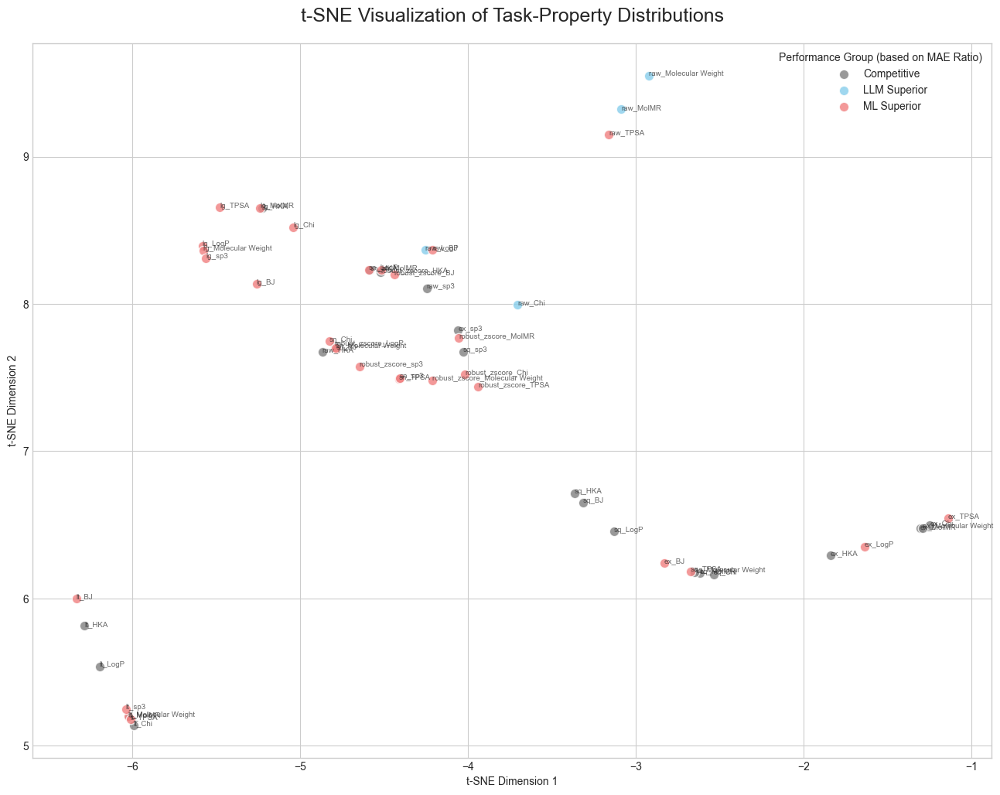

In [152]:
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

def plot_tsne_without_join(feature_df, performance_df):
    """
    (수정) Join 없이, 정렬을 통해 두 데이터프레임을 정합하여
    t-SNE 분석 및 시각화를 수행합니다.
    """
    print("\nSTEP 1: 데이터 정렬 및 정합 중...")
    
    # --- [핵심] 두 데이터프레임을 동일한 순서로 정렬하여 1:1로 매칭 ---
    # 이렇게 하면 인덱스 순서대로 정확히 좌표와 색상이 일치하게 됩니다.
    feature_df_sorted = feature_df.sort_values(by=['task', 'property']).reset_index(drop=True)
    performance_df_sorted = performance_df.sort_values(by=['task', 'property']).reset_index(drop=True)

    if len(feature_df_sorted) != len(performance_df_sorted):
        print(f"❌ 오류: 특성 데이터({len(feature_df_sorted)}개)와 성능 데이터({len(performance_df_sorted)}개)의 개수가 다릅니다.")
        return
    
    print("✅ 데이터 정렬 완료.")
    
    # --- t-SNE 분석 ---
    print("\nSTEP 2: t-SNE 분석 및 시각화 진행 중...")
    
    # 숫자 특성만 선택
    features_numeric = feature_df_sorted.drop(columns=['task', 'property'])
    
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features_numeric)
    
    perplexity_value = min(30, len(features_scaled) - 1) # Perplexity는 샘플 수보다 작아야 함
    tsne = TSNE(n_components=2, perplexity=perplexity_value, random_state=42, init='pca', learning_rate='auto')
    tsne_results = tsne.fit_transform(features_scaled)
    
    # --- 시각화 ---
    # 정렬된 데이터프레임에 t-SNE 좌표와 색상 정보를 추가
    plot_df = feature_df_sorted.copy()
    plot_df['tsne_1'] = tsne_results[:, 0]
    plot_df['tsne_2'] = tsne_results[:, 1]
    plot_df['performance_group'] = performance_df_sorted['performance_group']
    plot_df['color'] = performance_df_sorted['color']

    plt.style.use('seaborn-v0_8-whitegrid')
    fig, ax = plt.subplots(figsize=(16, 12))
    
    # 그룹별로 색상을 다르게 하여 scatter plot 생성
    for name, group in plot_df.groupby('performance_group'):
        ax.scatter(group['tsne_1'], group['tsne_2'], label=name, c=group['color'].iloc[0], s=80, alpha=0.8, edgecolors='w')

    # 모든 점에 레이블 추가
    for i, row in plot_df.iterrows():
        ax.text(row['tsne_1'], row['tsne_2'], f"{row['task']}_{row['property']}", fontsize=7, alpha=0.7)
        
    ax.set_title('t-SNE Visualization of Task-Property Distributions', fontsize=18, pad=20)
    ax.set_xlabel('t-SNE Dimension 1'); ax.set_ylabel('t-SNE Dimension 2')
    ax.legend(title='Performance Group (based on MAE Ratio)')
    
    print("✅ 시각화 완료.")
    plt.show()


# --- 실행 예시 ---
# # 'feature_df'와 'performance_df'가 이미 준비되었다고 가정
# # (feature_df는 create_feature_vectors(esol)로, 
# #  performance_df는 analyze_mae_ratio_per_taskprop(consolidator.consolidated_df)로 생성)

plot_tsne_without_join(feature_df, performance_df)

In [1]:
performance_df, feature_df

NameError: name 'performance_df' is not defined